In [1]:
import sys
import time
sys.path.append('/home/kevinteng/Desktop/BrainTumourSegmentation')
import numpy as np 
import tensorflow as tf
import matplotlib.pyplot as plt
import os, random
import utils
from utils_vis import plot_comparison, plot_labels_color, plot_loss
from utils import compute_metric_dc
import nibabel as nib
from sklearn.model_selection import KFold
%matplotlib inline

- Blue => Label 1 (Necrotic and Non-enhancing Tumor Core)
- Yellow => Label 2 (Peritumoral Edema)
- Green => Label 3/4 (GD-Enhancing Tumor)
---
* Core => Label 1 & 3
* Enhancing => Label 3
* Complete => Label 1,2, 3

---

# Hyperparameter

In [2]:
SHUFFLE_BUFFER = 4000
BATCH_SIZE = 2
lr = 0.0001
opt = tf.keras.optimizers.Adam(lr)
ver = 'model_self_attention_05' #save version
dropout=0.2 #dropout rate
hn = 'he_normal' #kernel initializer 
tfrecords_read_dir = '/home/kevinteng/Desktop/ssd02/BraTS20_tfrecords05/'
stack_npy = "/home/kevinteng/Desktop/ssd02/BraTS2020_stack05/"

---

# Helper Functions

In [3]:
xent = tf.keras.losses.CategoricalCrossentropy()

def generalized_dice(y_true, y_pred, smooth = 1e-5):
    """
    Generalized Dice Score
    https://arxiv.org/pdf/1707.03237
    https://github.com/Mehrdad-Noori/Brain-Tumor-Segmentation/blob/master/loss.py
    """
    
    y_true    = tf.reshape(y_true,shape=(-1,4))
    y_pred    = tf.reshape(y_pred,shape=(-1,4))
    sum_p     = tf.reduce_sum(y_pred, -2)
    sum_r     = tf.reduce_sum(y_true, -2)
    sum_pr    = tf.reduce_sum(y_true * y_pred, -2)
    weights   = tf.math.pow(tf.math.square(sum_r) + smooth, -1)
    generalized_dice = (2 * tf.reduce_sum(weights * sum_pr)) / (tf.reduce_sum(weights * (sum_r + sum_p)))
    return generalized_dice

def generalized_dice_loss(y_true, y_pred):   
    return 1-generalized_dice(y_true, y_pred)
    
def custom_loss(y_true, y_pred):
    
    """
    The final loss function consists of the summation of two losses "GDL" and "CE"
    with a regularization term.
    """
    
    return generalized_dice_loss(y_true, y_pred) + 1.25 * xent(y_true, y_pred)

def data_aug(imgs):
    choice = np.random.randint(0,4)
    #no augmentation 
    if choice==0:
        x = imgs 
    #flip up and down 
    if choice==1:
        x = tf.image.flip_up_down(imgs)
    #flip left and right 
    if choice==2:
        x = tf.image.flip_left_right(imgs)
    #rotation based on angle 
    if choice==3:
        n_rot = np.random.randint(1,4)
        x = tf.image.rot90(imgs, k=n_rot)
    return x

---

# Layer Names

In [4]:
# template for guided attention block
layer_name_p01 = ['pam01_conv01', 'pam01_conv02', 'pam01_softmax', 'pam01_conv03',
                  'pam01_alpha','pam01_add']
layer_name_c01 = ['cam01_softmax', 'cam01_alpha','cam01_add']
layer_name_p02 = ['pam02_conv01', 'pam02_conv02', 'pam02_softmax', 'pam02_conv03',
                  'pam02_alpha', 'pam02_add']
layer_name_c02 = ['cam02_softmax', 'cam02_alpha','cam02_add']
layer_name_template = [layer_name_p01, layer_name_c01, layer_name_p02, layer_name_c02]

layer_name_ga = []
for b in range(1,4):
    layer_block = []
    for layer in layer_name_template:
        layer_internal = [i+'block0{}'.format(b) for i in layer]
        layer_block.append(layer_internal)
    layer_name_ga.append(layer_block)

----

# Model

In [5]:
from tensorflow.keras import Model
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, Activation, Add, Multiply, GaussianNoise
from tensorflow.keras.layers import SeparableConv2D, BatchNormalization, Dropout, concatenate
from utils_model import *
from attention import *

def PAM(inp_feature, layer_name, kernel_initializer='glorot_uniform', acti='relu'):
    '''
    Position attention module
    by default input shape => [w,h,c],[240, 240, 128] hence c/8 = 16
    :param layer_name: List of layer names
    [1st conv block, 2nd conv block, softmax output, 3rd conv block, position coefficient, Add output]
    :param inp_feature: feature maps of res block after up sampling [w,h,c]
    :return: PAM features [w/4,h/4,c]
    '''
    # downsampling by scale of 4 for GPU memory issue
    # inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    # inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    # dimensions
    inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    b,w,h,c = inp_feature.shape
    # scale down ratio
    c_8 = c//8
    #
    assert len(layer_name)>=5, 'Layer list length should be 5!'
    # Branch01 Dimension: [w,h,c/8] => [(wxh),c/8]
    query = conv_2d(inp_feature, filters=c_8, layer_name=layer_name[0], batch_norm=False, kernel_size=(1, 1), acti=acti,
            kernel_initializer=kernel_initializer, dropout_rate=None)
    query = tf.reshape(query,[-1,(w*h),c_8 ])
    # Branch02 Dimension: [w,h,c/8] => [c/8,(wxh)]
    key = conv_2d(inp_feature, filters=c_8, layer_name=layer_name[1], batch_norm=False, kernel_size=(1, 1), acti=acti,
        kernel_initializer=kernel_initializer, dropout_rate=None)
    key = tf.reshape(key, [-1,(w*h),c_8 ])
    key = tf.einsum('bij->bji', key) # transpose/permutation
    # matmul pipeline 01 & 02
    matmul_0102 = tf.einsum('bij,bjk->bik', query, key) # [(wxh),(wxh)]
    #attention coefficient
    alpha_p = Softmax(name=layer_name[2])(matmul_0102) # [(wxh),(wxh)]
    # Branch03
    value = conv_2d(inp_feature, filters=c, layer_name=layer_name[3], batch_norm=False, kernel_size=(1, 1), acti=acti,
        kernel_initializer=kernel_initializer, dropout_rate=None)
    value = tf.reshape(value,[-1,(w*h),c]) # [(wxh),c]
    matmul_all = tf.einsum('bij,bjk->bik',alpha_p,value) # [(wxh),c]
    # Output
    output = tf.reshape(matmul_all, [-1,w,h,c]) # [w,h,c]
    # learnable coefficient to control the importance of CAM
    lambda_p = Conv2D(filters=1,kernel_size=1, padding='same',activation='sigmoid', name=layer_name[4])(inp_feature)
    output = Multiply()([output, lambda_p])
    output_add = Add(name = layer_name[-1])([output, inp_feature])
    return output_add


def CAM(inp_feature, layer_name):
    '''
    Channel attention module
    by default input shape => [w,h,c],[240, 240, 128] hence c/8 = 16
    :param inp_feature: feature maps of res block after up sampling [w,h,c]k
    :param layer_name: List of layer names
        [softmax output, channel attention coefficients, Add output]
    :return: CAM features [w/4,h/4,c]
    '''
    # downsampling by scale of 4 for GPU memory issue
    # inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    # inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    # dimensions
    inp_feature = Conv2D(filters=128,kernel_size=1, strides=2, padding='same',activation='relu')(inp_feature)
    b,w,h,c = inp_feature.shape
    # learnable coefficient to control the importance of CAM
    assert len(layer_name)>=2, 'Layer list length should be 2!'
    # Branch01 Dimension: [w,h,c] => [(wxh),c]
    query = tf.reshape(inp_feature, [-1,(w*h),c])
    # Branch02 Dimension: [w,h,c] => [c,(wxh)]
    key = tf.reshape(inp_feature, [-1,(w*h),c]) # [(wxh),c]
    key = tf.einsum('ijk->ikj', key) # Permute:[c,(wxh)]
    # matmul pipeline 01 & 02
    matmul_0201 = tf.einsum('ijk,ikl->ijl', key, query) # [c,c]
    #attention coefficient
    alpha_c = Softmax(name=layer_name[0])(matmul_0201) # [c,c]
    # Branch03 Dimension: [w,h,c] => [c,(wxh)]
    value = tf.reshape(inp_feature,[-1,(w*h),c]) # [(wxh),c]
    matmul_all = tf.einsum('ijk,ikl->ijl', value, alpha_c) # [(wxh),c]
    # output
    output = tf.reshape(matmul_all,[-1,w,h,c])# [w,h,c]
    # provides learnable parameter
    # *channel wise attention, inspired by Squeeze Excitation(SE) block
    GAP = GlobalAveragePooling2D()(output)
    dense01 = Dense(c//8, activation='relu')(GAP)
    lambda_c = Dense(c,activation='sigmoid', name=layer_name[1])(dense01)
    # outputs
    output = Multiply()([output, lambda_c])
    output_add = Add(name=layer_name[-1])([output, inp_feature])
    return output_add

def guided_attention_block(inp_feature, layer_name_p, layer_name_c):
    '''
    Guided attention block that takes feature as input and concatenates features
    from PAM and CAM as output
    :param inp_feature: Input features
    :param layer_name_p: layer name list for PAM
    :param layer_name_c: layer name list for CAM
    :return: squeezed concatenated features of PAM and CAM
    '''
    pam_feature = PAM(inp_feature, layer_name_p, kernel_initializer=hn)
    cam_feature = CAM(inp_feature, layer_name_c)
    add = Add()([pam_feature,cam_feature]) #[60,60,128]
    up = UpSampling2D(size=(2,2))(add) #[240,240,128]
    squeeze = Conv2D(filters=64, kernel_size=1, padding='same', kernel_initializer=hn,
                       activation='relu')(up)
    #pam and cam features
    feature_pc = [pam_feature, cam_feature]
    return squeeze, feature_pc

def guided_attention(res_feature, ms_feature, layer_name):
    '''
    Guided attention module
    :param res_feature: Upsampled Feature maps from Res Block
    :param ms_feature: Multi scale feature maps result from Res Block
    :param layer_name: Layer Name should consist be a list contating 4 list
    Example:
    layer_name_p01 = ['pam01_conv01', 'pam01_conv02', 'pam01_softmax', 'pam01_conv03',
                      'pam01_alpha','pam01_add']
    layer_name_c01 = ['cam01_softmax', 'cam01_alpha','cam01_add']
    layer_name_p02 = ['pam02_conv01', 'pam02_conv02', 'pam02_softmax', 'pam02_conv03',
                      'pam02_alpha', 'pam02_add']
    layer_name_c02 = ['cam02_softmax', 'cam02_alpha','cam02_add']
    layer_name = [layer_name_p01, layer_name_c01, layer_name_p02, layer_name_c02]

    :return: guided attention module with shape same as input
    '''
    assert len(layer_name)==4, "Layer name should be a list consisting 4 lists!"
    #self attention block01
    concat01 = concatenate([res_feature, ms_feature], axis=-1)
    squeeze01, feature_pc01 = guided_attention_block(concat01, layer_name[0], layer_name[1])
    multi01 = Multiply()([squeeze01, ms_feature])
    #self attention block02
#     concat02 = concatenate([multi01, res_feature],axis=-1)
#     squeeze02 = guided_attention_block(concat02, layer_name[2], layer_name[3])
    return multi01, feature_pc01

def forward(x):
    '''
    Resnet as backbone for multiscale feature retrieval.
    Each resblock output(input signal), next resblock output(gated signal) is
    feed into the gated attention for multi scale feature refinement.
    Each gated attention output is pass through a bottle neck layer to standardize
    the channel size by squashing them to desired filter size of 64.
    The features are upsampled at each block to the corresponding [wxh] dimension
    of w:240, h:240.
    The upsampled features are concat and squash to corresponding channel size of 64
    which yield multiscale feature.
    :param x: batched images
    :return: feature maps of each res block
    '''
    #inject noise
    gauss1 = GaussianNoise(0.01)(x)
    #retrieve input dimension
    b,w,h,c = x.shape
    #---- ResNet and Multiscale Features----
    #1st block
    conv01 = CoordConv(x_dim=w, y_dim=h, with_r=False, filters=64, strides=(1,1),
                      kernel_size = 3, padding='same', kernel_initializer=hn, name='conv01')(gauss1)
    res_block01 = res_block_sep_v2(conv01, filters=[128, 64], layer_name=["conv02", "conv03", "add01"], dropout_rate=None)
    #2nd block
    down_01 = down_sampling_sep_v2(res_block01, filters=128, layer_name = 'down_01',  kernel_initializer=hn,
                               mode='coord',x_dim=w//2, y_dim=w//2)
    res_block02 = res_block_sep_v2(down_01, filters=[256, 128], layer_name=["conv04", "conv05", "add02"], dropout_rate=None)
    #3rd block
    down_02 = down_sampling_sep_v2(res_block02, filters=256, layer_name = 'down_02',  kernel_initializer=hn,
                               mode='coord',x_dim=w//4, y_dim=h//4)
    res_block03 = res_block_sep_v2(down_02, filters=[512, 256], layer_name=["conv06", "conv07", "add03"], dropout_rate=None)
    # *apply activation function for the last output
    res_block03 = PReLU(shared_axes=[1,2])(res_block03)
    #grid attention blocks
    att_block01, g_att01 = attention_block(res_block01,res_block02,64,'grid_att01')
    att_block02, g_att02 = attention_block(res_block02,res_block03,128,'grid_att02')
    #bottle neck => layer squash all attention block to same filter size 64
    bottle01 = Conv2D(filters=64, kernel_size=1, padding='same', kernel_initializer=hn)(att_block01)
    bottle02 = Conv2D(filters=64, kernel_size=1, padding='same', kernel_initializer=hn)(att_block02)
    #upsampling for all layers to same (wxh) dimension=>240x240
    up01 = bottle01 #[240,240,64]
    up02 = UpSampling2D(size=(2, 2), interpolation='bilinear')(bottle02) #[120,120,64]=>[240,240,64]
    #multiscale features
    concat_all = concatenate([up01,up02],axis=-1) #[240,240,3*64]
    #squeeze to have the same channel as upsampled features [240,240,3*64] => [240,240,64]
    ms_feature = Conv2D(filters=64, kernel_size=1, padding='same', kernel_initializer=hn)(concat_all)
    #Segmentations from multiscale features *without softmax activation
    seg_01 = Conv2D(4, (1,1), name='seg_01')(up01)
    seg_02 = Conv2D(4, (1,1), name='seg_02')(up02)

    #----self guided attention blocks-----
    ga_01, f_pc01 = guided_attention(up01, ms_feature, layer_name_ga[0])
    ga_02, f_pc02 = guided_attention(up02, ms_feature, layer_name_ga[1])
    #Segmentations from guided attention features *without softmax activation
    seg_ga01 = Conv2D(4, (1,1), name='seg_ga01')(ga_01)
    seg_ga02 = Conv2D(4, (1,1), name='seg_ga02')(ga_02)
    #outputs for xent losses
    output_xent = [seg_01, seg_02, seg_ga01, seg_ga02]
    #output for dice coefficient loss
    pred_seg = Add()(output_xent)
    output_dice = Softmax()(pred_seg/len(output_xent))
    #output for feature visualization 
    #gated attention 
    gated_attention = [g_att01, g_att02]
    #pam and cam features
    f_pc = [f_pc01, f_pc02]
    return output_xent, output_dice, gated_attention, f_pc 

In [6]:
#Build Model
input_layer = Input(shape=(200,200,4))
model = Model(input_layer, forward(input_layer))

In [7]:
xent_logit = tf.keras.losses.CategoricalCrossentropy(from_logits=True)

@tf.function
def train_fn(image, label):
    with tf.GradientTape() as tape:
        output_xent, output_dice, _, _ = model(image, training=True)
        loss_dice = generalized_dice_loss(label, output_dice)
        loss_xents=[]
        for seg in output_xent:
            l_xent = xent_logit(label, seg)
            loss_xents.append(l_xent)
        loss_xent = sum(loss_xents)
        loss_total = loss_xent+loss_dice
    gradients = tape.gradient(loss_total, model.trainable_variables)
    opt.apply_gradients(zip(gradients, model.trainable_variables))
    losses = [loss_xent, loss_dice, loss_total]
    return output_dice, losses, gradients

---


Epochs  1



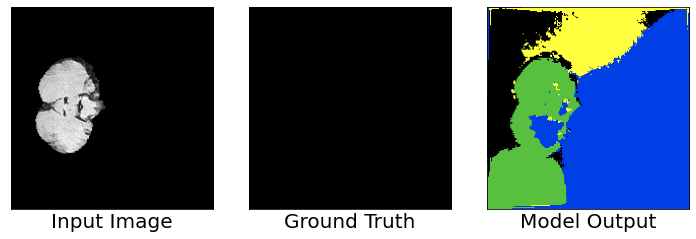

Steps: 1, L_xent:15.846193313598633, L_dice: 1.0
Total Loss: 16.846193313598633
Accurary: 0.15267500281333923
Seq: TC, ET, WT
Dice coefficient: [0.1275, 0.255, 0.23166666666666666]
Gradient min:-17.178207397460938, max:20.912675857543945



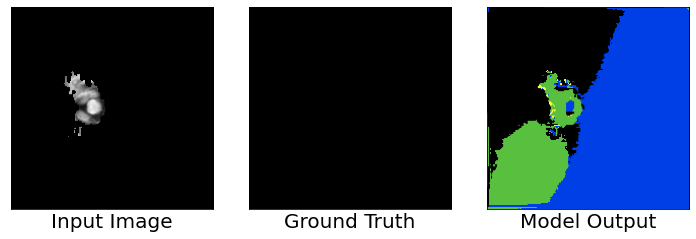

Steps: 2, L_xent:18.169458389282227, L_dice: 1.0
Total Loss: 19.169458389282227
Accurary: 0.3165999948978424
Seq: TC, ET, WT
Dice coefficient: [0.1575, 0.315, 0.38166666666666665]
Gradient min:-9.417092323303223, max:16.04974365234375



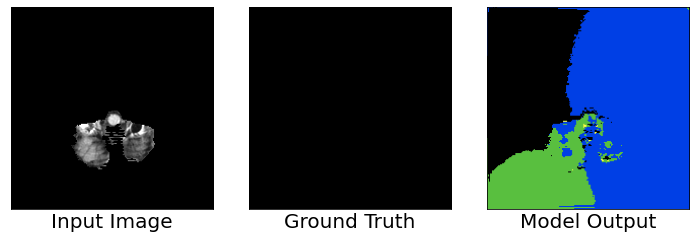

Steps: 3, L_xent:12.213061332702637, L_dice: 1.0
Total Loss: 13.213061332702637
Accurary: 0.29512500762939453
Seq: TC, ET, WT
Dice coefficient: [0.2575, 0.515, 0.4866666666666667]
Gradient min:-3.8735060691833496, max:7.835157871246338



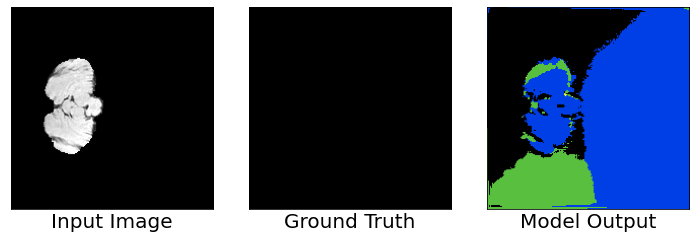

Steps: 4, L_xent:10.147757530212402, L_dice: 0.9941792488098145
Total Loss: 11.141937255859375
Accurary: 0.3114500045776367
Seq: TC, ET, WT
Dice coefficient: [0.1475, 0.295, 0.42333333333333334]
Gradient min:-3.6377670764923096, max:5.980404376983643



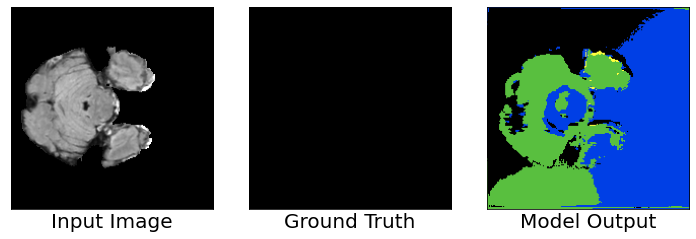

Steps: 5, L_xent:8.897571563720703, L_dice: 1.0
Total Loss: 9.897571563720703
Accurary: 0.28322499990463257
Seq: TC, ET, WT
Dice coefficient: [0.1, 0.195, 0.35]
Gradient min:-2.983867883682251, max:3.4702308177948



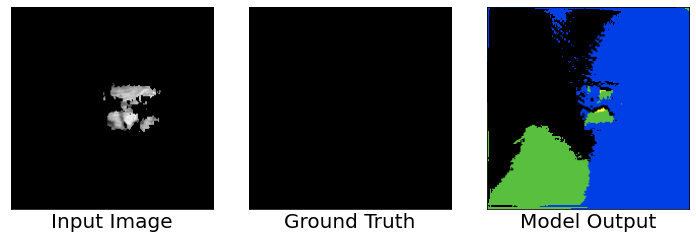

Steps: 6, L_xent:10.9118013381958, L_dice: 1.0
Total Loss: 11.9118013381958
Accurary: 0.3614499866962433
Seq: TC, ET, WT
Dice coefficient: [0.1875, 0.375, 0.445]
Gradient min:-7.874919414520264, max:16.451871871948242



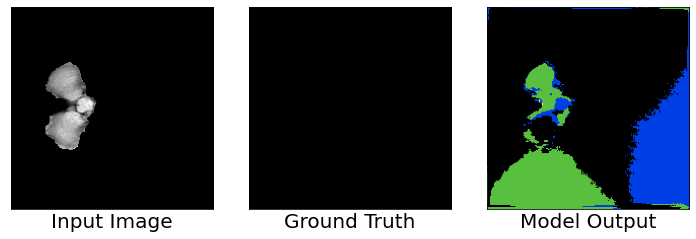

Steps: 7, L_xent:6.619965553283691, L_dice: 1.0
Total Loss: 7.619965553283691
Accurary: 0.666225016117096
Seq: TC, ET, WT
Dice coefficient: [0.1375, 0.27, 0.41333333333333333]
Gradient min:-1.2851656675338745, max:1.5908066034317017



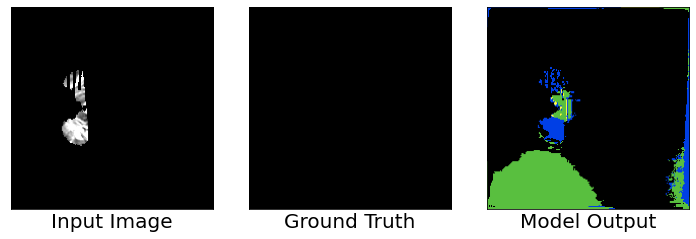

Steps: 8, L_xent:6.279873847961426, L_dice: 0.9995593428611755
Total Loss: 7.279433250427246
Accurary: 0.8042250275611877
Seq: TC, ET, WT
Dice coefficient: [0.17, 0.335, 0.39666666666666667]
Gradient min:-0.39832478761672974, max:0.3504316806793213



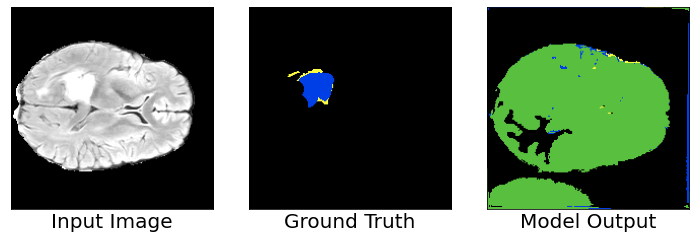

Steps: 9, L_xent:6.271295547485352, L_dice: 1.0
Total Loss: 7.271295547485352
Accurary: 0.5064499974250793
Seq: TC, ET, WT
Dice coefficient: [0.0925, 0.165, 0.32166666666666666]
Gradient min:-0.6581818461418152, max:1.6511316299438477



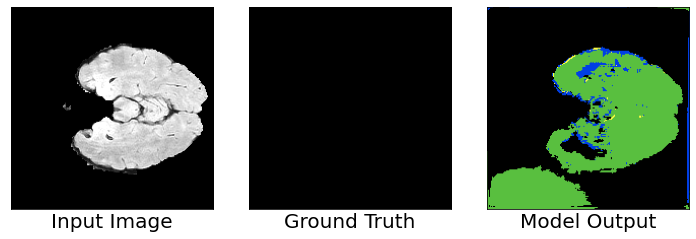

Steps: 10, L_xent:6.18133020401001, L_dice: 0.9819492101669312
Total Loss: 7.1632795333862305
Accurary: 0.6175249814987183
Seq: TC, ET, WT
Dice coefficient: [0.11, 0.19, 0.33666666666666667]
Gradient min:-0.39788368344306946, max:0.3794342577457428



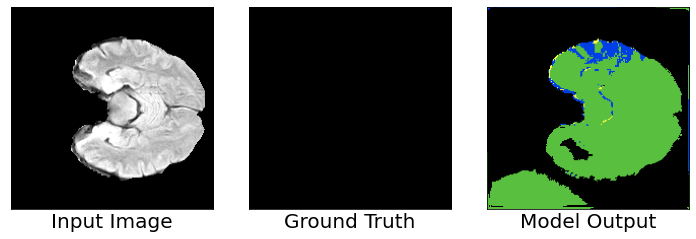

Steps: 11, L_xent:6.061365127563477, L_dice: 1.0
Total Loss: 7.061365127563477
Accurary: 0.5778499841690063
Seq: TC, ET, WT
Dice coefficient: [0.16, 0.15, 0.3466666666666667]
Gradient min:-0.2666979730129242, max:0.35524943470954895



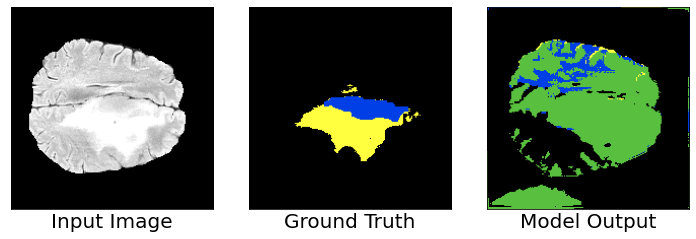

Steps: 12, L_xent:5.8324809074401855, L_dice: 1.0
Total Loss: 6.8324809074401855
Accurary: 0.6215749979019165
Seq: TC, ET, WT
Dice coefficient: [0.2225, 0.145, 0.305]
Gradient min:-0.408685564994812, max:0.3783710300922394



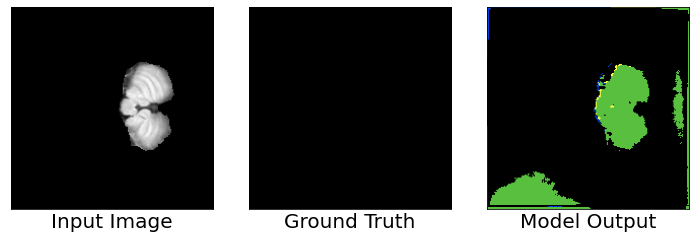

Steps: 13, L_xent:5.598386287689209, L_dice: 1.0
Total Loss: 6.598386287689209
Accurary: 0.8366749882698059
Seq: TC, ET, WT
Dice coefficient: [0.2975, 0.035, 0.4666666666666667]
Gradient min:-0.6620203852653503, max:0.6525715589523315



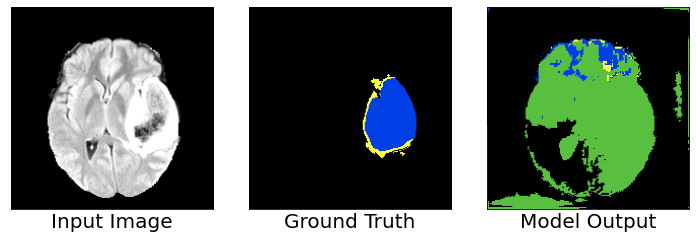

Steps: 14, L_xent:5.310306549072266, L_dice: 1.0
Total Loss: 6.310306549072266
Accurary: 0.6269000172615051
Seq: TC, ET, WT
Dice coefficient: [0.2075, 0.13, 0.2783333333333333]
Gradient min:-0.3473777174949646, max:0.4316694438457489



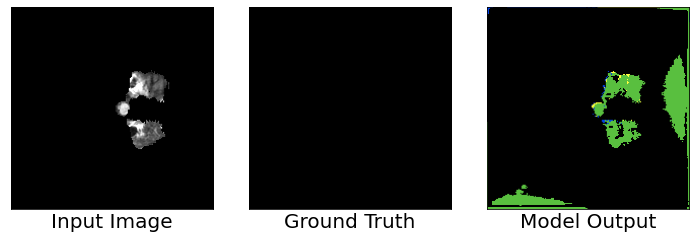

Steps: 15, L_xent:5.29138708114624, L_dice: 0.9996019005775452
Total Loss: 6.290988922119141
Accurary: 0.8841999769210815
Seq: TC, ET, WT
Dice coefficient: [0.3825, 0.005, 0.545]
Gradient min:-0.20698411762714386, max:0.20111894607543945



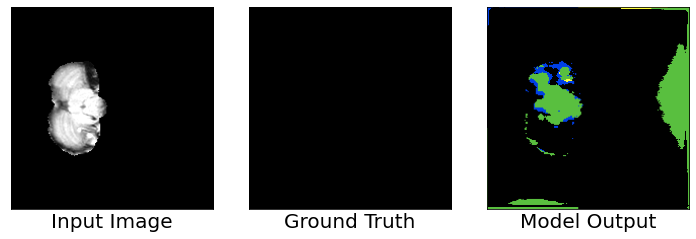

Steps: 16, L_xent:5.070043087005615, L_dice: 1.0
Total Loss: 6.070043087005615
Accurary: 0.8597750067710876
Seq: TC, ET, WT
Dice coefficient: [0.29, 0.005, 0.515]
Gradient min:-0.24227017164230347, max:0.1907035857439041



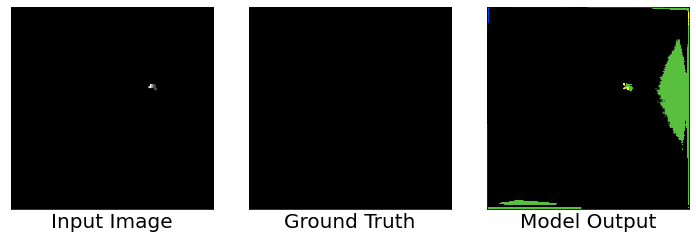

Steps: 17, L_xent:5.205636978149414, L_dice: 1.0
Total Loss: 6.205636978149414
Accurary: 0.9173750281333923
Seq: TC, ET, WT
Dice coefficient: [0.46, 0.06, 0.5883333333333334]
Gradient min:-0.20180445909500122, max:0.22088488936424255



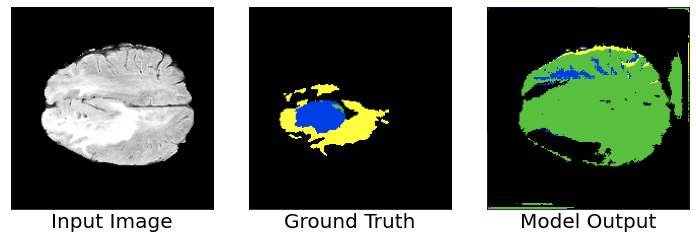

Steps: 18, L_xent:5.263935089111328, L_dice: 0.9921459555625916
Total Loss: 6.2560811042785645
Accurary: 0.6443750262260437
Seq: TC, ET, WT
Dice coefficient: [0.38397207317641, 0.18774414635729045, 0.34764804878427336]
Gradient min:-0.23887421190738678, max:0.17330029606819153



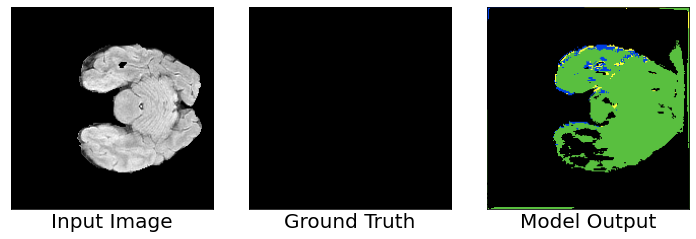

Steps: 19, L_xent:5.0490193367004395, L_dice: 1.0
Total Loss: 6.0490193367004395
Accurary: 0.7006750106811523
Seq: TC, ET, WT
Dice coefficient: [0.35, 0.085, 0.4216666666666667]
Gradient min:-0.19438482820987701, max:0.2083006352186203



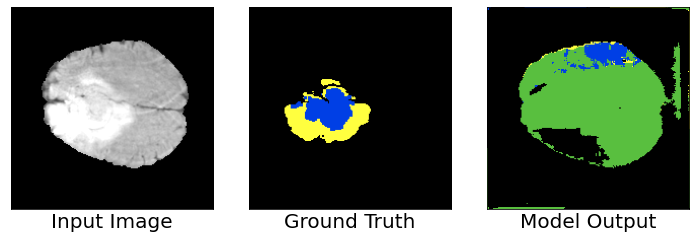

Steps: 20, L_xent:5.317180156707764, L_dice: 1.0
Total Loss: 6.317180156707764
Accurary: 0.6485249996185303
Seq: TC, ET, WT
Dice coefficient: [0.3875, 0.165, 0.37166666666666665]
Gradient min:-0.2864992320537567, max:0.19324229657649994



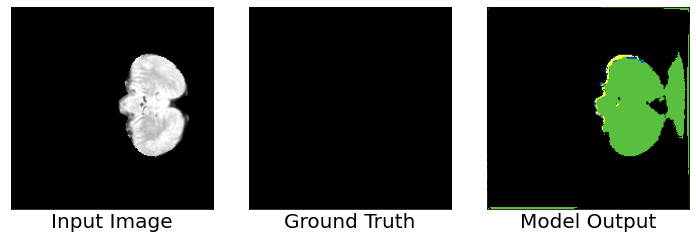

Steps: 21, L_xent:4.97814416885376, L_dice: 1.0
Total Loss: 5.97814416885376
Accurary: 0.822825014591217
Seq: TC, ET, WT
Dice coefficient: [0.47, 0.115, 0.505]
Gradient min:-0.217821404337883, max:0.19080065190792084



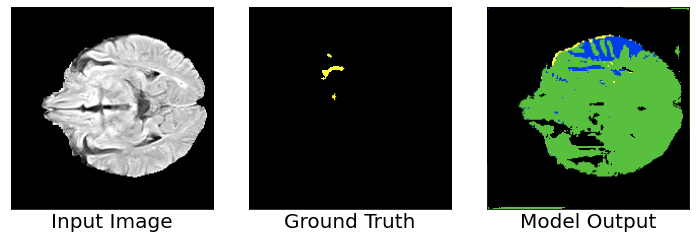

Steps: 22, L_xent:5.129012107849121, L_dice: 0.9997960329055786
Total Loss: 6.12880802154541
Accurary: 0.6086000204086304
Seq: TC, ET, WT
Dice coefficient: [0.3825, 0.15, 0.39]
Gradient min:-0.15910665690898895, max:0.1827724575996399



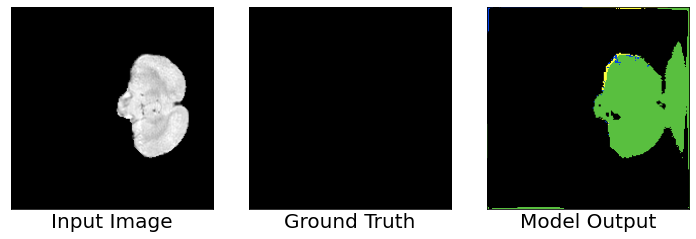

Steps: 23, L_xent:4.799120903015137, L_dice: 1.0
Total Loss: 5.799120903015137
Accurary: 0.7978749871253967
Seq: TC, ET, WT
Dice coefficient: [0.375, 0.005, 0.475]
Gradient min:-0.1860201507806778, max:0.13053882122039795



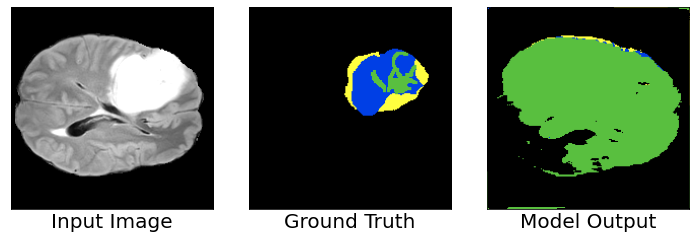

Steps: 24, L_xent:4.812203884124756, L_dice: 0.9687318801879883
Total Loss: 5.780935764312744
Accurary: 0.581849992275238
Seq: TC, ET, WT
Dice coefficient: [0.38970025231130423, 0.17604243153706192, 0.4314668348742028]
Gradient min:-0.22042760252952576, max:0.17169468104839325



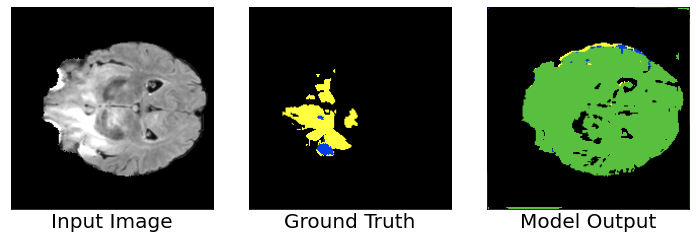

Steps: 25, L_xent:5.047399997711182, L_dice: 1.0
Total Loss: 6.047399997711182
Accurary: 0.6194999814033508
Seq: TC, ET, WT
Dice coefficient: [0.4675, 0.185, 0.4083333333333333]
Gradient min:-0.35163912177085876, max:0.22296811640262604



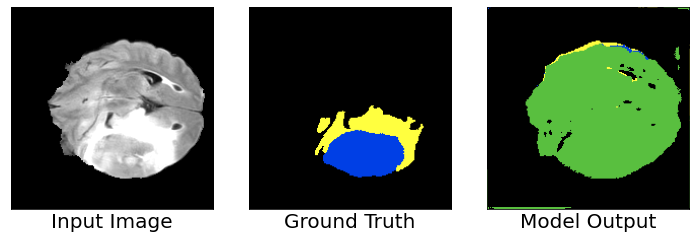

Steps: 26, L_xent:5.127688407897949, L_dice: 1.0
Total Loss: 6.127688407897949
Accurary: 0.602275013923645
Seq: TC, ET, WT
Dice coefficient: [0.4125, 0.17, 0.39166666666666666]
Gradient min:-0.19106048345565796, max:0.12262210249900818



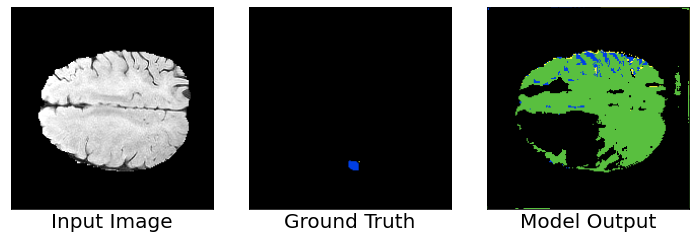

Steps: 27, L_xent:4.67325496673584, L_dice: 1.0
Total Loss: 5.67325496673584
Accurary: 0.7353000044822693
Seq: TC, ET, WT
Dice coefficient: [0.4625, 0.205, 0.49333333333333335]
Gradient min:-0.16550740599632263, max:0.2340225875377655



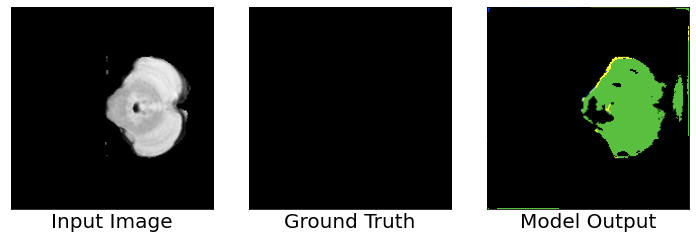

Steps: 28, L_xent:4.564667701721191, L_dice: 1.0
Total Loss: 5.564667701721191
Accurary: 0.8469250202178955
Seq: TC, ET, WT
Dice coefficient: [0.5075, 0.15, 0.5033333333333333]
Gradient min:-0.9269510507583618, max:2.1525421142578125



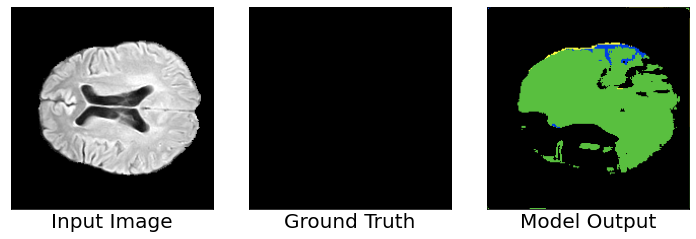

Steps: 29, L_xent:4.657264232635498, L_dice: 1.0
Total Loss: 5.657264232635498
Accurary: 0.691474974155426
Seq: TC, ET, WT
Dice coefficient: [0.52, 0.18, 0.495]
Gradient min:-0.3287818729877472, max:0.2570652961730957



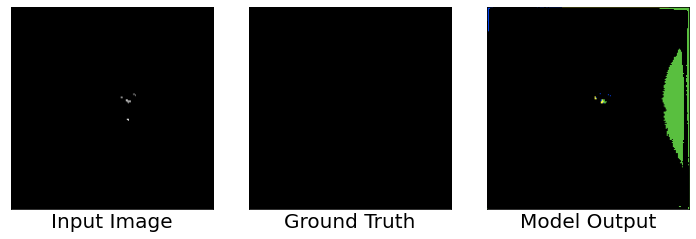

Steps: 30, L_xent:4.334281921386719, L_dice: 1.0
Total Loss: 5.334281921386719
Accurary: 0.9373000264167786
Seq: TC, ET, WT
Dice coefficient: [0.4225, 0.005, 0.6]
Gradient min:-0.42634883522987366, max:0.5073122382164001



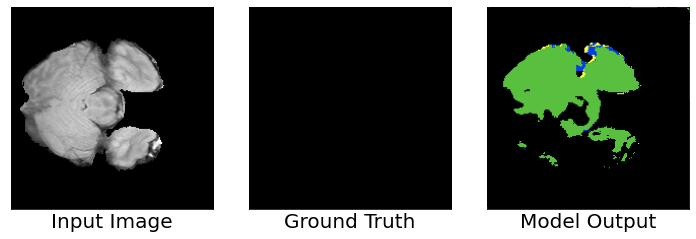

Steps: 31, L_xent:4.554564476013184, L_dice: 1.0
Total Loss: 5.554564476013184
Accurary: 0.8014500141143799
Seq: TC, ET, WT
Dice coefficient: [0.4875, 0.17, 0.52]
Gradient min:-0.19987748563289642, max:0.38899728655815125



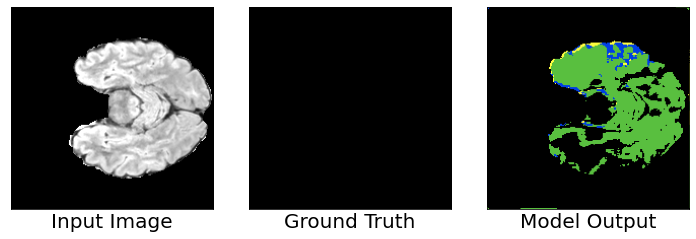

Steps: 32, L_xent:4.455659866333008, L_dice: 1.0
Total Loss: 5.455659866333008
Accurary: 0.7669249773025513
Seq: TC, ET, WT
Dice coefficient: [0.42, 0.175, 0.485]
Gradient min:-0.27493345737457275, max:0.21007727086544037



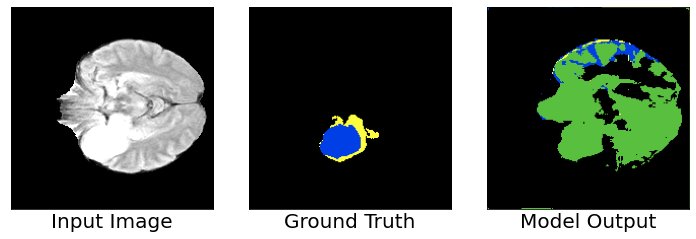

Steps: 33, L_xent:4.3886332511901855, L_dice: 1.0
Total Loss: 5.3886332511901855
Accurary: 0.7340999841690063
Seq: TC, ET, WT
Dice coefficient: [0.345, 0.165, 0.33]
Gradient min:-0.2001836895942688, max:0.26507145166397095



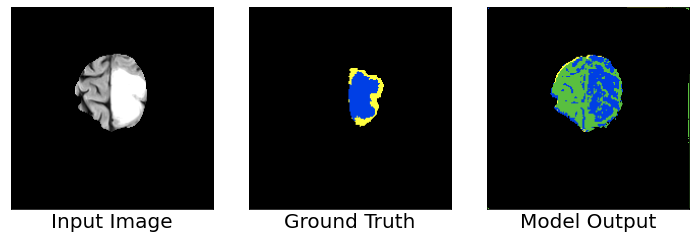

Steps: 34, L_xent:4.337400913238525, L_dice: 1.0
Total Loss: 5.337400913238525
Accurary: 0.9103749990463257
Seq: TC, ET, WT
Dice coefficient: [0.49651555094867944, 0.235, 0.5376770339657863]
Gradient min:-0.4041742980480194, max:0.32923588156700134



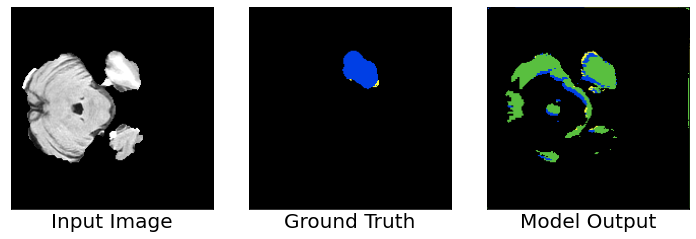

Steps: 35, L_xent:4.1205339431762695, L_dice: 1.0
Total Loss: 5.1205339431762695
Accurary: 0.9083499908447266
Seq: TC, ET, WT
Dice coefficient: [0.4428593717236072, 0.215, 0.5335729144824047]
Gradient min:-0.43104037642478943, max:0.6421319246292114



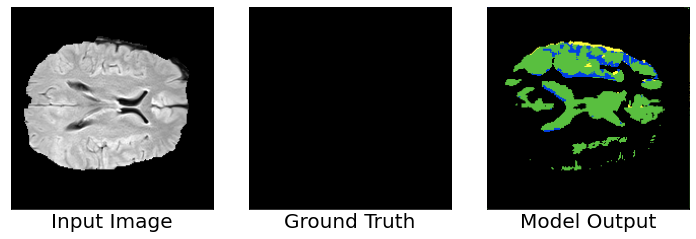

Steps: 36, L_xent:4.26573371887207, L_dice: 1.0
Total Loss: 5.26573371887207
Accurary: 0.8251749873161316
Seq: TC, ET, WT
Dice coefficient: [0.415, 0.17, 0.51]
Gradient min:-0.3272169828414917, max:0.17272767424583435



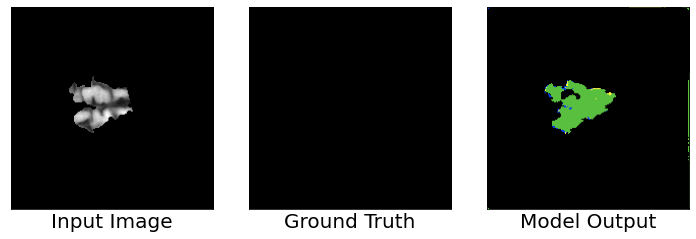

Steps: 37, L_xent:4.119137763977051, L_dice: 1.0
Total Loss: 5.119137763977051
Accurary: 0.9435250163078308
Seq: TC, ET, WT
Dice coefficient: [0.5725, 0.315, 0.6816666666666666]
Gradient min:-0.1152491420507431, max:0.1669708490371704



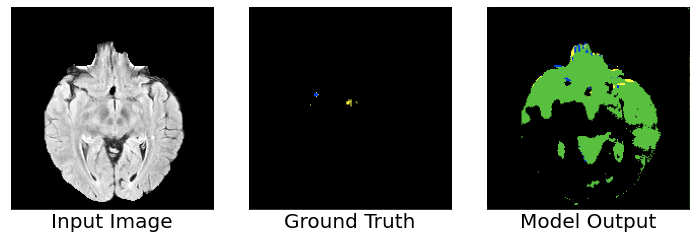

Steps: 38, L_xent:4.036328315734863, L_dice: 1.0
Total Loss: 5.036328315734863
Accurary: 0.8222249746322632
Seq: TC, ET, WT
Dice coefficient: [0.48, 0.175, 0.5483333333333333]
Gradient min:-0.1470247209072113, max:0.1835414618253708



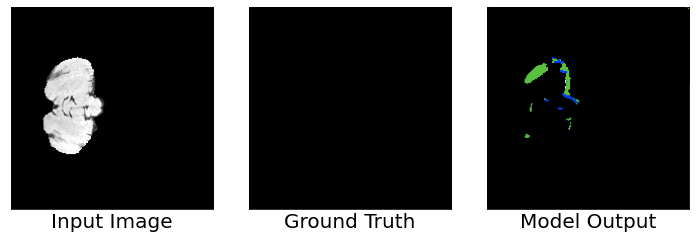

Steps: 39, L_xent:3.975428581237793, L_dice: 1.0
Total Loss: 4.975428581237793
Accurary: 0.9788749814033508
Seq: TC, ET, WT
Dice coefficient: [0.555, 0.25, 0.695]
Gradient min:-0.22619149088859558, max:0.1914355456829071



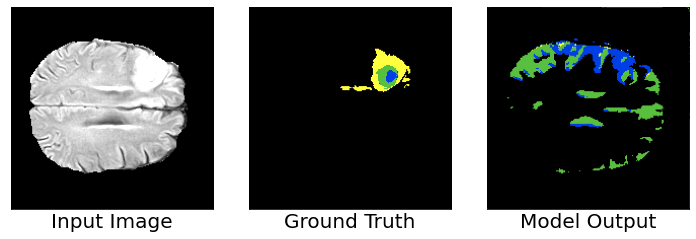

Steps: 40, L_xent:3.954303026199341, L_dice: 0.9935302734375
Total Loss: 4.947833061218262
Accurary: 0.8834499716758728
Seq: TC, ET, WT
Dice coefficient: [0.45420332698151467, 0.1925303198583424, 0.5396203998103738]
Gradient min:-0.13562731444835663, max:0.1988278329372406



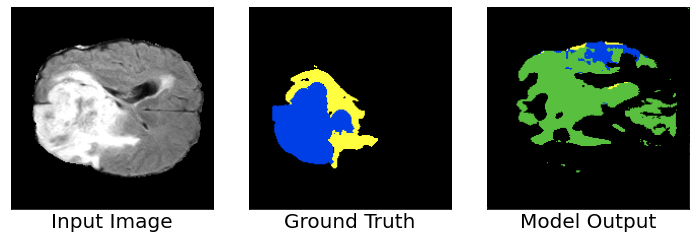

Steps: 41, L_xent:4.275026798248291, L_dice: 1.0
Total Loss: 5.275026798248291
Accurary: 0.7216249704360962
Seq: TC, ET, WT
Dice coefficient: [0.315, 0.205, 0.355]
Gradient min:-0.2962781488895416, max:0.2273423671722412



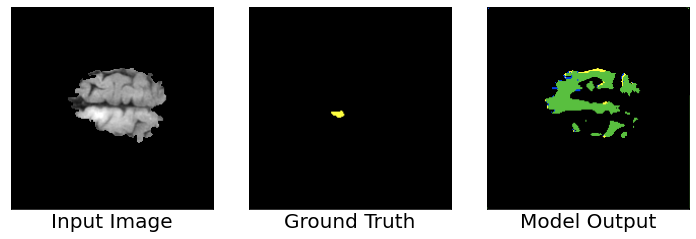

Steps: 42, L_xent:3.8515844345092773, L_dice: 1.0
Total Loss: 4.851584434509277
Accurary: 0.9365000128746033
Seq: TC, ET, WT
Dice coefficient: [0.57, 0.31, 0.6483333333333333]
Gradient min:-0.245988667011261, max:0.2675102651119232



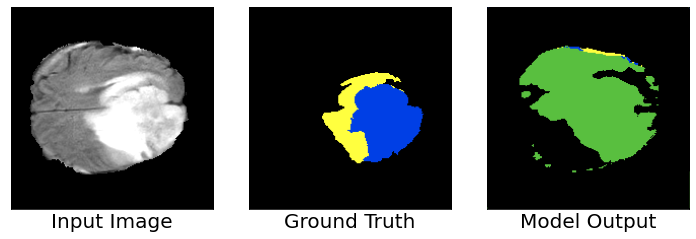

Steps: 43, L_xent:4.1352362632751465, L_dice: 1.0
Total Loss: 5.1352362632751465
Accurary: 0.7403249740600586
Seq: TC, ET, WT
Dice coefficient: [0.365, 0.195, 0.405]
Gradient min:-0.6602044105529785, max:0.2527718245983124



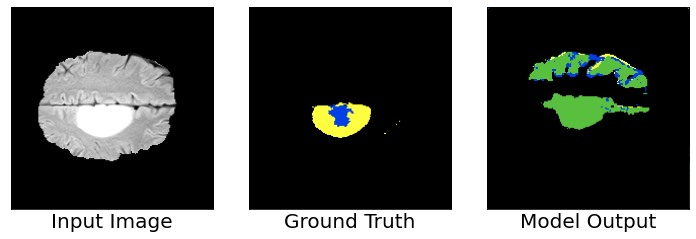

Steps: 44, L_xent:3.806285858154297, L_dice: 1.0
Total Loss: 4.806285858154297
Accurary: 0.8811749815940857
Seq: TC, ET, WT
Dice coefficient: [0.5225, 0.385, 0.58]
Gradient min:-0.2986445724964142, max:0.2202645093202591



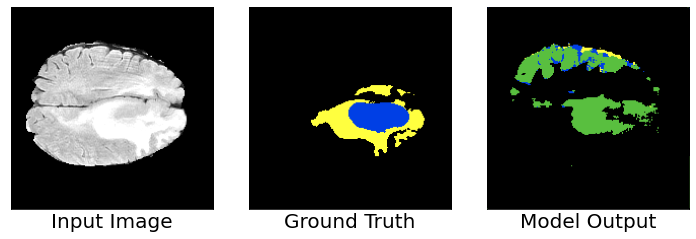

Steps: 45, L_xent:3.897430658340454, L_dice: 1.0
Total Loss: 4.897430419921875
Accurary: 0.833424985408783
Seq: TC, ET, WT
Dice coefficient: [0.48, 0.31, 0.5016666666666667]
Gradient min:-0.4166308343410492, max:0.21361799538135529



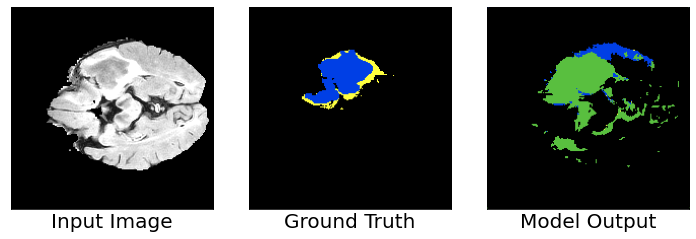

Steps: 46, L_xent:3.766202688217163, L_dice: 0.9998367428779602
Total Loss: 4.7660393714904785
Accurary: 0.8823500275611877
Seq: TC, ET, WT
Dice coefficient: [0.5503641362208873, 0.43547379031777383, 0.5952427574805915]
Gradient min:-0.3780063986778259, max:0.20115329325199127



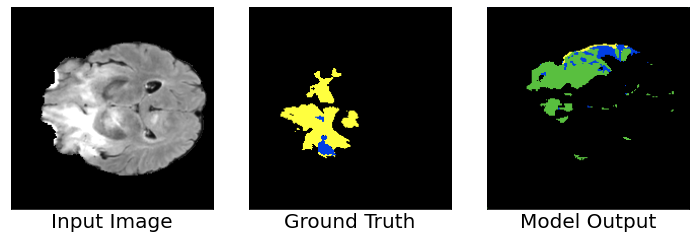

Steps: 47, L_xent:4.113247394561768, L_dice: 1.0
Total Loss: 5.113247394561768
Accurary: 0.8719499707221985
Seq: TC, ET, WT
Dice coefficient: [0.6225, 0.575, 0.5716666666666667]
Gradient min:-0.41512951254844666, max:0.7582337260246277



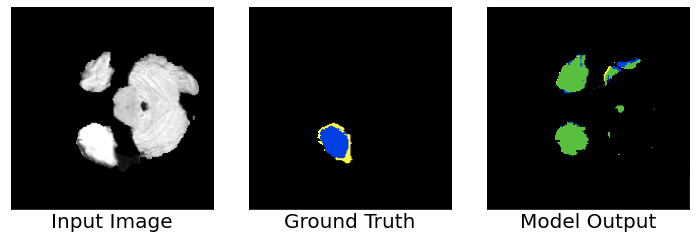

Steps: 48, L_xent:3.6452178955078125, L_dice: 0.9999302625656128
Total Loss: 4.645148277282715
Accurary: 0.9417750239372253
Seq: TC, ET, WT
Dice coefficient: [0.5451470588240772, 0.4502941176481545, 0.5984313725493848]
Gradient min:-0.33965063095092773, max:0.21485555171966553



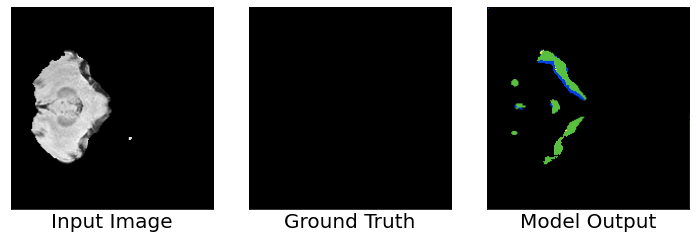

Steps: 49, L_xent:3.4710822105407715, L_dice: 1.0
Total Loss: 4.4710822105407715
Accurary: 0.9637500047683716
Seq: TC, ET, WT
Dice coefficient: [0.4725, 0.22, 0.635]
Gradient min:-0.3337578773498535, max:0.2187892198562622



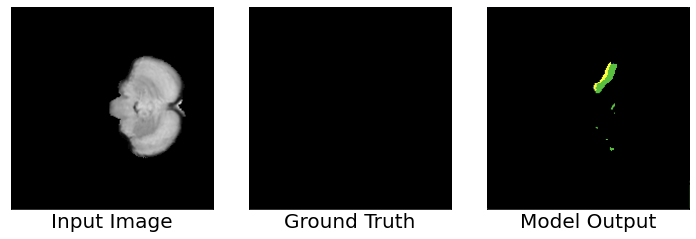

Steps: 50, L_xent:3.6115024089813232, L_dice: 1.0
Total Loss: 4.611502647399902
Accurary: 0.988349974155426
Seq: TC, ET, WT
Dice coefficient: [0.8125, 0.65, 0.8266666666666667]
Gradient min:-0.3105108141899109, max:0.6337074637413025



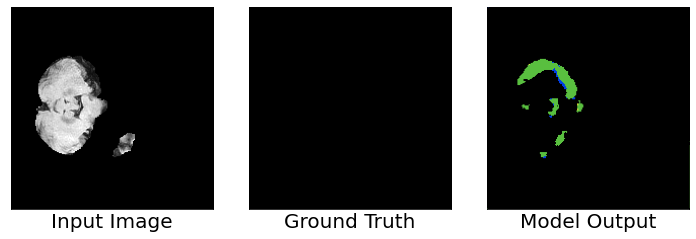

Steps: 51, L_xent:3.437148332595825, L_dice: 1.0
Total Loss: 4.437148094177246
Accurary: 0.9678999781608582
Seq: TC, ET, WT
Dice coefficient: [0.5825, 0.335, 0.7133333333333334]
Gradient min:-0.7661951780319214, max:0.35414591431617737



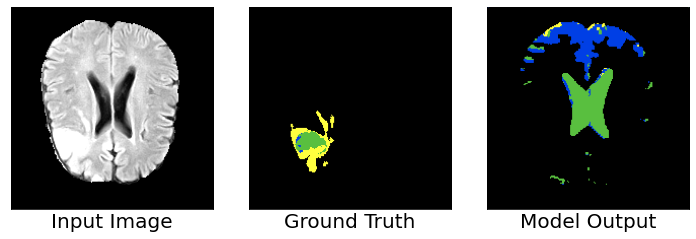

Steps: 52, L_xent:3.7787444591522217, L_dice: 0.9994630217552185
Total Loss: 4.778207302093506
Accurary: 0.8618999719619751
Seq: TC, ET, WT
Dice coefficient: [0.385, 0.34, 0.4533333333333333]
Gradient min:-0.47762060165405273, max:0.23843644559383392



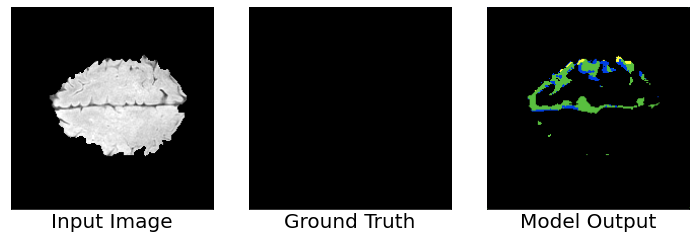

Steps: 53, L_xent:3.380892515182495, L_dice: 1.0
Total Loss: 4.380892753601074
Accurary: 0.9509999752044678
Seq: TC, ET, WT
Dice coefficient: [0.7275, 0.675, 0.7933333333333333]
Gradient min:-0.3271489441394806, max:0.21128351986408234



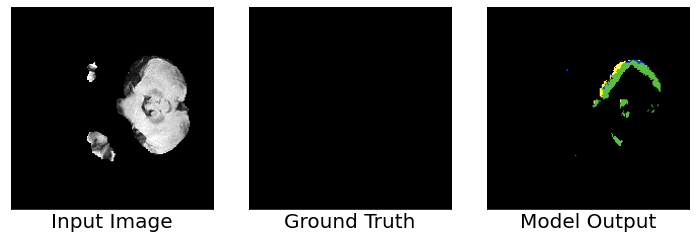

Steps: 54, L_xent:3.332818031311035, L_dice: 1.0
Total Loss: 4.332818031311035
Accurary: 0.9766499996185303
Seq: TC, ET, WT
Dice coefficient: [0.7525, 0.64, 0.765]
Gradient min:-0.2952589690685272, max:0.20611421763896942



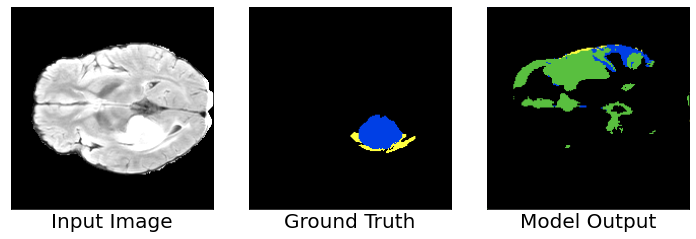

Steps: 55, L_xent:3.4394640922546387, L_dice: 1.0
Total Loss: 4.439464092254639
Accurary: 0.8709750175476074
Seq: TC, ET, WT
Dice coefficient: [0.6, 0.56, 0.67]
Gradient min:-0.44857797026634216, max:0.18593505024909973



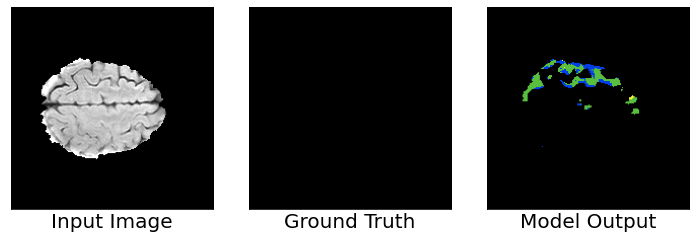

Steps: 56, L_xent:3.17598557472229, L_dice: 0.9998319745063782
Total Loss: 4.175817489624023
Accurary: 0.9659500122070312
Seq: TC, ET, WT
Dice coefficient: [0.7725, 0.73, 0.8383333333333334]
Gradient min:-0.25295543670654297, max:0.21621918678283691



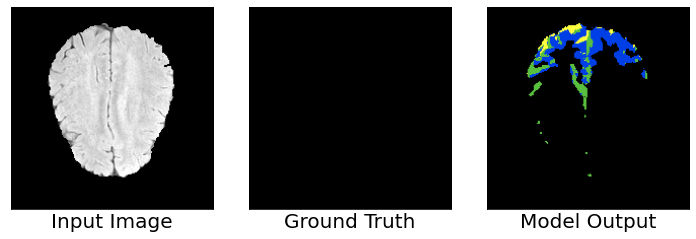

Steps: 57, L_xent:3.240083694458008, L_dice: 0.9933167695999146
Total Loss: 4.233400344848633
Accurary: 0.9216750264167786
Seq: TC, ET, WT
Dice coefficient: [0.6025, 0.52, 0.6766666666666666]
Gradient min:-0.22684143483638763, max:0.4535672962665558



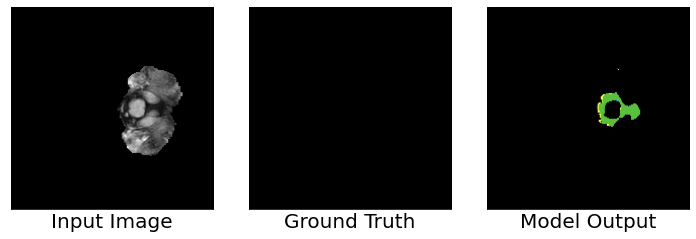

Steps: 58, L_xent:3.165956735610962, L_dice: 1.0
Total Loss: 4.165956497192383
Accurary: 0.9836500287055969
Seq: TC, ET, WT
Dice coefficient: [0.8925, 0.83, 0.8816666666666667]
Gradient min:-0.332048624753952, max:0.1820964366197586



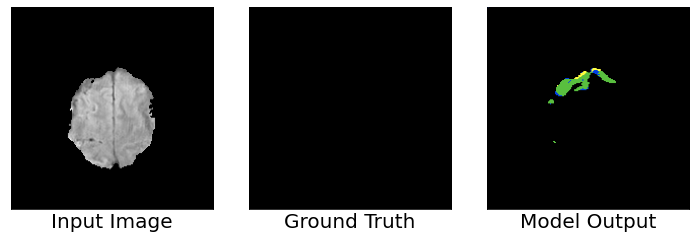

Steps: 59, L_xent:2.957441806793213, L_dice: 1.0
Total Loss: 3.957441806793213
Accurary: 0.982200026512146
Seq: TC, ET, WT
Dice coefficient: [0.8625, 0.845, 0.8883333333333333]
Gradient min:-0.3511342704296112, max:0.30046892166137695



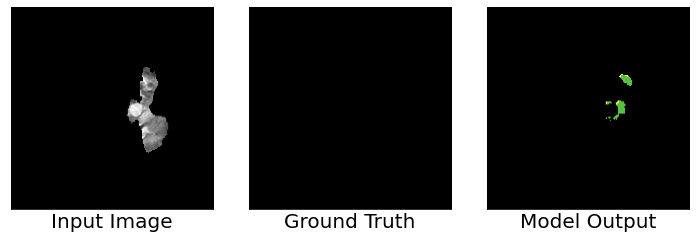

Steps: 60, L_xent:3.0335280895233154, L_dice: 1.0
Total Loss: 4.0335283279418945
Accurary: 0.9936500191688538
Seq: TC, ET, WT
Dice coefficient: [0.915, 0.845, 0.93]
Gradient min:-0.3800528347492218, max:0.42118018865585327



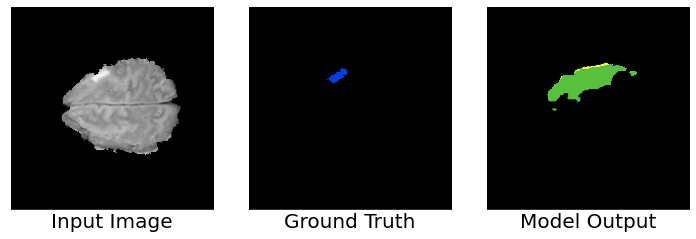

Steps: 61, L_xent:2.943671941757202, L_dice: 1.0
Total Loss: 3.943671941757202
Accurary: 0.9611499905586243
Seq: TC, ET, WT
Dice coefficient: [0.8525, 0.805, 0.88]
Gradient min:-0.27325010299682617, max:0.2734673023223877



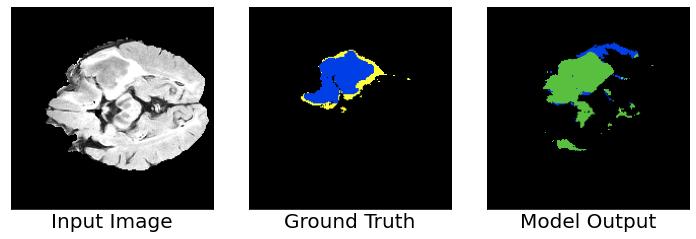

Steps: 62, L_xent:3.329996109008789, L_dice: 0.9988826513290405
Total Loss: 4.328878879547119
Accurary: 0.9107999801635742
Seq: TC, ET, WT
Dice coefficient: [0.6040725885983557, 0.5501754385977984, 0.6327150590655705]
Gradient min:-0.3317326605319977, max:0.1189911961555481



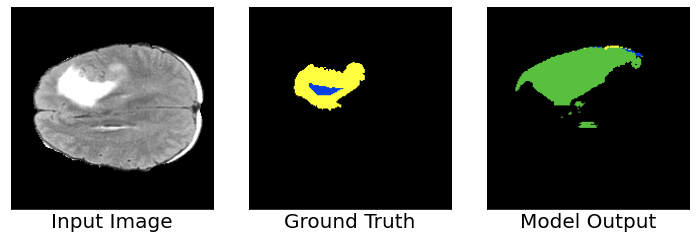

Steps: 63, L_xent:3.3739686012268066, L_dice: 0.9988695979118347
Total Loss: 4.372838020324707
Accurary: 0.8955000042915344
Seq: TC, ET, WT
Dice coefficient: [0.7575, 0.64, 0.75]
Gradient min:-0.27667391300201416, max:0.1533416211605072



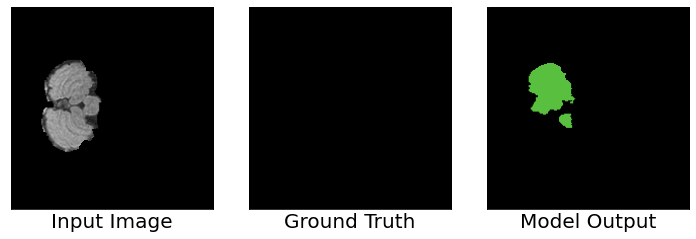

Steps: 64, L_xent:2.8586373329162598, L_dice: 1.0
Total Loss: 3.8586373329162598
Accurary: 0.9560750126838684
Seq: TC, ET, WT
Dice coefficient: [0.835, 0.68, 0.8883333333333333]
Gradient min:-0.2889520525932312, max:0.1836170256137848



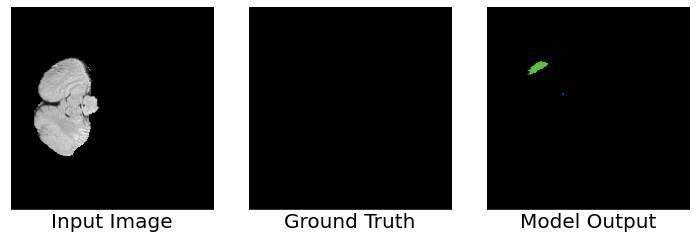

Steps: 65, L_xent:2.9065887928009033, L_dice: 1.0
Total Loss: 3.9065887928009033
Accurary: 0.9963750243186951
Seq: TC, ET, WT
Dice coefficient: [0.955, 0.93, 0.97]
Gradient min:-0.3367100656032562, max:0.1853817105293274



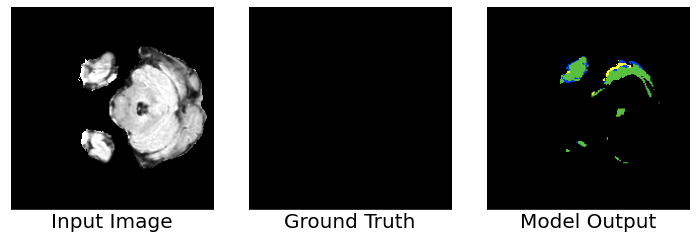

Steps: 66, L_xent:2.8747546672821045, L_dice: 1.0
Total Loss: 3.8747546672821045
Accurary: 0.9697250127792358
Seq: TC, ET, WT
Dice coefficient: [0.745, 0.665, 0.7916666666666666]
Gradient min:-0.3595009744167328, max:0.32713043689727783



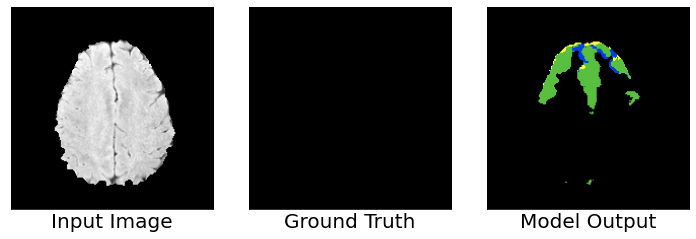

Steps: 67, L_xent:2.882633924484253, L_dice: 1.0
Total Loss: 3.882633924484253
Accurary: 0.9404249787330627
Seq: TC, ET, WT
Dice coefficient: [0.725, 0.635, 0.7683333333333333]
Gradient min:-0.16293591260910034, max:0.11440835893154144



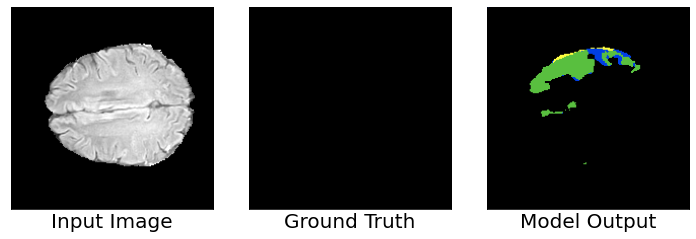

Steps: 68, L_xent:2.777606725692749, L_dice: 1.0
Total Loss: 3.777606725692749
Accurary: 0.9471499919891357
Seq: TC, ET, WT
Dice coefficient: [0.7825, 0.705, 0.8283333333333334]
Gradient min:-0.182481050491333, max:0.11242320388555527



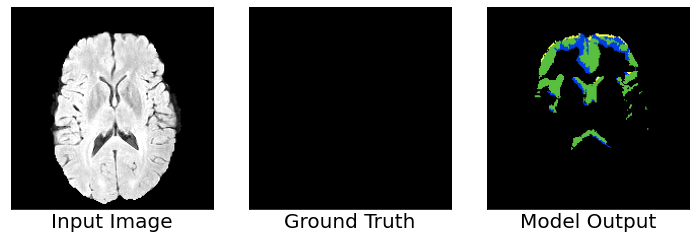

Steps: 69, L_xent:2.7252907752990723, L_dice: 1.0
Total Loss: 3.7252907752990723
Accurary: 0.925000011920929
Seq: TC, ET, WT
Dice coefficient: [0.535, 0.48, 0.6366666666666667]
Gradient min:-0.11680004000663757, max:0.11910427361726761



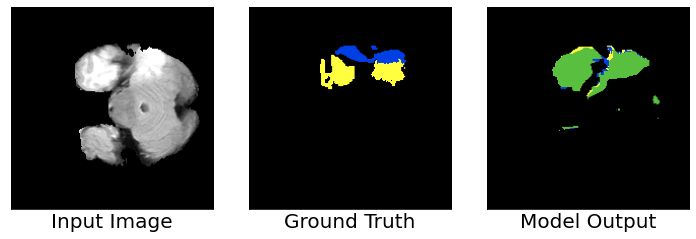

Steps: 70, L_xent:2.755998373031616, L_dice: 1.0
Total Loss: 3.755998373031616
Accurary: 0.9291250109672546
Seq: TC, ET, WT
Dice coefficient: [0.749136224091053, 0.68, 0.7494241493940353]
Gradient min:-0.1884402334690094, max:0.13566693663597107



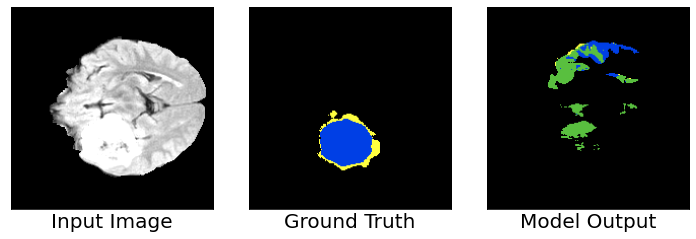

Steps: 71, L_xent:2.8915421962738037, L_dice: 1.0
Total Loss: 3.8915421962738037
Accurary: 0.8973249793052673
Seq: TC, ET, WT
Dice coefficient: [0.575, 0.57, 0.59]
Gradient min:-0.16318979859352112, max:0.17934846878051758



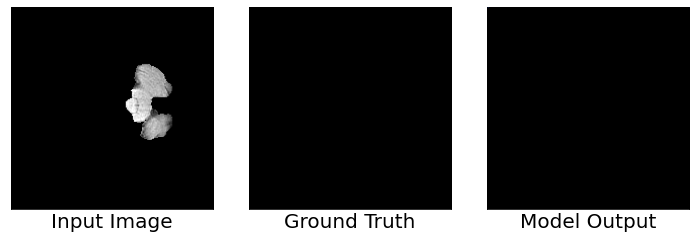

Steps: 72, L_xent:2.532811164855957, L_dice: 1.0
Total Loss: 3.532811164855957
Accurary: 0.999750018119812
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.1999458521604538, max:0.27460092306137085



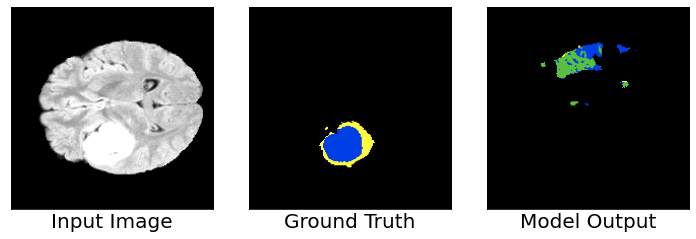

Steps: 73, L_xent:2.900514602661133, L_dice: 1.0
Total Loss: 3.900514602661133
Accurary: 0.9309499859809875
Seq: TC, ET, WT
Dice coefficient: [0.7075, 0.79, 0.7133333333333334]
Gradient min:-0.19178642332553864, max:0.15766054391860962



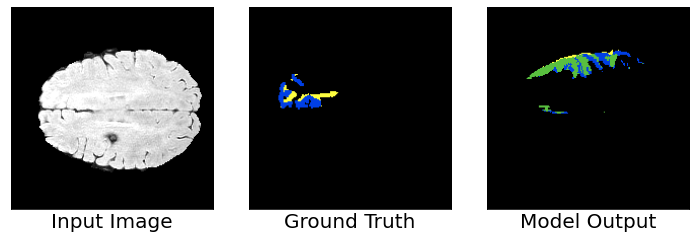

Steps: 74, L_xent:2.6013150215148926, L_dice: 1.0
Total Loss: 3.6013150215148926
Accurary: 0.9490500092506409
Seq: TC, ET, WT
Dice coefficient: [0.7575, 0.835, 0.7766666666666666]
Gradient min:-0.19178667664527893, max:0.12827688455581665



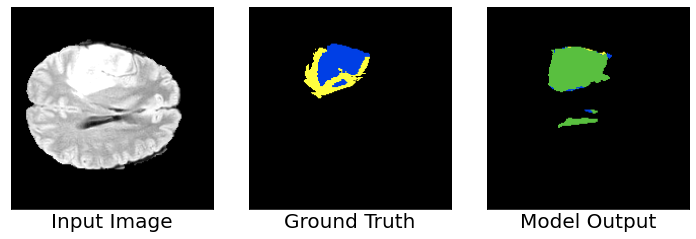

Steps: 75, L_xent:2.9715375900268555, L_dice: 1.0
Total Loss: 3.9715375900268555
Accurary: 0.933899998664856
Seq: TC, ET, WT
Dice coefficient: [0.7232289632223546, 0.705, 0.7304859754815698]
Gradient min:-0.20225714147090912, max:0.07855343073606491



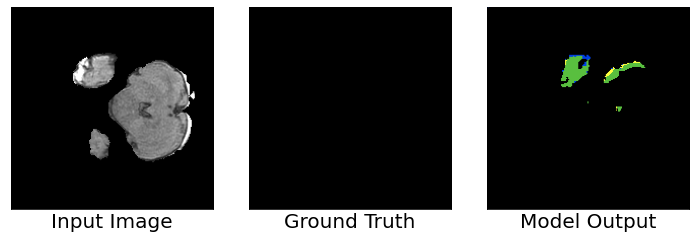

Steps: 76, L_xent:2.3933098316192627, L_dice: 1.0
Total Loss: 3.3933098316192627
Accurary: 0.9783750176429749
Seq: TC, ET, WT
Dice coefficient: [0.8625, 0.81, 0.8716666666666667]
Gradient min:-0.19766435027122498, max:0.11711790412664413



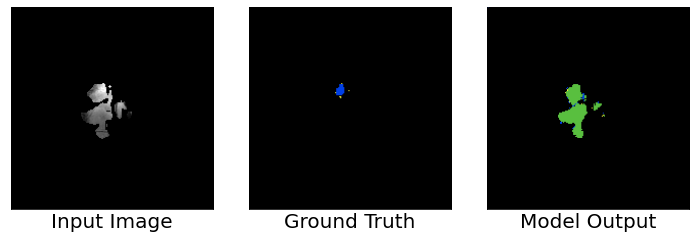

Steps: 77, L_xent:3.1162099838256836, L_dice: 0.9992750883102417
Total Loss: 4.115485191345215
Accurary: 0.978950023651123
Seq: TC, ET, WT
Dice coefficient: [0.7925, 0.735, 0.8433333333333334]
Gradient min:-2.881336212158203, max:1.7140189409255981



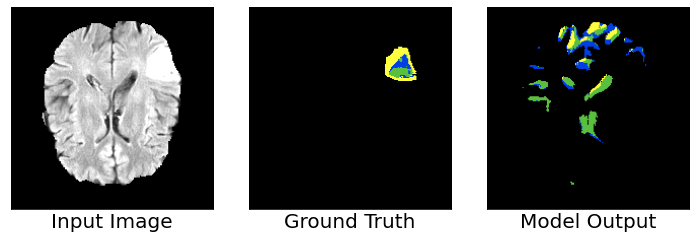

Steps: 78, L_xent:2.5524115562438965, L_dice: 0.9832292199134827
Total Loss: 3.5356407165527344
Accurary: 0.927174985408783
Seq: TC, ET, WT
Dice coefficient: [0.5149244506563991, 0.44, 0.5584913004375994]
Gradient min:-0.1695353239774704, max:0.10028436034917831



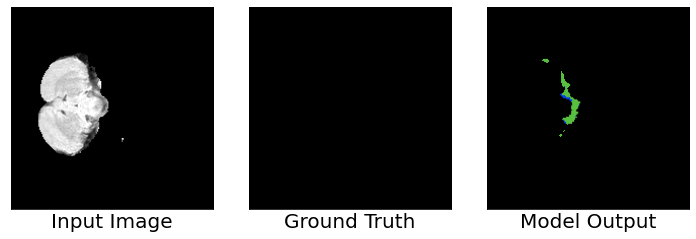

Steps: 79, L_xent:2.455462694168091, L_dice: 1.0
Total Loss: 3.455462694168091
Accurary: 0.9907749891281128
Seq: TC, ET, WT
Dice coefficient: [0.8025, 0.69, 0.8683333333333333]
Gradient min:-0.21589092910289764, max:0.1265752762556076



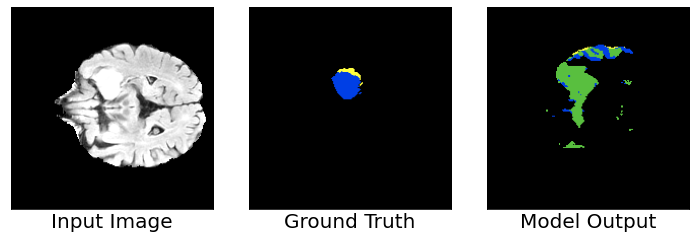

Steps: 80, L_xent:2.594120502471924, L_dice: 0.9980236291885376
Total Loss: 3.592144012451172
Accurary: 0.947700023651123
Seq: TC, ET, WT
Dice coefficient: [0.6392004675231874, 0.56, 0.7178003116821249]
Gradient min:-0.07066316157579422, max:0.10143718868494034



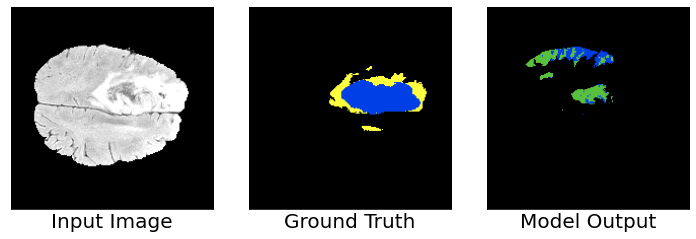

Steps: 81, L_xent:3.0631115436553955, L_dice: 1.0
Total Loss: 4.063111305236816
Accurary: 0.9045500159263611
Seq: TC, ET, WT
Dice coefficient: [0.7391098265442997, 0.76, 0.7410732176961998]
Gradient min:-0.20387659966945648, max:0.22639872133731842



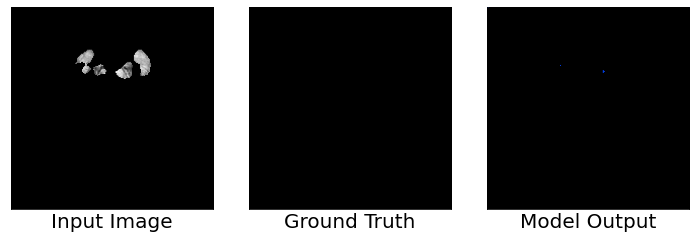

Steps: 82, L_xent:2.345407247543335, L_dice: 1.0
Total Loss: 3.345407247543335
Accurary: 0.9996500015258789
Seq: TC, ET, WT
Dice coefficient: [0.985, 1.0, 0.99]
Gradient min:-0.13312320411205292, max:0.2151937633752823



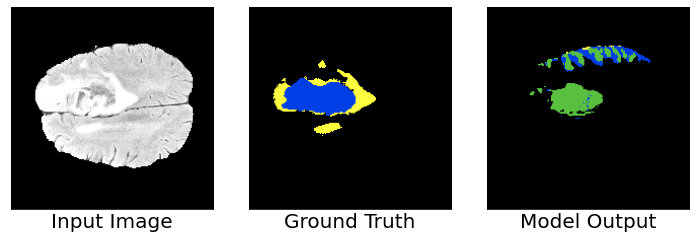

Steps: 83, L_xent:2.6680502891540527, L_dice: 1.0
Total Loss: 3.6680502891540527
Accurary: 0.892549991607666
Seq: TC, ET, WT
Dice coefficient: [0.693942310330458, 0.72, 0.6742948735536387]
Gradient min:-0.13527554273605347, max:0.07555914670228958



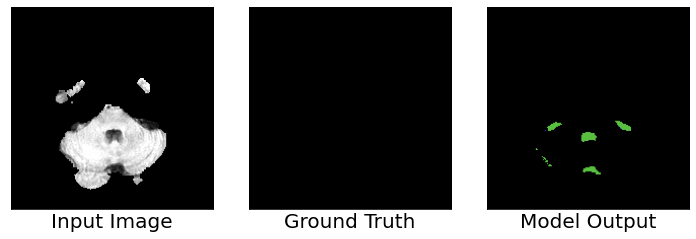

Steps: 84, L_xent:2.26543927192688, L_dice: 1.0
Total Loss: 3.26543927192688
Accurary: 0.9908499717712402
Seq: TC, ET, WT
Dice coefficient: [0.89, 0.805, 0.9266666666666666]
Gradient min:-0.07735666632652283, max:0.1414688229560852



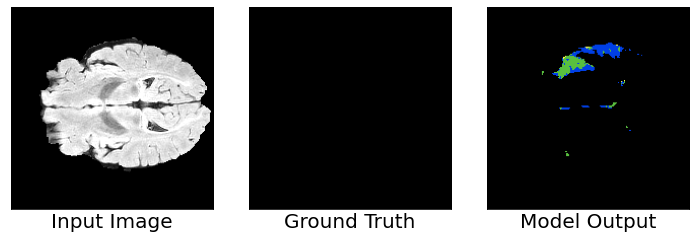

Steps: 85, L_xent:2.4112021923065186, L_dice: 1.0
Total Loss: 3.4112021923065186
Accurary: 0.9721249938011169
Seq: TC, ET, WT
Dice coefficient: [0.765, 0.76, 0.8283333333333334]
Gradient min:-0.15802186727523804, max:0.13903144001960754



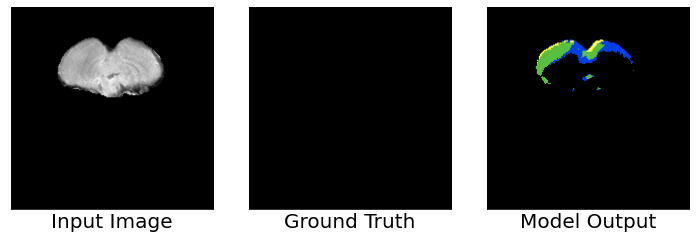

Steps: 86, L_xent:2.450956106185913, L_dice: 1.0
Total Loss: 3.450956106185913
Accurary: 0.9659749865531921
Seq: TC, ET, WT
Dice coefficient: [0.795, 0.775, 0.8283333333333334]
Gradient min:-0.5984185338020325, max:0.3204838037490845



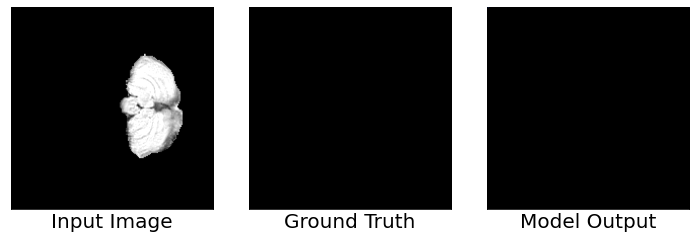

Steps: 87, L_xent:2.23020076751709, L_dice: 1.0
Total Loss: 3.23020076751709
Accurary: 0.9997749924659729
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.080244280397892, max:0.23816512525081635



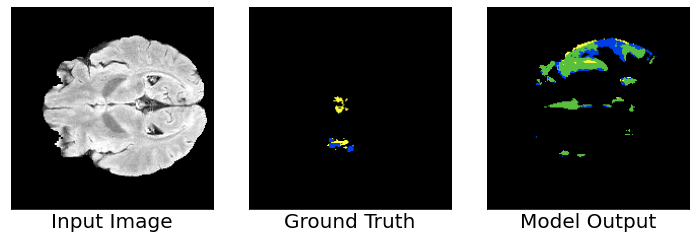

Steps: 88, L_xent:2.3464527130126953, L_dice: 1.0
Total Loss: 3.3464527130126953
Accurary: 0.9379749894142151
Seq: TC, ET, WT
Dice coefficient: [0.655, 0.66, 0.68]
Gradient min:-0.09539029002189636, max:0.10855752229690552



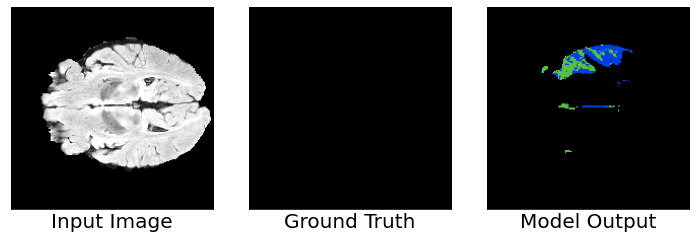

Steps: 89, L_xent:2.324758529663086, L_dice: 1.0
Total Loss: 3.324758529663086
Accurary: 0.9637500047683716
Seq: TC, ET, WT
Dice coefficient: [0.78, 0.785, 0.8416666666666667]
Gradient min:-0.3400660455226898, max:0.4137697219848633



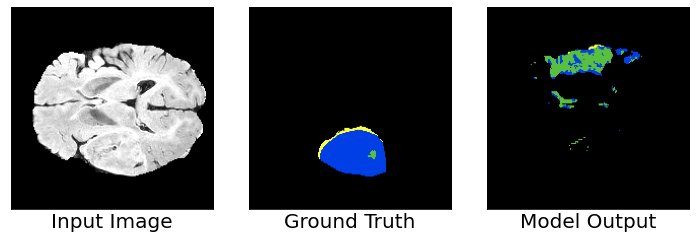

Steps: 90, L_xent:2.5498790740966797, L_dice: 0.9976410269737244
Total Loss: 3.547520160675049
Accurary: 0.8945000171661377
Seq: TC, ET, WT
Dice coefficient: [0.565, 0.635, 0.6433333333333333]
Gradient min:-0.11357470601797104, max:0.17244592308998108



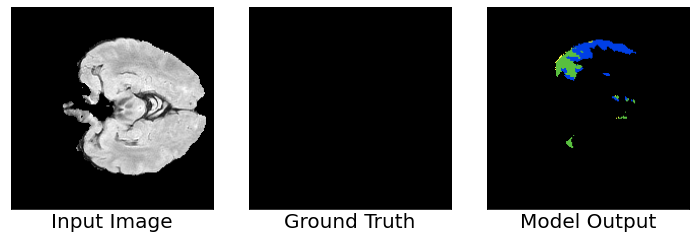

Steps: 91, L_xent:2.220031976699829, L_dice: 1.0
Total Loss: 3.220031976699829
Accurary: 0.9705250263214111
Seq: TC, ET, WT
Dice coefficient: [0.75, 0.72, 0.8033333333333333]
Gradient min:-0.12647756934165955, max:0.17621572315692902



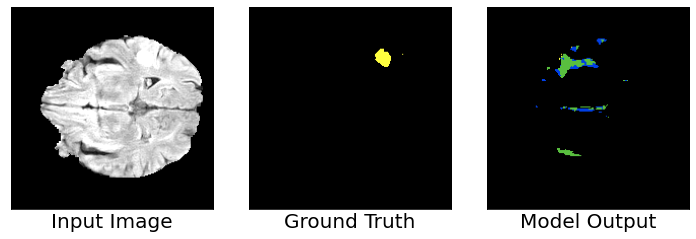

Steps: 92, L_xent:2.55653715133667, L_dice: 1.0
Total Loss: 3.55653715133667
Accurary: 0.9769750237464905
Seq: TC, ET, WT
Dice coefficient: [0.7775, 0.76, 0.82]
Gradient min:-0.1193404421210289, max:0.1140594631433487



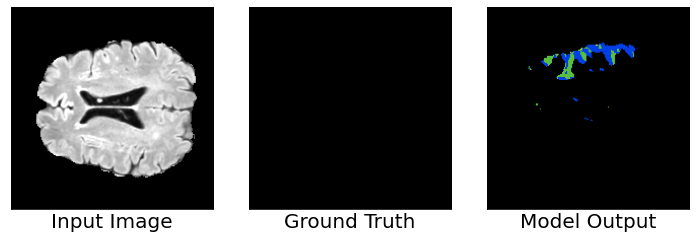

Steps: 93, L_xent:2.492393970489502, L_dice: 0.9985867142677307
Total Loss: 3.490980625152588
Accurary: 0.9729250073432922
Seq: TC, ET, WT
Dice coefficient: [0.7975, 0.81, 0.8566666666666667]
Gradient min:-0.17514264583587646, max:0.18398898839950562



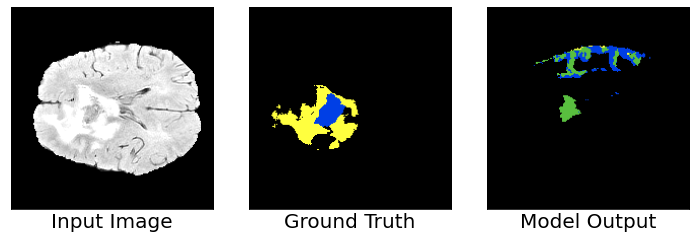

Steps: 94, L_xent:2.5470762252807617, L_dice: 1.0
Total Loss: 3.5470762252807617
Accurary: 0.90829998254776
Seq: TC, ET, WT
Dice coefficient: [0.6876999999955297, 0.72, 0.6734666666636865]
Gradient min:-0.2937884032726288, max:0.1451980322599411



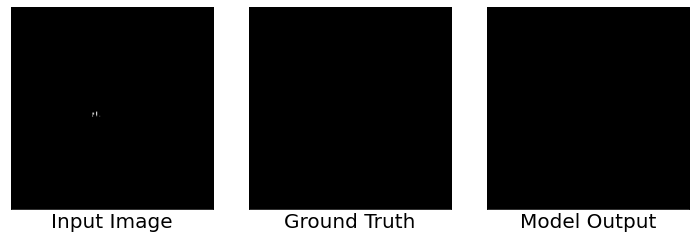

Steps: 95, L_xent:2.4237046241760254, L_dice: 0.9997916221618652
Total Loss: 3.4234962463378906
Accurary: 0.9998499751091003
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.3094640374183655, max:0.2522321939468384



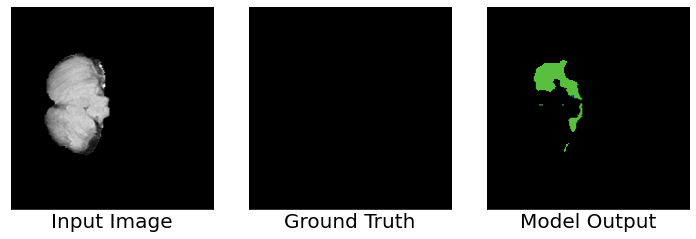

Steps: 96, L_xent:2.201228618621826, L_dice: 0.9945194125175476
Total Loss: 3.1957480907440186
Accurary: 0.9729750156402588
Seq: TC, ET, WT
Dice coefficient: [0.7975, 0.615, 0.865]
Gradient min:-0.17007000744342804, max:0.09820438921451569



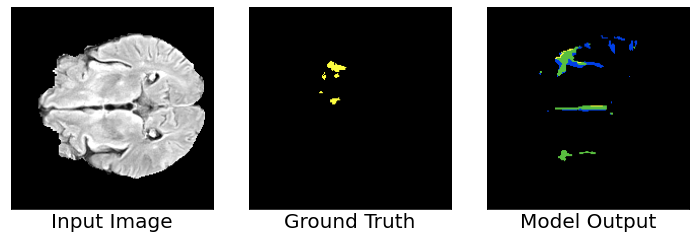

Steps: 97, L_xent:2.0563278198242188, L_dice: 1.0
Total Loss: 3.0563278198242188
Accurary: 0.9731000065803528
Seq: TC, ET, WT
Dice coefficient: [0.7675, 0.76, 0.78]
Gradient min:-0.0737575963139534, max:0.15145592391490936



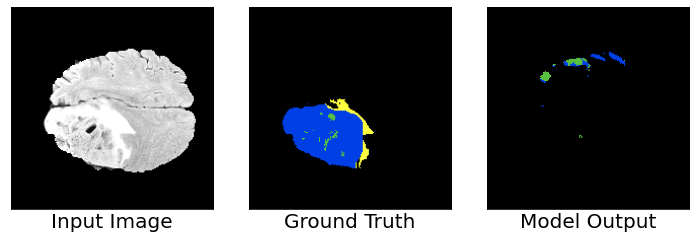

Steps: 98, L_xent:3.2627182006835938, L_dice: 0.990551233291626
Total Loss: 4.253269195556641
Accurary: 0.8900250196456909
Seq: TC, ET, WT
Dice coefficient: [0.6375, 0.72, 0.6516666666666666]
Gradient min:-0.5840320587158203, max:0.5929371118545532



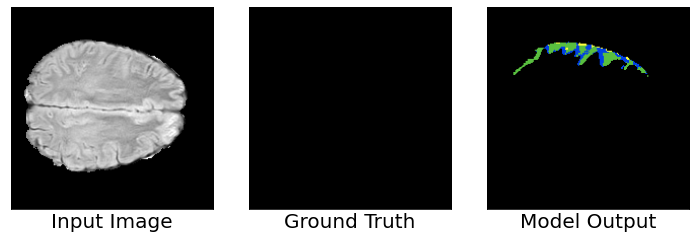

Steps: 99, L_xent:2.0017027854919434, L_dice: 1.0
Total Loss: 3.0017027854919434
Accurary: 0.9721249938011169
Seq: TC, ET, WT
Dice coefficient: [0.8375, 0.83, 0.8683333333333333]
Gradient min:-0.1404176950454712, max:0.12539458274841309



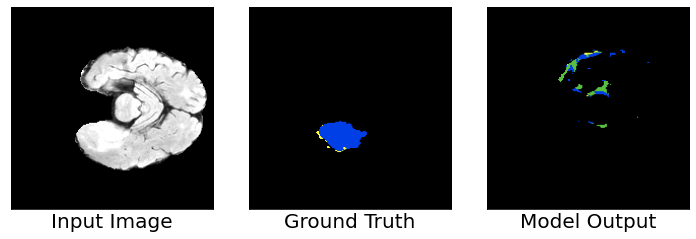

Steps: 100, L_xent:2.0929038524627686, L_dice: 1.0
Total Loss: 3.0929038524627686
Accurary: 0.963949978351593
Seq: TC, ET, WT
Dice coefficient: [0.71625, 0.76, 0.7708333333333334]
Gradient min:-0.14704851806163788, max:0.3313918113708496



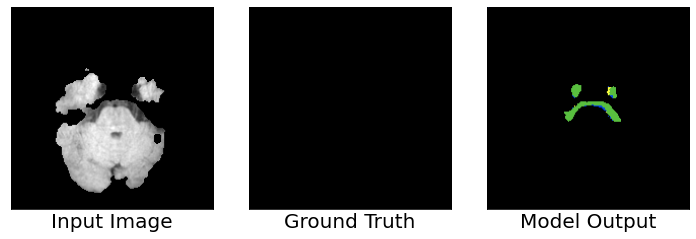

Steps: 101, L_xent:1.907218098640442, L_dice: 1.0
Total Loss: 2.9072179794311523
Accurary: 0.9852499961853027
Seq: TC, ET, WT
Dice coefficient: [0.8725, 0.83, 0.8983333333333333]
Gradient min:-0.07242612540721893, max:0.19585037231445312



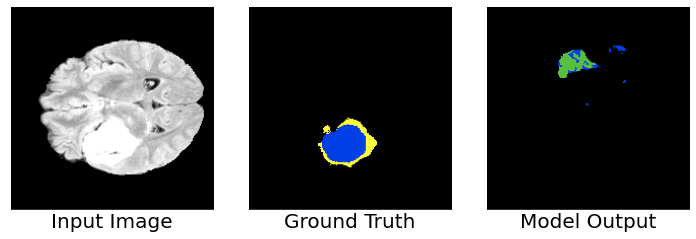

Steps: 102, L_xent:2.18034029006958, L_dice: 1.0
Total Loss: 3.18034029006958
Accurary: 0.9373499751091003
Seq: TC, ET, WT
Dice coefficient: [0.7475, 0.86, 0.745]
Gradient min:-0.13347309827804565, max:0.19214816391468048



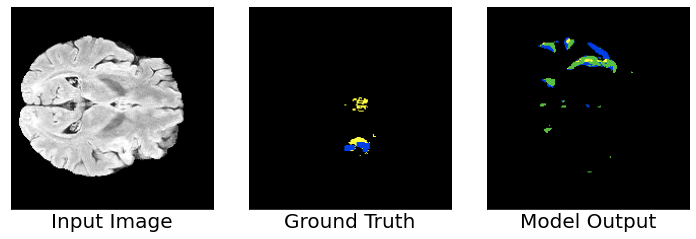

Steps: 103, L_xent:2.0291988849639893, L_dice: 1.0
Total Loss: 3.0291988849639893
Accurary: 0.9697999954223633
Seq: TC, ET, WT
Dice coefficient: [0.7225, 0.735, 0.745]
Gradient min:-0.15642622113227844, max:0.09472192078828812



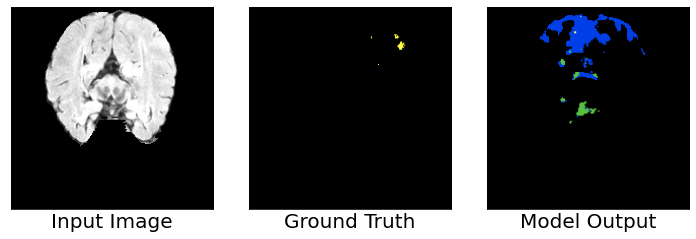

Steps: 104, L_xent:2.0896525382995605, L_dice: 0.998196542263031
Total Loss: 3.0878491401672363
Accurary: 0.954675018787384
Seq: TC, ET, WT
Dice coefficient: [0.73, 0.805, 0.7933333333333333]
Gradient min:-0.1327667534351349, max:0.2269517481327057



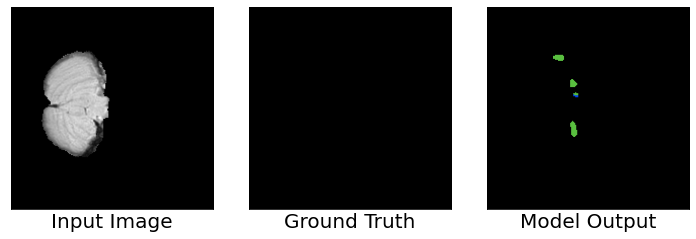

Steps: 105, L_xent:1.8921018838882446, L_dice: 1.0
Total Loss: 2.892101764678955
Accurary: 0.9950000047683716
Seq: TC, ET, WT
Dice coefficient: [0.905, 0.835, 0.935]
Gradient min:-0.2021762579679489, max:0.20182141661643982



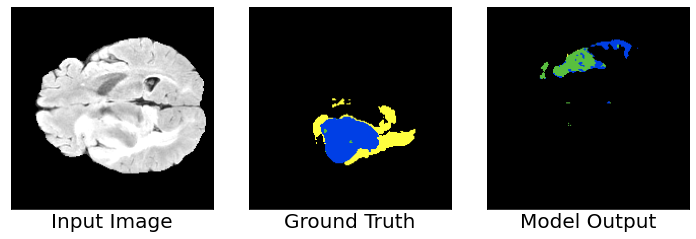

Steps: 106, L_xent:2.560683012008667, L_dice: 0.9949347972869873
Total Loss: 3.5556178092956543
Accurary: 0.8929250240325928
Seq: TC, ET, WT
Dice coefficient: [0.66, 0.765, 0.6566666666666666]
Gradient min:-0.14056068658828735, max:0.21091626584529877



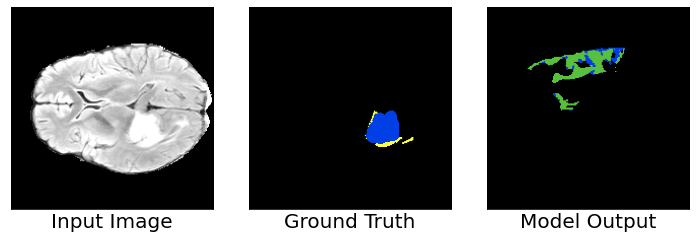

Steps: 107, L_xent:2.3471930027008057, L_dice: 0.9987444877624512
Total Loss: 3.345937490463257
Accurary: 0.9400249719619751
Seq: TC, ET, WT
Dice coefficient: [0.6925, 0.745, 0.75]
Gradient min:-0.1569339632987976, max:0.19251668453216553



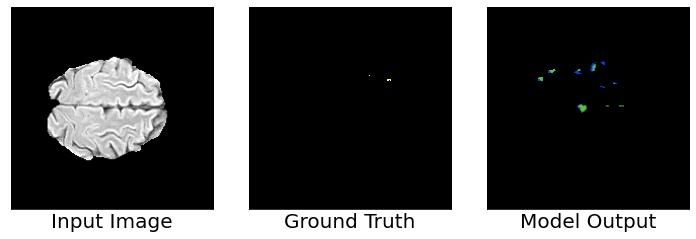

Steps: 108, L_xent:2.1230900287628174, L_dice: 0.9988357424736023
Total Loss: 3.1219258308410645
Accurary: 0.9955999851226807
Seq: TC, ET, WT
Dice coefficient: [0.8825, 0.89, 0.9166666666666666]
Gradient min:-0.15167613327503204, max:0.1596081405878067



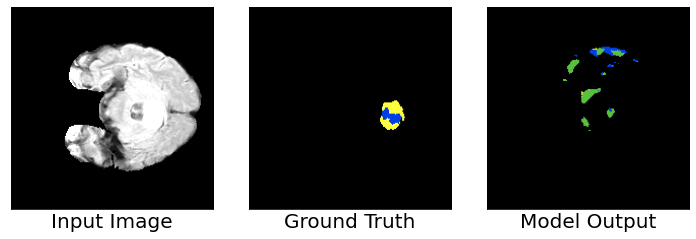

Steps: 109, L_xent:1.9971628189086914, L_dice: 1.0
Total Loss: 2.9971628189086914
Accurary: 0.9717249870300293
Seq: TC, ET, WT
Dice coefficient: [0.74, 0.695, 0.765]
Gradient min:-0.09572058171033859, max:0.14290614426136017



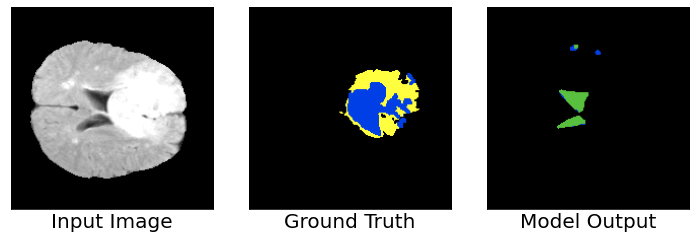

Steps: 110, L_xent:2.146641969680786, L_dice: 1.0
Total Loss: 3.146641969680786
Accurary: 0.895799994468689
Seq: TC, ET, WT
Dice coefficient: [0.715, 0.8, 0.6966666666666667]
Gradient min:-0.1745488941669464, max:0.1448587328195572



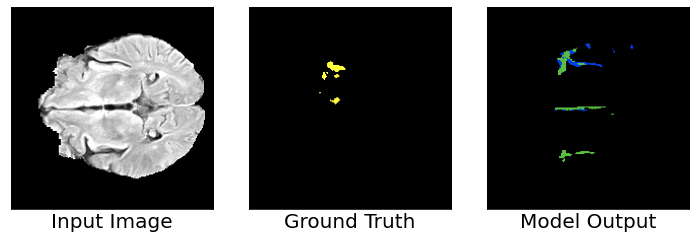

Steps: 111, L_xent:2.009718179702759, L_dice: 1.0
Total Loss: 3.009718179702759
Accurary: 0.9818750023841858
Seq: TC, ET, WT
Dice coefficient: [0.8125, 0.775, 0.83]
Gradient min:-0.08260141313076019, max:0.07071495801210403



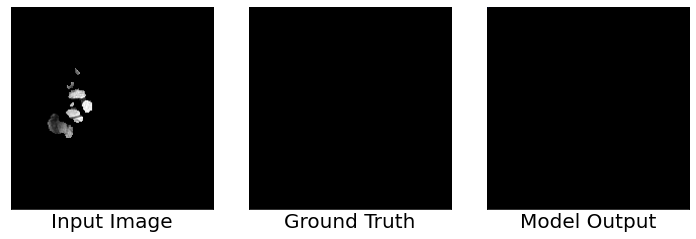

Steps: 112, L_xent:1.7459232807159424, L_dice: 1.0
Total Loss: 2.7459232807159424
Accurary: 0.9998000264167786
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.995]
Gradient min:-0.11346805095672607, max:0.2381044626235962



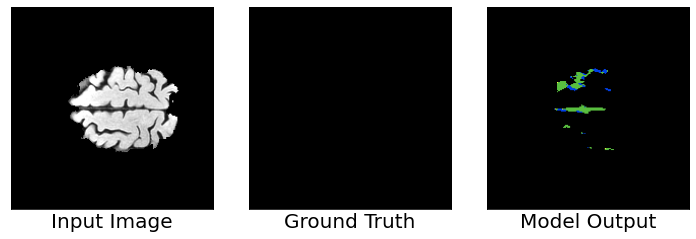

Steps: 113, L_xent:1.8204035758972168, L_dice: 1.0
Total Loss: 2.820403575897217
Accurary: 0.9858499765396118
Seq: TC, ET, WT
Dice coefficient: [0.8275, 0.8, 0.88]
Gradient min:-0.10292065888643265, max:0.12341495603322983



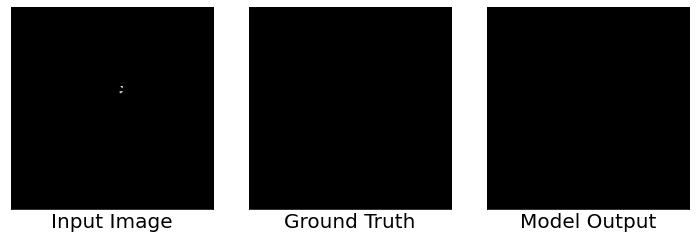

Steps: 114, L_xent:1.6964435577392578, L_dice: 1.0
Total Loss: 2.696443557739258
Accurary: 0.9998999834060669
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.20902563631534576, max:0.2558439075946808



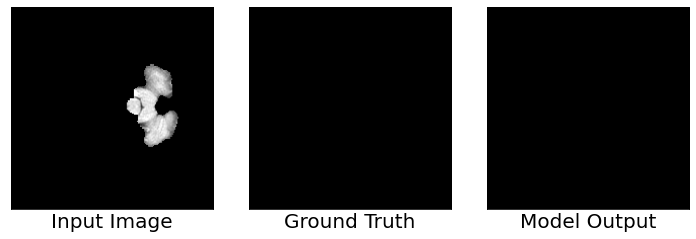

Steps: 115, L_xent:1.7267171144485474, L_dice: 1.0
Total Loss: 2.726716995239258
Accurary: 0.999875009059906
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.09715945273637772, max:0.20179563760757446



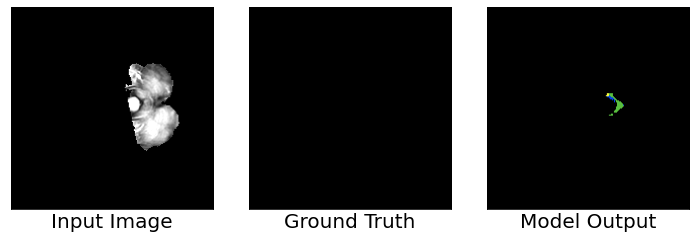

Steps: 116, L_xent:1.81529700756073, L_dice: 1.0
Total Loss: 2.8152971267700195
Accurary: 0.9971250295639038
Seq: TC, ET, WT
Dice coefficient: [0.9225, 0.895, 0.9433333333333334]
Gradient min:-0.10524164140224457, max:0.11142735183238983



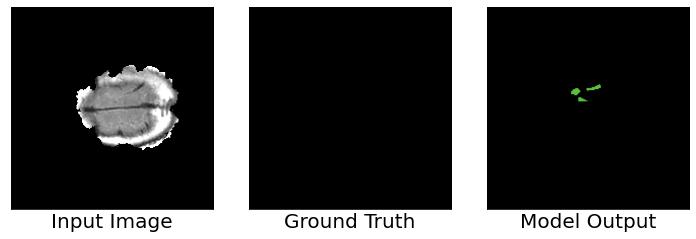

Steps: 117, L_xent:1.7030425071716309, L_dice: 1.0
Total Loss: 2.703042507171631
Accurary: 0.9971500039100647
Seq: TC, ET, WT
Dice coefficient: [0.9575, 0.925, 0.9716666666666667]
Gradient min:-0.11516834795475006, max:0.13653059303760529



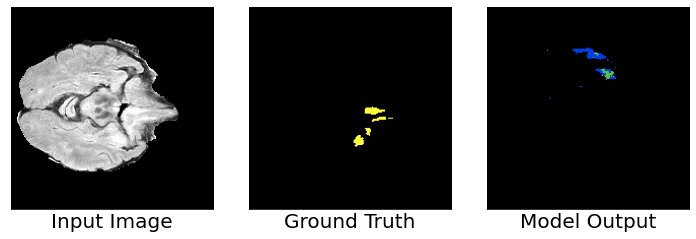

Steps: 118, L_xent:2.2539968490600586, L_dice: 0.9923217296600342
Total Loss: 3.2463185787200928
Accurary: 0.9858499765396118
Seq: TC, ET, WT
Dice coefficient: [0.8825, 0.92, 0.865]
Gradient min:-0.1942155510187149, max:0.19666045904159546



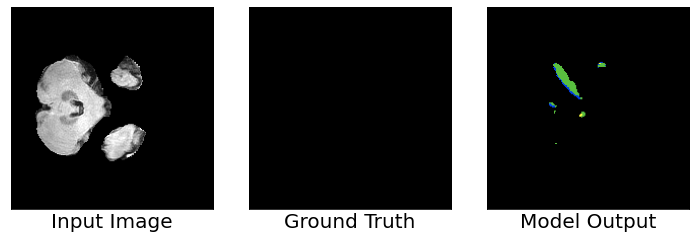

Steps: 119, L_xent:1.6457746028900146, L_dice: 1.0
Total Loss: 2.6457746028900146
Accurary: 0.9896249771118164
Seq: TC, ET, WT
Dice coefficient: [0.785, 0.76, 0.8483333333333334]
Gradient min:-0.15783360600471497, max:0.18859490752220154



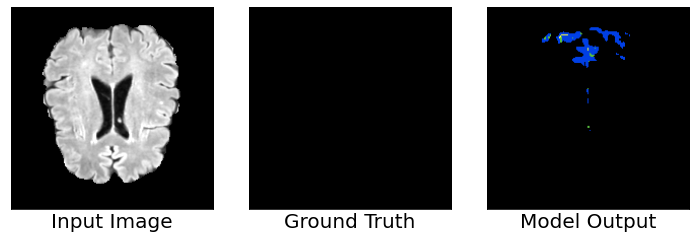

Steps: 120, L_xent:1.7066612243652344, L_dice: 1.0
Total Loss: 2.7066612243652344
Accurary: 0.9791250228881836
Seq: TC, ET, WT
Dice coefficient: [0.82, 0.905, 0.8683333333333333]
Gradient min:-0.1083947941660881, max:0.16752828657627106



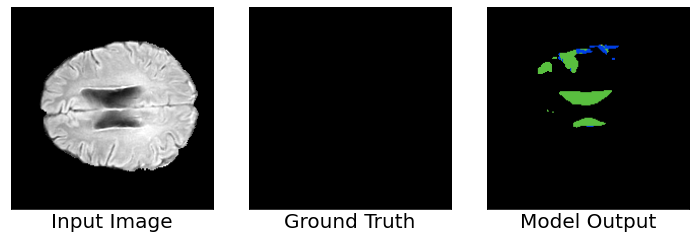

Steps: 121, L_xent:2.3869659900665283, L_dice: 1.0
Total Loss: 3.3869659900665283
Accurary: 0.9671499729156494
Seq: TC, ET, WT
Dice coefficient: [0.805, 0.72, 0.8683333333333333]
Gradient min:-0.3480757474899292, max:0.1629767119884491



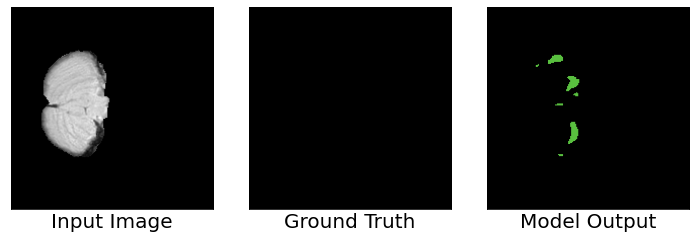

Steps: 122, L_xent:1.6236698627471924, L_dice: 1.0
Total Loss: 2.6236698627471924
Accurary: 0.9904000163078308
Seq: TC, ET, WT
Dice coefficient: [0.8525, 0.715, 0.9016666666666666]
Gradient min:-0.1519521325826645, max:0.14207664132118225



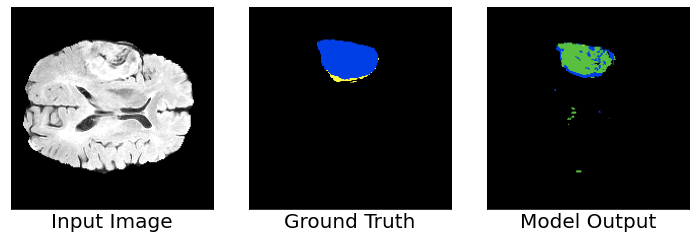

Steps: 123, L_xent:2.030132293701172, L_dice: 1.0
Total Loss: 3.030132293701172
Accurary: 0.9600750207901001
Seq: TC, ET, WT
Dice coefficient: [0.8016045349743217, 0.78, 0.8394030233162145]
Gradient min:-0.11830061674118042, max:0.0971297025680542



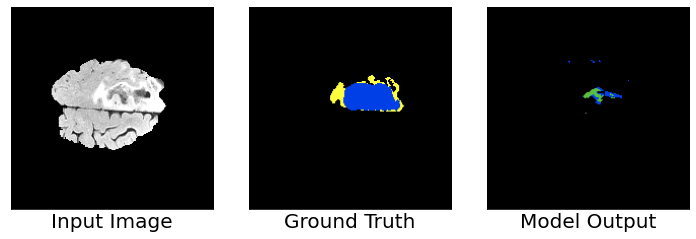

Steps: 124, L_xent:1.7402974367141724, L_dice: 1.0
Total Loss: 2.740297317504883
Accurary: 0.9595249891281128
Seq: TC, ET, WT
Dice coefficient: [0.8874043769109994, 0.925, 0.8632695846073329]
Gradient min:-0.24657411873340607, max:0.1270466148853302



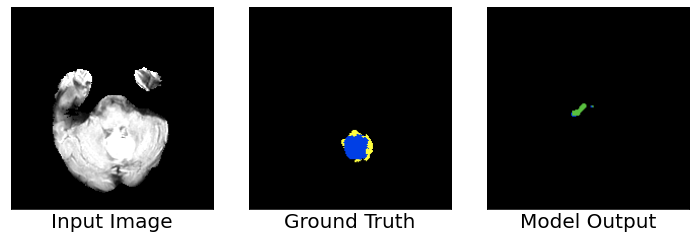

Steps: 125, L_xent:1.6498000621795654, L_dice: 1.0
Total Loss: 2.6498000621795654
Accurary: 0.9804999828338623
Seq: TC, ET, WT
Dice coefficient: [0.885, 0.94, 0.8683333333333333]
Gradient min:-0.14556773006916046, max:0.11753631383180618



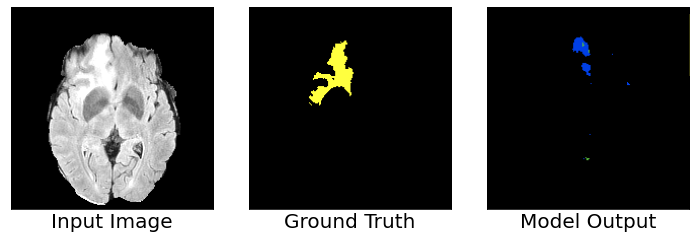

Steps: 126, L_xent:2.085695266723633, L_dice: 0.9998764395713806
Total Loss: 3.085571765899658
Accurary: 0.9680250287055969
Seq: TC, ET, WT
Dice coefficient: [0.875, 0.95, 0.7666666666666667]
Gradient min:-0.12156232446432114, max:0.09319542348384857



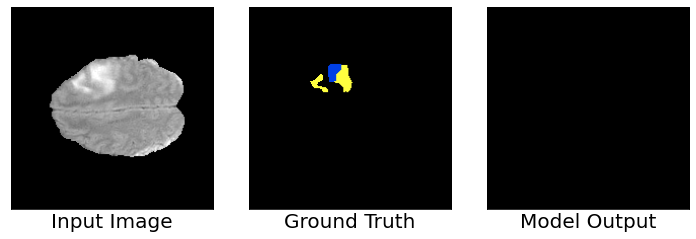

Steps: 127, L_xent:1.5730105638504028, L_dice: 1.0
Total Loss: 2.5730104446411133
Accurary: 0.9857500195503235
Seq: TC, ET, WT
Dice coefficient: [0.95, 1.0, 0.92]
Gradient min:-0.07268399000167847, max:0.15728306770324707



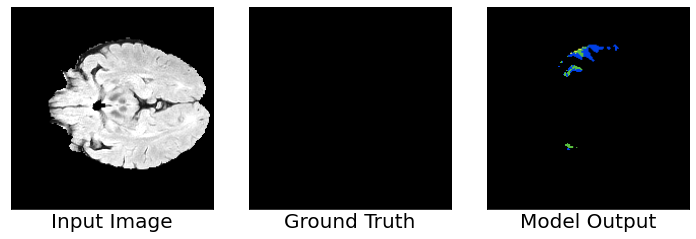

Steps: 128, L_xent:1.619667649269104, L_dice: 0.9983790516853333
Total Loss: 2.618046760559082
Accurary: 0.9896249771118164
Seq: TC, ET, WT
Dice coefficient: [0.84, 0.85, 0.8866666666666667]
Gradient min:-0.09444127231836319, max:0.14113706350326538



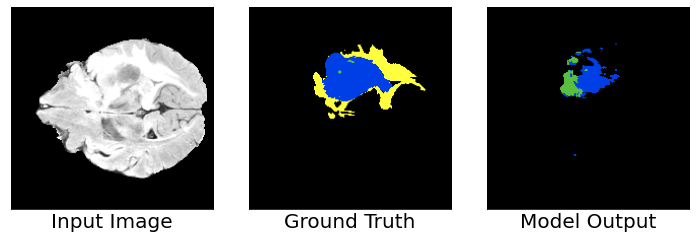

Steps: 129, L_xent:1.76036536693573, L_dice: 0.9953485727310181
Total Loss: 2.755713939666748
Accurary: 0.9228000044822693
Seq: TC, ET, WT
Dice coefficient: [0.8156817974708974, 0.81, 0.755454531647265]
Gradient min:-0.05818357318639755, max:0.0420481339097023



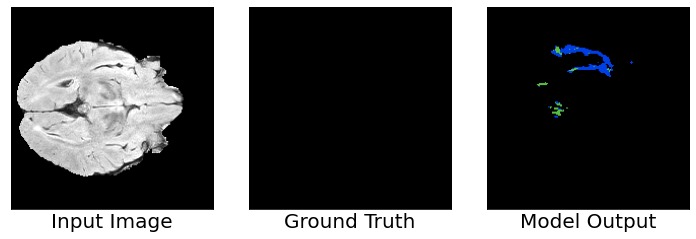

Steps: 130, L_xent:1.5310773849487305, L_dice: 1.0
Total Loss: 2.5310773849487305
Accurary: 0.9827749729156494
Seq: TC, ET, WT
Dice coefficient: [0.815, 0.85, 0.8766666666666667]
Gradient min:-0.09035947918891907, max:0.09660317748785019



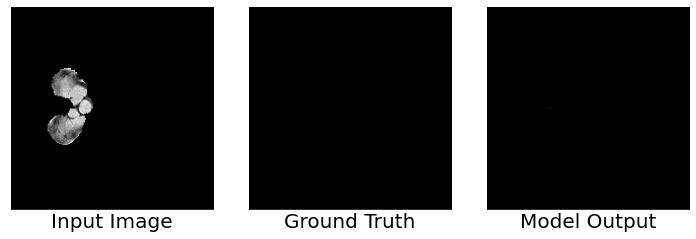

Steps: 131, L_xent:1.4997389316558838, L_dice: 1.0
Total Loss: 2.499738931655884
Accurary: 0.9999499917030334
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.08577138185501099, max:0.11851594597101212



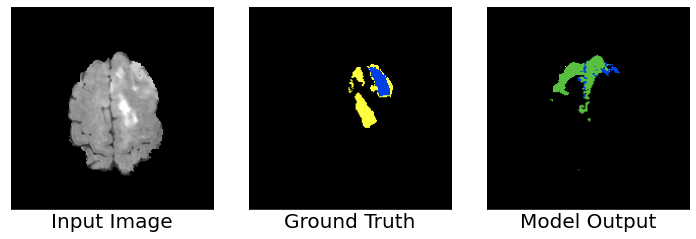

Steps: 132, L_xent:1.8148494958877563, L_dice: 1.0
Total Loss: 2.814849376678467
Accurary: 0.9502999782562256
Seq: TC, ET, WT
Dice coefficient: [0.7518323259800672, 0.69, 0.7278882173200448]
Gradient min:-0.08493661880493164, max:0.06084832921624184



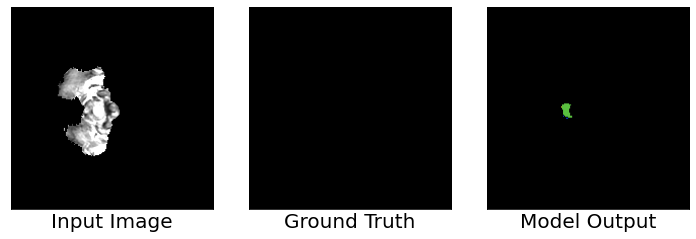

Steps: 133, L_xent:1.496363639831543, L_dice: 1.0
Total Loss: 2.496363639831543
Accurary: 0.9975249767303467
Seq: TC, ET, WT
Dice coefficient: [0.9575, 0.93, 0.97]
Gradient min:-0.09823057055473328, max:0.09753846377134323



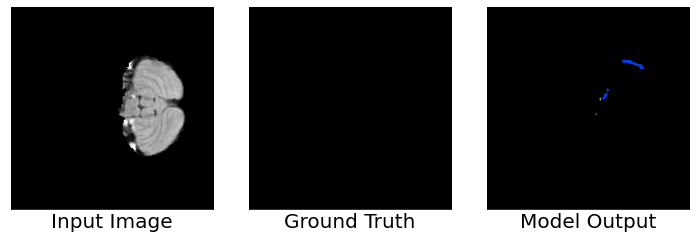

Steps: 134, L_xent:1.4641941785812378, L_dice: 1.0
Total Loss: 2.4641942977905273
Accurary: 0.9975500106811523
Seq: TC, ET, WT
Dice coefficient: [0.95, 1.0, 0.9616666666666667]
Gradient min:-0.08640087395906448, max:0.18647225201129913



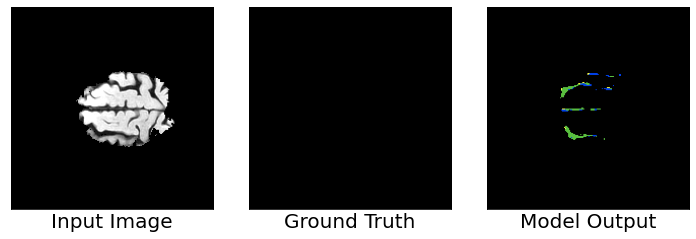

Steps: 135, L_xent:1.4750652313232422, L_dice: 1.0
Total Loss: 2.475065231323242
Accurary: 0.9913250207901001
Seq: TC, ET, WT
Dice coefficient: [0.8725, 0.83, 0.8966666666666666]
Gradient min:-0.09816448390483856, max:0.15691104531288147



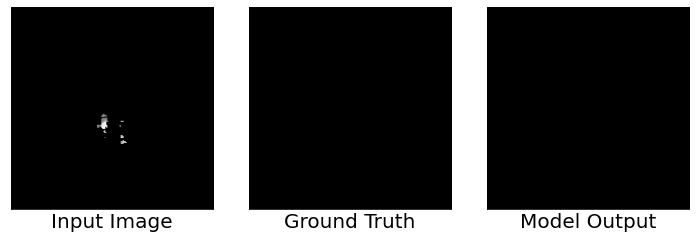

Steps: 136, L_xent:1.4662680625915527, L_dice: 1.0
Total Loss: 2.4662680625915527
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.05670781061053276, max:0.10004159808158875



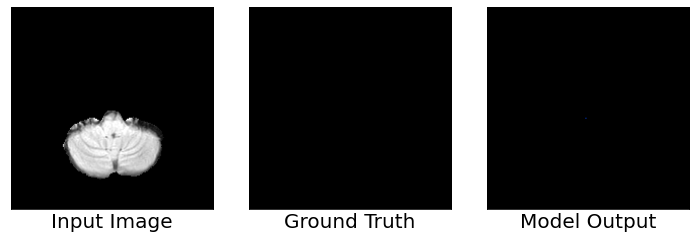

Steps: 137, L_xent:1.4209989309310913, L_dice: 1.0
Total Loss: 2.420999050140381
Accurary: 0.9998499751091003
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.995]
Gradient min:-0.42343875765800476, max:0.3953019380569458



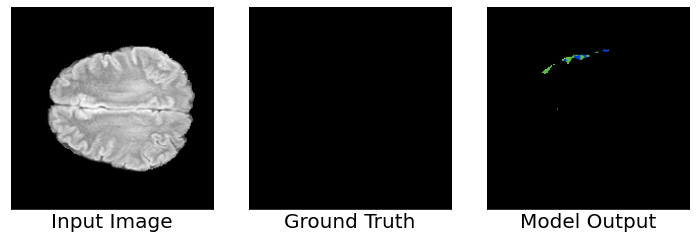

Steps: 138, L_xent:1.52888023853302, L_dice: 1.0
Total Loss: 2.5288801193237305
Accurary: 0.9961749911308289
Seq: TC, ET, WT
Dice coefficient: [0.9125, 0.89, 0.94]
Gradient min:-0.12169741839170456, max:0.15057861804962158



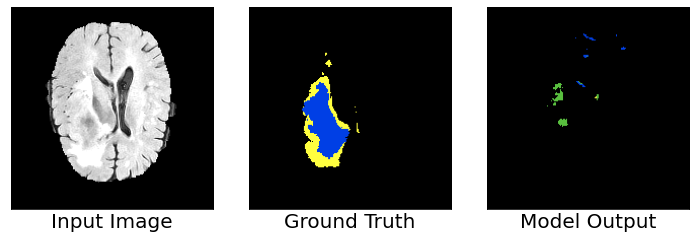

Steps: 139, L_xent:2.2185158729553223, L_dice: 1.0
Total Loss: 3.2185158729553223
Accurary: 0.9294000267982483
Seq: TC, ET, WT
Dice coefficient: [0.6875, 0.835, 0.62]
Gradient min:-0.27339649200439453, max:0.26916781067848206



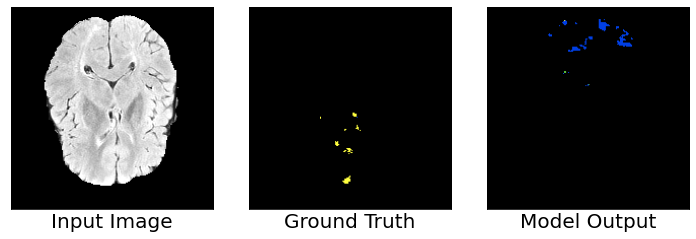

Steps: 140, L_xent:1.8405084609985352, L_dice: 0.9990890026092529
Total Loss: 2.839597463607788
Accurary: 0.9904249906539917
Seq: TC, ET, WT
Dice coefficient: [0.895, 0.985, 0.8766666666666667]
Gradient min:-0.189244344830513, max:0.24928121268749237



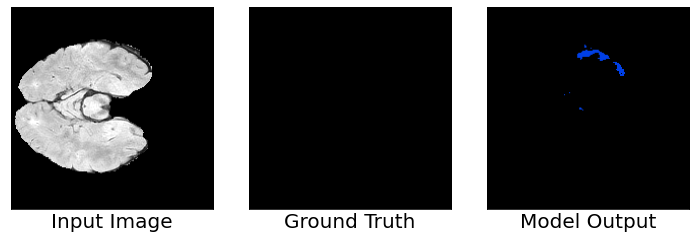

Steps: 141, L_xent:1.3889800310134888, L_dice: 1.0
Total Loss: 2.388979911804199
Accurary: 0.9937000274658203
Seq: TC, ET, WT
Dice coefficient: [0.9125, 1.0, 0.9416666666666667]
Gradient min:-0.06506410986185074, max:0.07881341874599457



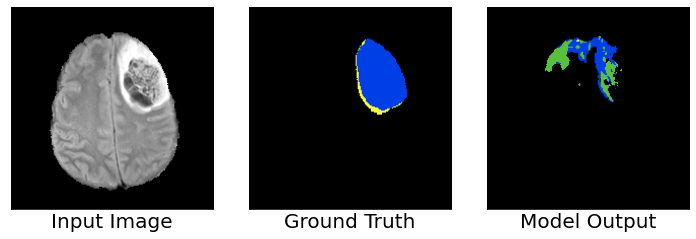

Steps: 142, L_xent:1.929567575454712, L_dice: 0.9996756911277771
Total Loss: 2.929243326187134
Accurary: 0.9236000180244446
Seq: TC, ET, WT
Dice coefficient: [0.7015978551656008, 0.69, 0.6827319034437338]
Gradient min:-0.14400245249271393, max:0.0735592469573021



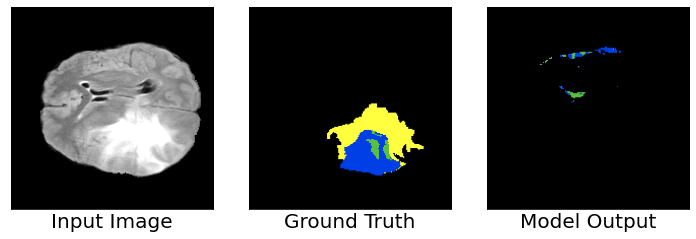

Steps: 143, L_xent:2.9214894771575928, L_dice: 0.9924588203430176
Total Loss: 3.9139482975006104
Accurary: 0.8964499831199646
Seq: TC, ET, WT
Dice coefficient: [0.7025, 0.75, 0.6883333333333334]
Gradient min:-0.5534189939498901, max:0.43928757309913635



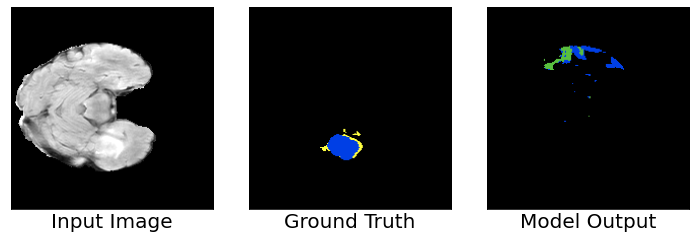

Steps: 144, L_xent:1.5902760028839111, L_dice: 0.9935706853866577
Total Loss: 2.5838465690612793
Accurary: 0.9680250287055969
Seq: TC, ET, WT
Dice coefficient: [0.78, 0.865, 0.805]
Gradient min:-0.21842169761657715, max:0.7106807827949524



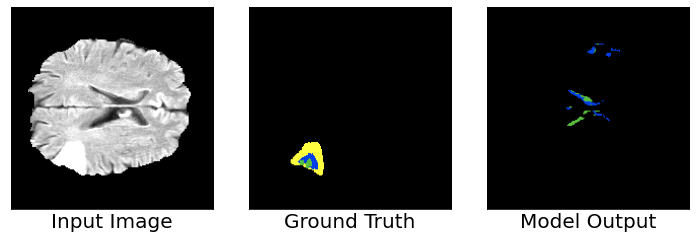

Steps: 145, L_xent:1.7023658752441406, L_dice: 0.9989845752716064
Total Loss: 2.701350450515747
Accurary: 0.9750999808311462
Seq: TC, ET, WT
Dice coefficient: [0.7575, 0.795, 0.7833333333333333]
Gradient min:-0.10739355534315109, max:0.12627188861370087



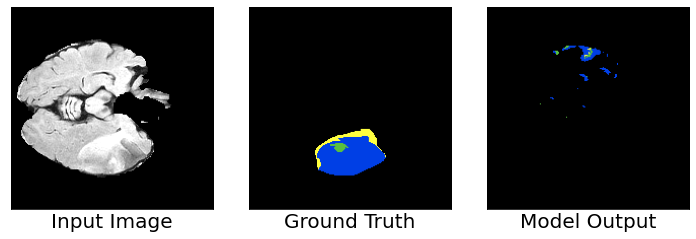

Steps: 146, L_xent:1.8630248308181763, L_dice: 0.9985902309417725
Total Loss: 2.8616151809692383
Accurary: 0.93402498960495
Seq: TC, ET, WT
Dice coefficient: [0.7425, 0.875, 0.7516666666666667]
Gradient min:-0.18647965788841248, max:0.1952294260263443



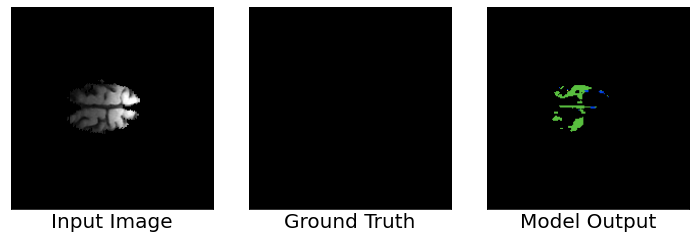

Steps: 147, L_xent:1.5738710165023804, L_dice: 1.0
Total Loss: 2.57387113571167
Accurary: 0.9872750043869019
Seq: TC, ET, WT
Dice coefficient: [0.8725, 0.795, 0.9133333333333333]
Gradient min:-0.17523524165153503, max:0.21649646759033203



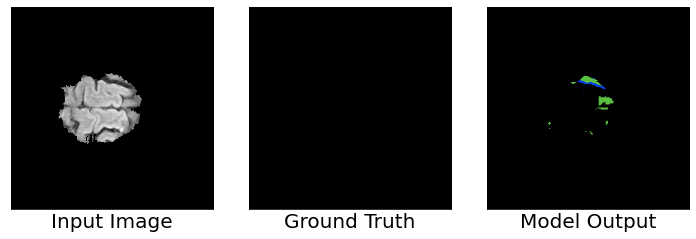

Steps: 148, L_xent:1.6836069822311401, L_dice: 0.9997861981391907
Total Loss: 2.6833932399749756
Accurary: 0.9930750131607056
Seq: TC, ET, WT
Dice coefficient: [0.8975, 0.85, 0.9316666666666666]
Gradient min:-0.1138484850525856, max:0.1298636794090271



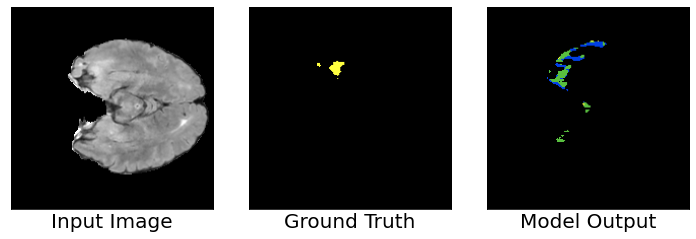

Steps: 149, L_xent:1.4136605262756348, L_dice: 1.0
Total Loss: 2.4136605262756348
Accurary: 0.9824749827384949
Seq: TC, ET, WT
Dice coefficient: [0.7525, 0.715, 0.8]
Gradient min:-0.0784880742430687, max:0.11252431571483612



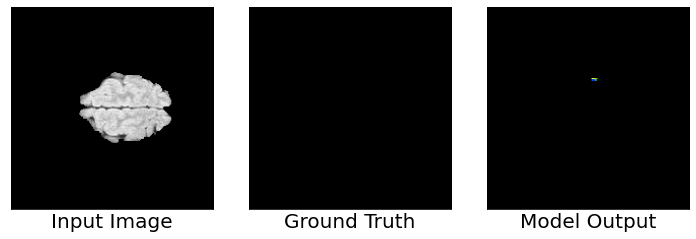

Steps: 150, L_xent:1.7023637294769287, L_dice: 1.0
Total Loss: 2.7023637294769287
Accurary: 0.9995750188827515
Seq: TC, ET, WT
Dice coefficient: [0.985, 0.985, 0.9883333333333333]
Gradient min:-0.13797476887702942, max:0.11678262799978256



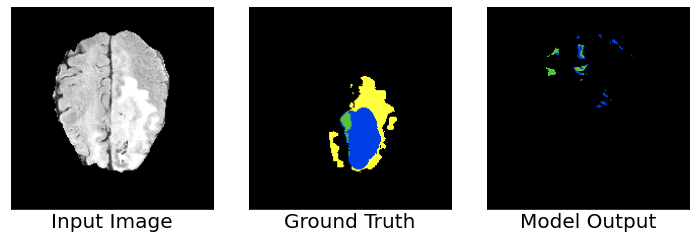

Steps: 151, L_xent:1.8244349956512451, L_dice: 0.9814971685409546
Total Loss: 2.80593204498291
Accurary: 0.9120000004768372
Seq: TC, ET, WT
Dice coefficient: [0.5625, 0.68, 0.5483333333333333]
Gradient min:-0.1726909577846527, max:0.2114284485578537



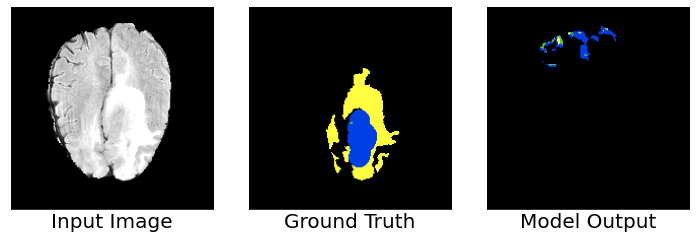

Steps: 152, L_xent:2.096611976623535, L_dice: 0.9997905492782593
Total Loss: 3.096402645111084
Accurary: 0.8976500034332275
Seq: TC, ET, WT
Dice coefficient: [0.6975, 0.88, 0.5916666666666667]
Gradient min:-0.22063271701335907, max:0.20899349451065063



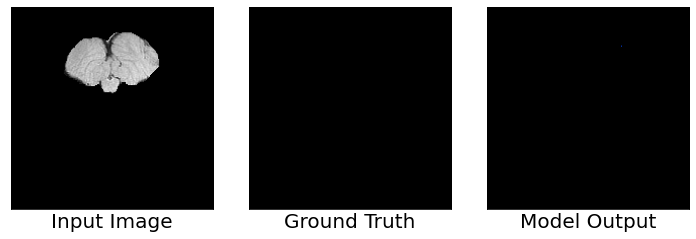

Steps: 153, L_xent:1.9680036306381226, L_dice: 1.0
Total Loss: 2.968003749847412
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.5737564563751221, max:0.4193694293498993



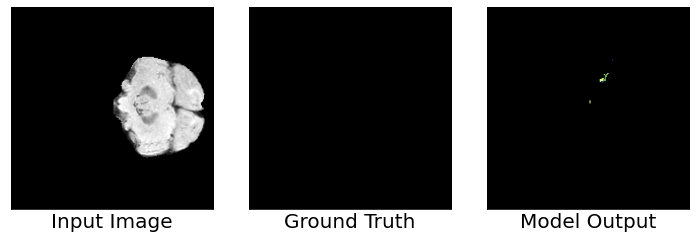

Steps: 154, L_xent:1.2830678224563599, L_dice: 1.0
Total Loss: 2.2830677032470703
Accurary: 0.9991499781608582
Seq: TC, ET, WT
Dice coefficient: [0.9725, 0.96, 0.9683333333333334]
Gradient min:-0.06050973758101463, max:0.104734867811203



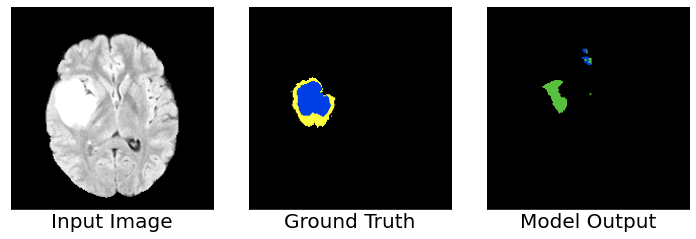

Steps: 155, L_xent:1.5463804006576538, L_dice: 0.9997066259384155
Total Loss: 2.5460870265960693
Accurary: 0.9615499973297119
Seq: TC, ET, WT
Dice coefficient: [0.7679166666790843, 0.7808333333581686, 0.7619444444527229]
Gradient min:-0.09220331907272339, max:0.16873808205127716



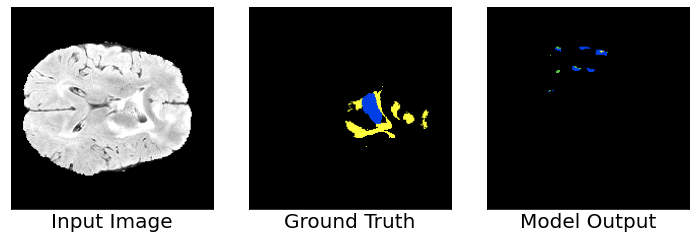

Steps: 156, L_xent:1.547866940498352, L_dice: 1.0
Total Loss: 2.5478668212890625
Accurary: 0.9661999940872192
Seq: TC, ET, WT
Dice coefficient: [0.8525, 0.945, 0.8166666666666667]
Gradient min:-0.11109886318445206, max:0.10789724439382553



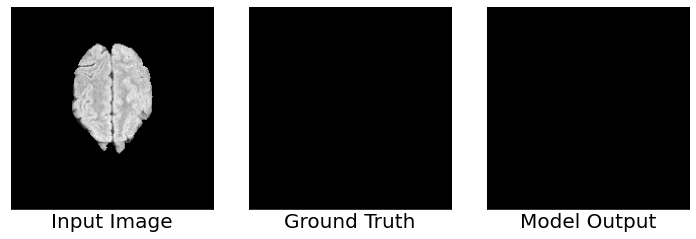

Steps: 157, L_xent:1.963951826095581, L_dice: 1.0
Total Loss: 2.963951826095581
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.2675904333591461, max:0.27201831340789795



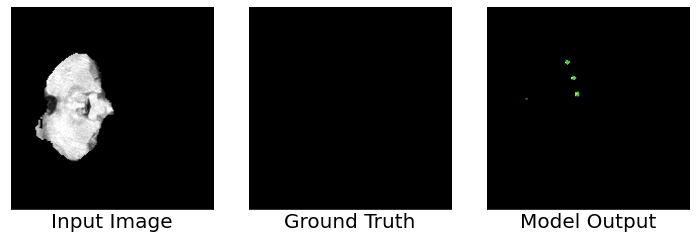

Steps: 158, L_xent:1.311236023902893, L_dice: 1.0
Total Loss: 2.3112359046936035
Accurary: 0.9986000061035156
Seq: TC, ET, WT
Dice coefficient: [0.9425, 0.925, 0.95]
Gradient min:-0.07522986829280853, max:0.10864671319723129



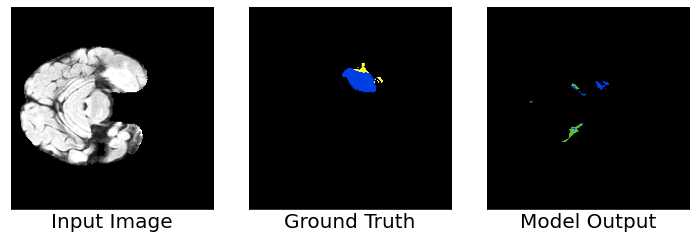

Steps: 159, L_xent:1.324450135231018, L_dice: 1.0
Total Loss: 2.3244500160217285
Accurary: 0.9834499955177307
Seq: TC, ET, WT
Dice coefficient: [0.8658272588439285, 0.87, 0.8838848392292857]
Gradient min:-0.07291745394468307, max:0.10833468288183212



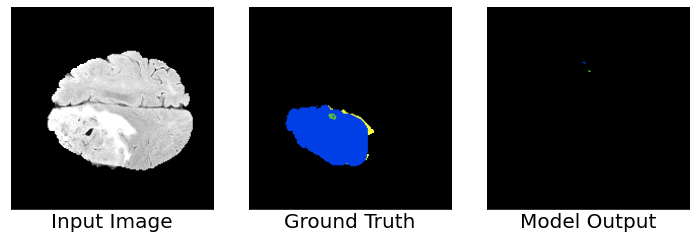

Steps: 160, L_xent:2.0357933044433594, L_dice: 0.997232973575592
Total Loss: 3.0330262184143066
Accurary: 0.9090750217437744
Seq: TC, ET, WT
Dice coefficient: [0.82, 0.96, 0.82]
Gradient min:-0.23519253730773926, max:0.2286970615386963



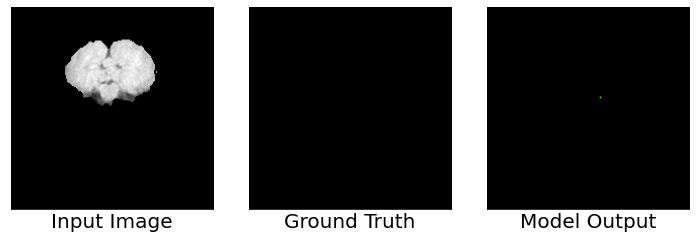

Steps: 161, L_xent:2.018989086151123, L_dice: 1.0
Total Loss: 3.018989086151123
Accurary: 0.9999250173568726
Seq: TC, ET, WT
Dice coefficient: [0.995, 0.99, 0.9966666666666667]
Gradient min:-0.346021443605423, max:0.486279159784317



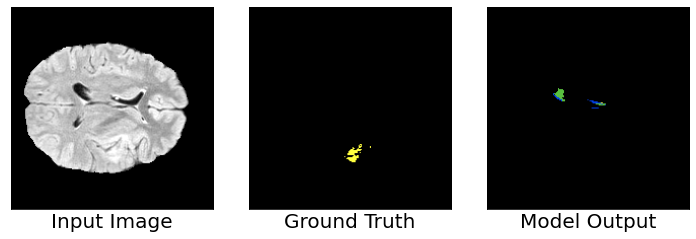

Steps: 162, L_xent:1.3366811275482178, L_dice: 1.0
Total Loss: 2.3366811275482178
Accurary: 0.9937499761581421
Seq: TC, ET, WT
Dice coefficient: [0.9275, 0.925, 0.92]
Gradient min:-0.07856182754039764, max:0.10933534055948257



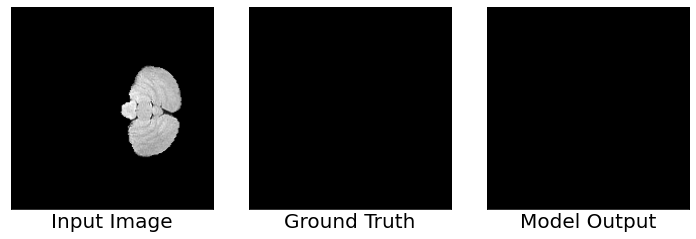

Steps: 163, L_xent:1.3019579648971558, L_dice: 1.0
Total Loss: 2.3019580841064453
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.08866743743419647, max:0.11885849386453629



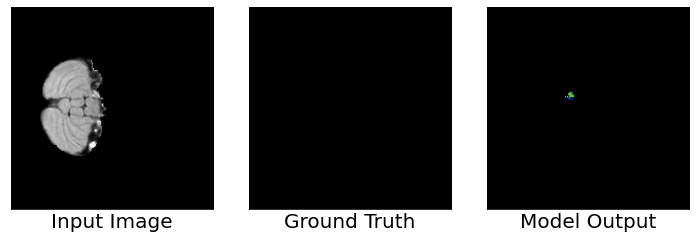

Steps: 164, L_xent:1.3157296180725098, L_dice: 0.99908047914505
Total Loss: 2.314810037612915
Accurary: 0.9991499781608582
Seq: TC, ET, WT
Dice coefficient: [0.975, 0.975, 0.9816666666666667]
Gradient min:-0.06312611699104309, max:0.0865900069475174



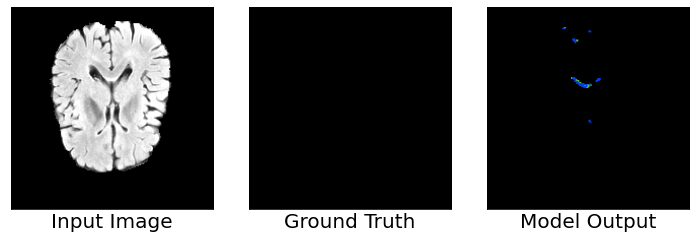

Steps: 165, L_xent:1.3589657545089722, L_dice: 1.0
Total Loss: 2.3589658737182617
Accurary: 0.9969249963760376
Seq: TC, ET, WT
Dice coefficient: [0.9075, 0.935, 0.9383333333333334]
Gradient min:-0.35385870933532715, max:0.7113519906997681



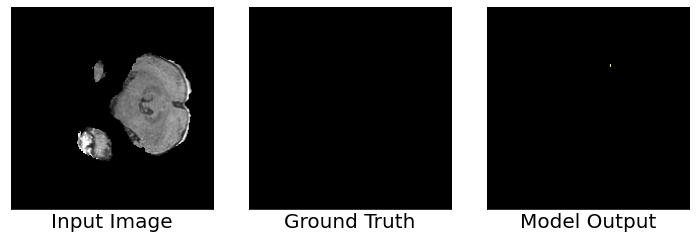

Steps: 166, L_xent:1.3280792236328125, L_dice: 1.0
Total Loss: 2.3280792236328125
Accurary: 0.9999250173568726
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 0.995]
Gradient min:-0.12912029027938843, max:0.10405951738357544



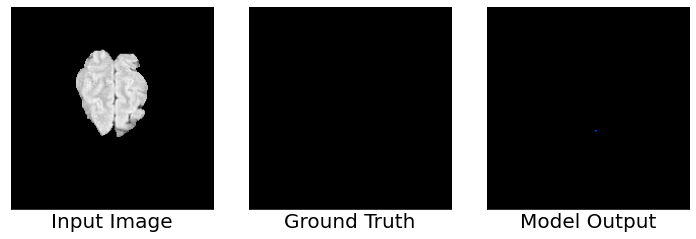

Steps: 167, L_xent:1.2550208568572998, L_dice: 1.0
Total Loss: 2.2550208568573
Accurary: 0.9999250173568726
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.0871957540512085, max:0.11364343017339706



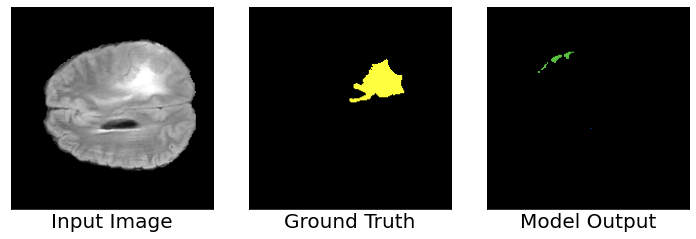

Steps: 168, L_xent:1.8292291164398193, L_dice: 1.0
Total Loss: 2.8292291164398193
Accurary: 0.9684749841690063
Seq: TC, ET, WT
Dice coefficient: [0.945, 0.9, 0.8916666666666667]
Gradient min:-0.6170674562454224, max:0.19613102078437805



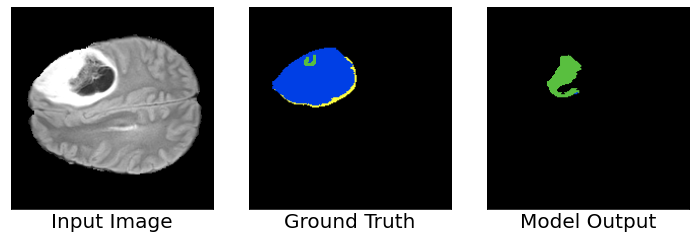

Steps: 169, L_xent:1.8429851531982422, L_dice: 0.986687183380127
Total Loss: 2.829672336578369
Accurary: 0.9131249785423279
Seq: TC, ET, WT
Dice coefficient: [0.7503688081353903, 0.79, 0.7519125387569269]
Gradient min:-0.3284064829349518, max:0.1769440621137619



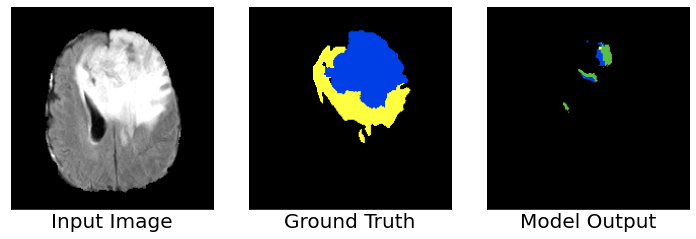

Steps: 170, L_xent:1.9907580614089966, L_dice: 1.0
Total Loss: 2.990757942199707
Accurary: 0.8425750136375427
Seq: TC, ET, WT
Dice coefficient: [0.7061824668338522, 0.78, 0.6424549778892348]
Gradient min:-0.2161279022693634, max:0.08807334303855896



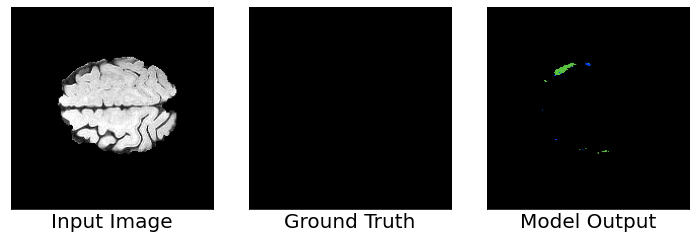

Steps: 171, L_xent:1.2700402736663818, L_dice: 1.0
Total Loss: 2.270040273666382
Accurary: 0.9965500235557556
Seq: TC, ET, WT
Dice coefficient: [0.925, 0.9, 0.95]
Gradient min:-0.06765042245388031, max:0.10293737798929214



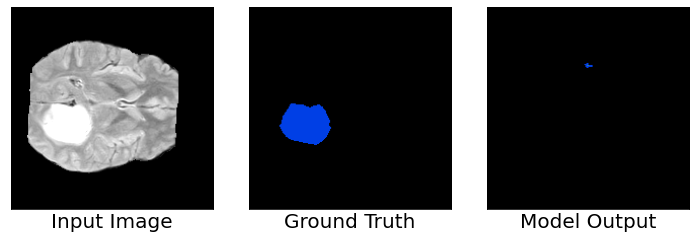

Steps: 172, L_xent:1.5907865762710571, L_dice: 1.0
Total Loss: 2.5907864570617676
Accurary: 0.9604750275611877
Seq: TC, ET, WT
Dice coefficient: [0.88, 0.995, 0.92]
Gradient min:-0.1442384272813797, max:0.19824084639549255



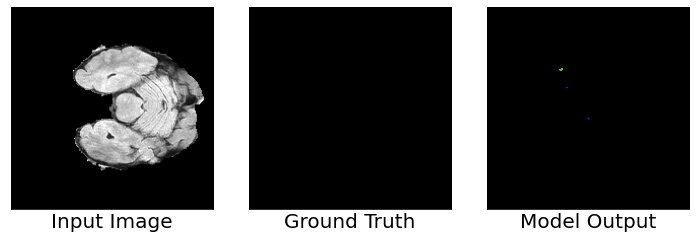

Steps: 173, L_xent:1.3890609741210938, L_dice: 1.0
Total Loss: 2.3890609741210938
Accurary: 0.9996500015258789
Seq: TC, ET, WT
Dice coefficient: [0.9825, 0.985, 0.9883333333333333]
Gradient min:-0.08379248529672623, max:0.10097595304250717



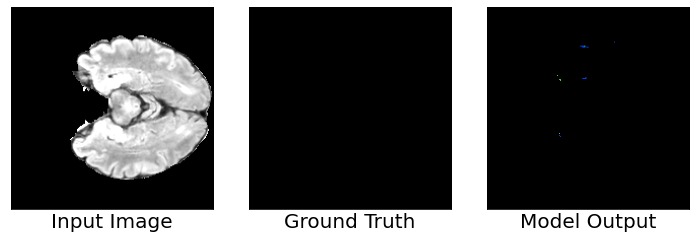

Steps: 174, L_xent:1.5821171998977661, L_dice: 1.0
Total Loss: 2.5821170806884766
Accurary: 0.9994249939918518
Seq: TC, ET, WT
Dice coefficient: [0.97, 0.975, 0.98]
Gradient min:-0.1286986619234085, max:0.08398900181055069



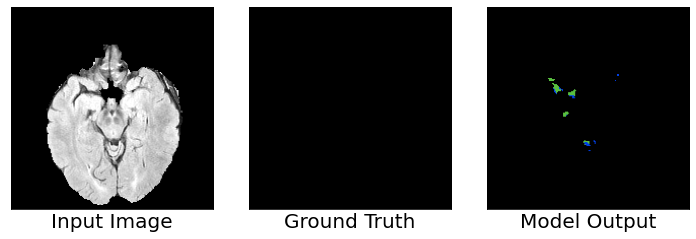

Steps: 175, L_xent:1.203982949256897, L_dice: 1.0
Total Loss: 2.2039828300476074
Accurary: 0.9957749843597412
Seq: TC, ET, WT
Dice coefficient: [0.8825, 0.87, 0.9216666666666666]
Gradient min:-0.06528235971927643, max:0.08565835654735565



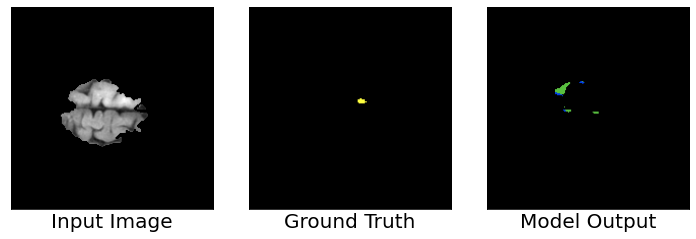

Steps: 176, L_xent:2.0192418098449707, L_dice: 1.0
Total Loss: 3.0192418098449707
Accurary: 0.9959250092506409
Seq: TC, ET, WT
Dice coefficient: [0.9325, 0.91, 0.9466666666666667]
Gradient min:-0.4743199646472931, max:0.30542293190956116



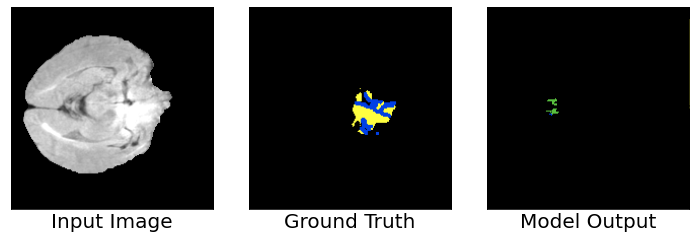

Steps: 177, L_xent:1.602193832397461, L_dice: 1.0
Total Loss: 2.602193832397461
Accurary: 0.9698500037193298
Seq: TC, ET, WT
Dice coefficient: [0.86, 0.935, 0.7183333333333334]
Gradient min:-0.22431978583335876, max:0.14546534419059753



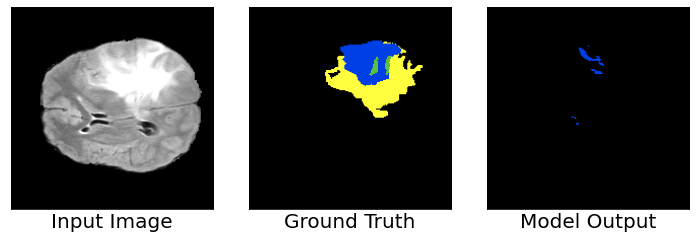

Steps: 178, L_xent:1.6899192333221436, L_dice: 0.9726665019989014
Total Loss: 2.662585735321045
Accurary: 0.8998500108718872
Seq: TC, ET, WT
Dice coefficient: [0.8394572062976658, 0.895, 0.7696381375317772]
Gradient min:-0.2093009501695633, max:0.1558043509721756



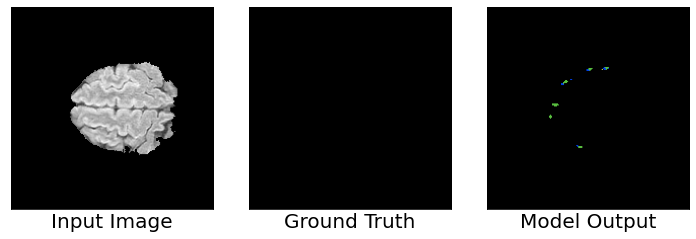

Steps: 179, L_xent:1.201796293258667, L_dice: 1.0
Total Loss: 2.201796293258667
Accurary: 0.99795001745224
Seq: TC, ET, WT
Dice coefficient: [0.9325, 0.915, 0.9533333333333334]
Gradient min:-0.11085125803947449, max:0.08319710195064545



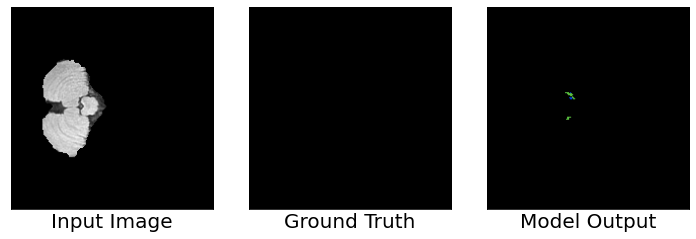

Steps: 180, L_xent:1.1505471467971802, L_dice: 1.0
Total Loss: 2.1505470275878906
Accurary: 0.9991000294685364
Seq: TC, ET, WT
Dice coefficient: [0.9675, 0.95, 0.9783333333333334]
Gradient min:-0.04087698087096214, max:0.03753974661231041



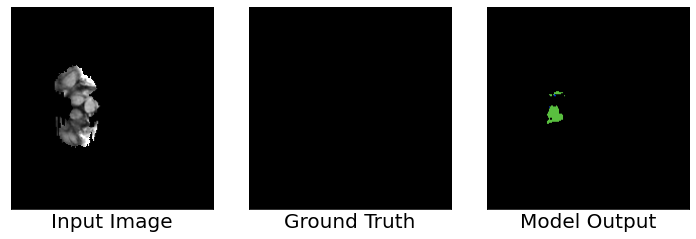

Steps: 181, L_xent:1.1897144317626953, L_dice: 1.0
Total Loss: 2.1897144317626953
Accurary: 0.9945250153541565
Seq: TC, ET, WT
Dice coefficient: [0.9325, 0.885, 0.955]
Gradient min:-0.08783483505249023, max:0.08624064922332764



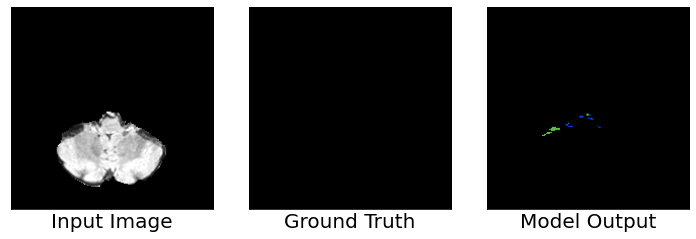

Steps: 182, L_xent:1.1754555702209473, L_dice: 1.0
Total Loss: 2.1754555702209473
Accurary: 0.9980000257492065
Seq: TC, ET, WT
Dice coefficient: [0.945, 0.945, 0.9633333333333334]
Gradient min:-0.08684536069631577, max:0.10169176012277603



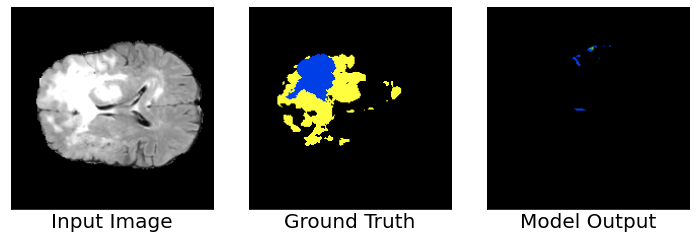

Steps: 183, L_xent:1.652867078781128, L_dice: 1.0
Total Loss: 2.652867078781128
Accurary: 0.8911499977111816
Seq: TC, ET, WT
Dice coefficient: [0.85, 0.985, 0.7483333333333333]
Gradient min:-0.336418092250824, max:0.19872687757015228



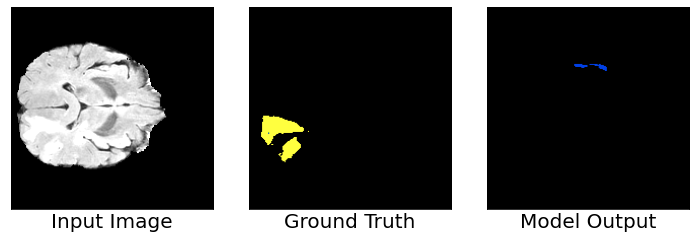

Steps: 184, L_xent:1.441618800163269, L_dice: 0.9999914169311523
Total Loss: 2.441610336303711
Accurary: 0.9751250147819519
Seq: TC, ET, WT
Dice coefficient: [0.975, 0.995, 0.9066666666666666]
Gradient min:-0.07735250890254974, max:0.10798036307096481



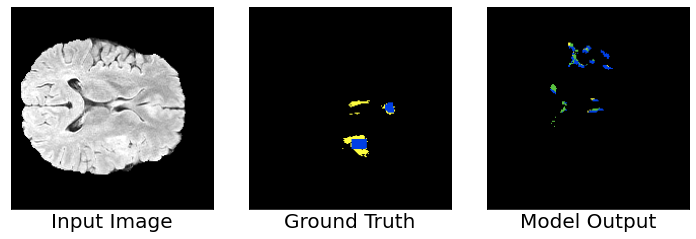

Steps: 185, L_xent:1.3048028945922852, L_dice: 1.0
Total Loss: 2.304802894592285
Accurary: 0.9782999753952026
Seq: TC, ET, WT
Dice coefficient: [0.7625, 0.785, 0.765]
Gradient min:-0.25323569774627686, max:0.15043677389621735



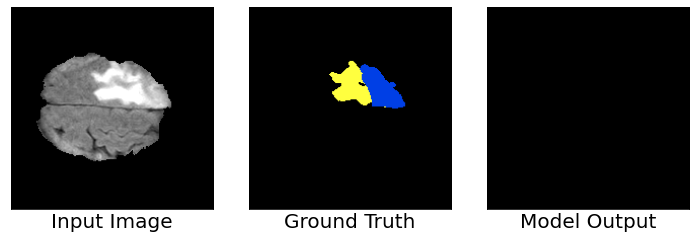

Steps: 186, L_xent:1.3362256288528442, L_dice: 1.0
Total Loss: 2.3362255096435547
Accurary: 0.9483749866485596
Seq: TC, ET, WT
Dice coefficient: [0.8875, 1.0, 0.85]
Gradient min:-0.18748429417610168, max:0.09671060740947723



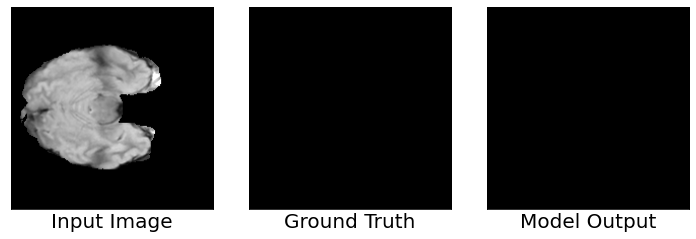

Steps: 187, L_xent:1.5465909242630005, L_dice: 1.0
Total Loss: 2.546590805053711
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.11850836873054504, max:0.1248759776353836



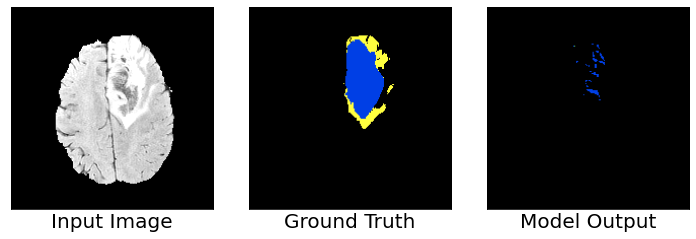

Steps: 188, L_xent:1.7641189098358154, L_dice: 1.0
Total Loss: 2.7641189098358154
Accurary: 0.9327750205993652
Seq: TC, ET, WT
Dice coefficient: [0.8231015867553652, 0.995, 0.7487343911702434]
Gradient min:-0.09496049582958221, max:0.07174742966890335



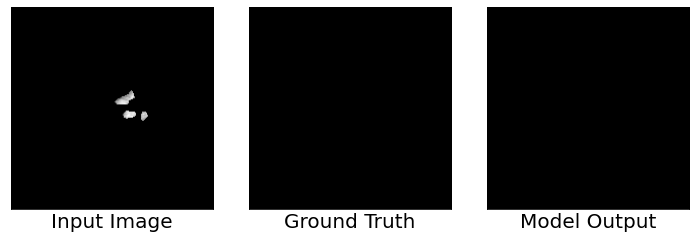

Steps: 189, L_xent:1.1529854536056519, L_dice: 1.0
Total Loss: 2.1529855728149414
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.08765944093465805, max:0.14082661271095276



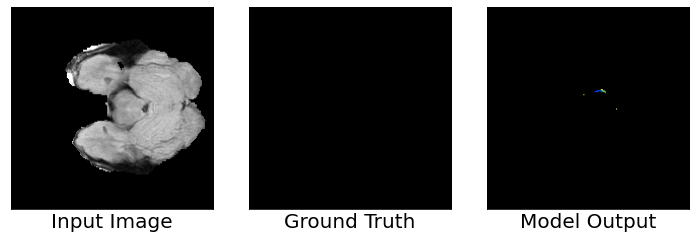

Steps: 190, L_xent:1.138357400894165, L_dice: 1.0
Total Loss: 2.138357400894165
Accurary: 0.9994249939918518
Seq: TC, ET, WT
Dice coefficient: [0.985, 0.985, 0.985]
Gradient min:-0.06340058147907257, max:0.07910212874412537



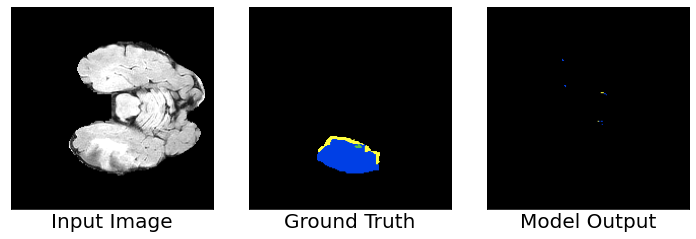

Steps: 191, L_xent:1.3857725858688354, L_dice: 0.9998141527175903
Total Loss: 2.385586738586426
Accurary: 0.9579499959945679
Seq: TC, ET, WT
Dice coefficient: [0.8825, 0.98, 0.8716666666666667]
Gradient min:-0.19175085425376892, max:0.12903866171836853



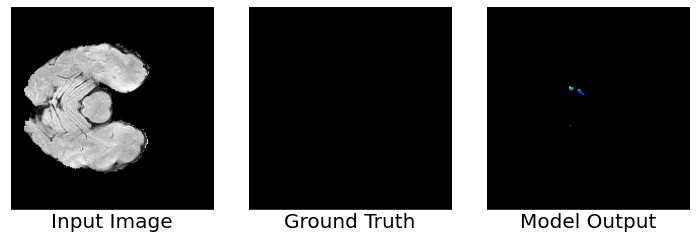

Steps: 192, L_xent:1.1082879304885864, L_dice: 1.0
Total Loss: 2.108287811279297
Accurary: 0.9990749955177307
Seq: TC, ET, WT
Dice coefficient: [0.9675, 0.975, 0.9766666666666667]
Gradient min:-0.043484825640916824, max:0.036818455904722214



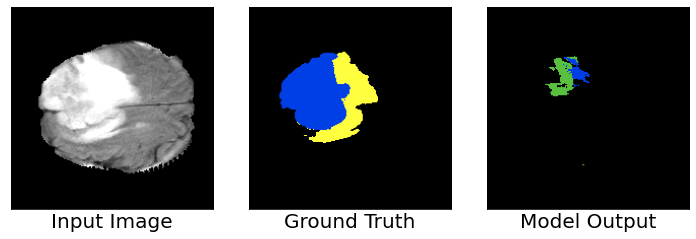

Steps: 193, L_xent:1.6018582582473755, L_dice: 1.0
Total Loss: 2.601858139038086
Accurary: 0.8595749735832214
Seq: TC, ET, WT
Dice coefficient: [0.7106651303032413, 0.795, 0.6571100868688275]
Gradient min:-0.413595587015152, max:0.4564742147922516



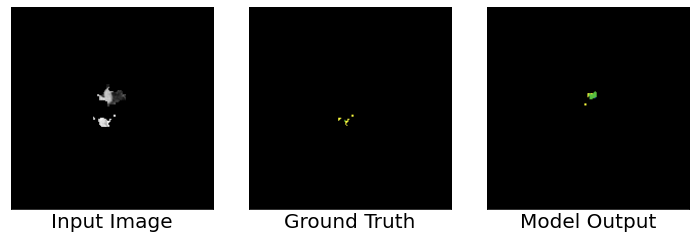

Steps: 194, L_xent:1.1461162567138672, L_dice: 1.0
Total Loss: 2.146116256713867
Accurary: 0.9980999827384949
Seq: TC, ET, WT
Dice coefficient: [0.97, 0.95, 0.9533333333333334]
Gradient min:-0.10027870535850525, max:0.15651196241378784



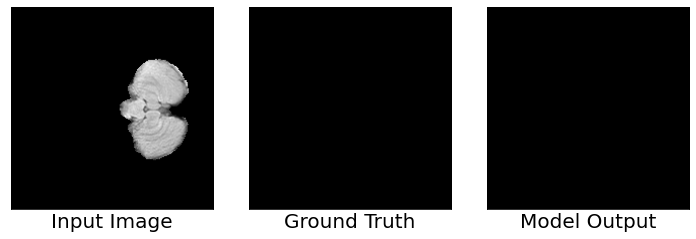

Steps: 195, L_xent:1.139608383178711, L_dice: 1.0
Total Loss: 2.139608383178711
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.08498796075582504, max:0.09936922043561935



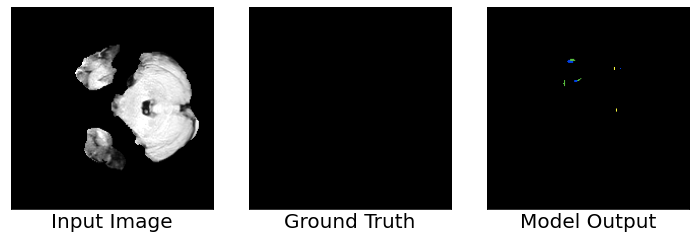

Steps: 196, L_xent:1.1320286989212036, L_dice: 1.0
Total Loss: 2.132028579711914
Accurary: 0.9987999796867371
Seq: TC, ET, WT
Dice coefficient: [0.9575, 0.95, 0.9616666666666667]
Gradient min:-0.08253505825996399, max:0.08041281253099442



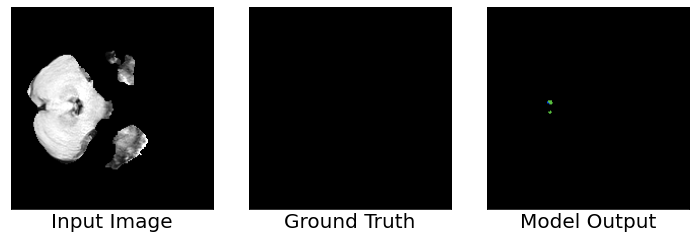

Steps: 197, L_xent:1.1064647436141968, L_dice: 1.0
Total Loss: 2.1064648628234863
Accurary: 0.9993749856948853
Seq: TC, ET, WT
Dice coefficient: [0.975, 0.965, 0.9833333333333333]
Gradient min:-0.057295020669698715, max:0.047647032886743546



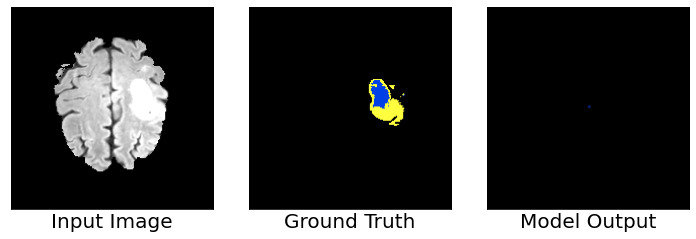

Steps: 198, L_xent:1.3776559829711914, L_dice: 1.0
Total Loss: 2.3776559829711914
Accurary: 0.9748499989509583
Seq: TC, ET, WT
Dice coefficient: [0.9275, 1.0, 0.875]
Gradient min:-0.07422085851430893, max:0.13880610466003418



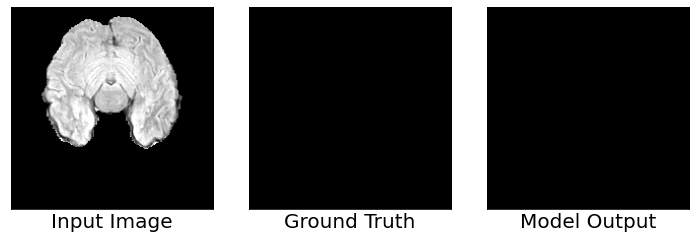

Steps: 199, L_xent:1.1990169286727905, L_dice: 1.0
Total Loss: 2.19901704788208
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.10664743185043335, max:0.14231066405773163



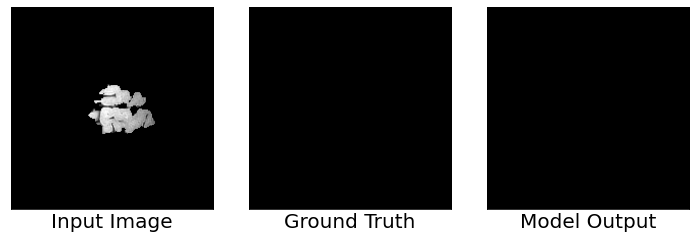

Steps: 200, L_xent:1.0917813777923584, L_dice: 1.0
Total Loss: 2.0917813777923584
Accurary: 0.9999750256538391
Seq: TC, ET, WT
Dice coefficient: [0.9975, 1.0, 0.9983333333333333]
Gradient min:-0.08258166164159775, max:0.10181856155395508



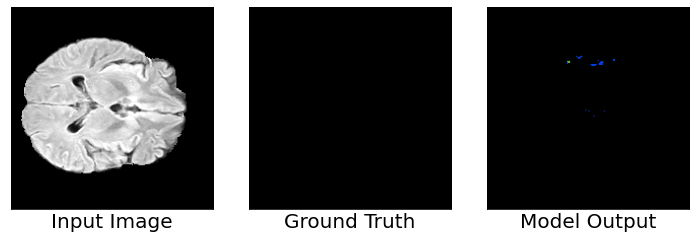

Steps: 201, L_xent:1.648404836654663, L_dice: 0.9980373978614807
Total Loss: 2.646442174911499
Accurary: 0.9987750053405762
Seq: TC, ET, WT
Dice coefficient: [0.9625, 0.99, 0.975]
Gradient min:-0.12126999348402023, max:0.18046316504478455



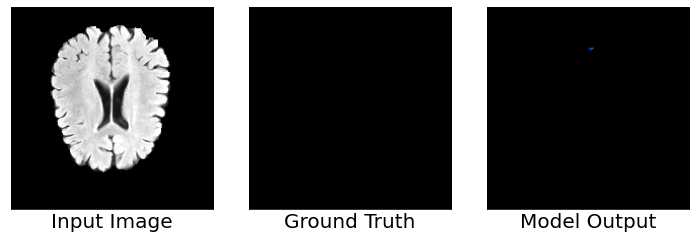

Steps: 202, L_xent:1.3899728059768677, L_dice: 0.9929326772689819
Total Loss: 2.3829054832458496
Accurary: 0.9997749924659729
Seq: TC, ET, WT
Dice coefficient: [0.99, 0.995, 0.9933333333333333]
Gradient min:-0.11124837398529053, max:0.08646075427532196



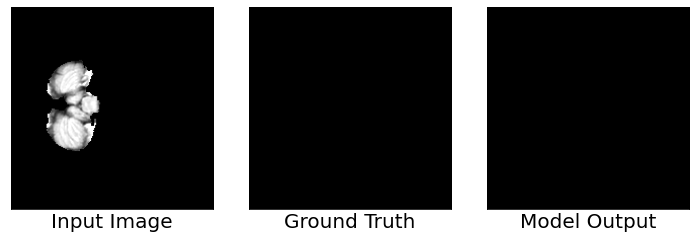

Steps: 203, L_xent:1.0846693515777588, L_dice: 1.0
Total Loss: 2.084669351577759
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.07166948914527893, max:0.09224079549312592



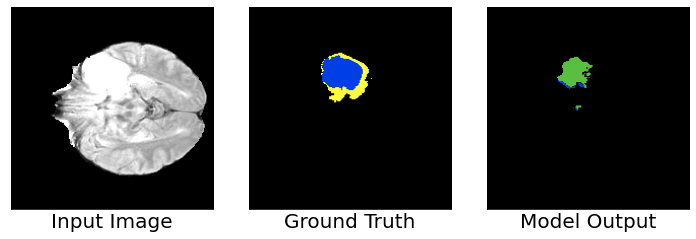

Steps: 204, L_xent:1.1754341125488281, L_dice: 1.0
Total Loss: 2.175434112548828
Accurary: 0.9588500261306763
Seq: TC, ET, WT
Dice coefficient: [0.8194086190871894, 0.825, 0.7979390793914596]
Gradient min:-0.11748684197664261, max:0.15931448340415955



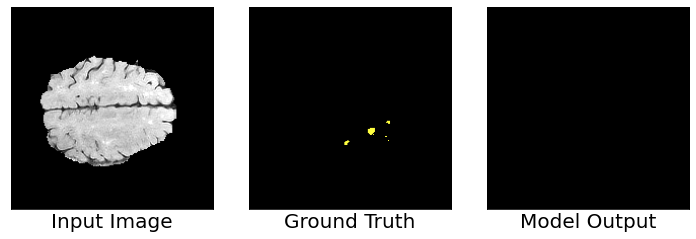

Steps: 205, L_xent:1.3265808820724487, L_dice: 1.0
Total Loss: 2.3265810012817383
Accurary: 0.9983500242233276
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 0.9733333333333334]
Gradient min:-0.09245498478412628, max:0.12912574410438538



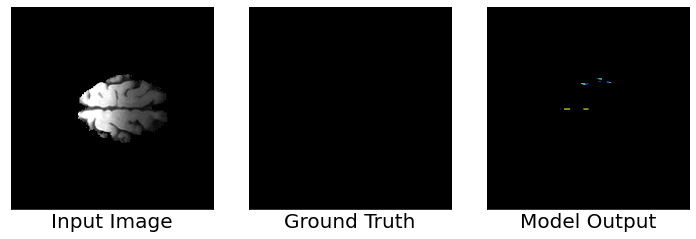

Steps: 206, L_xent:1.0948429107666016, L_dice: 1.0
Total Loss: 2.0948429107666016
Accurary: 0.9990000128746033
Seq: TC, ET, WT
Dice coefficient: [0.9675, 0.975, 0.975]
Gradient min:-0.05692315474152565, max:0.12312202155590057



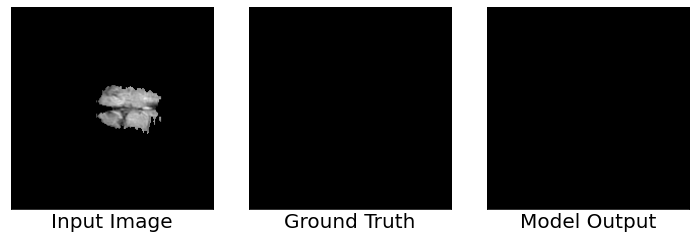

Steps: 207, L_xent:1.4748036861419678, L_dice: 0.9877935647964478
Total Loss: 2.462597370147705
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.25780272483825684, max:0.15758855640888214



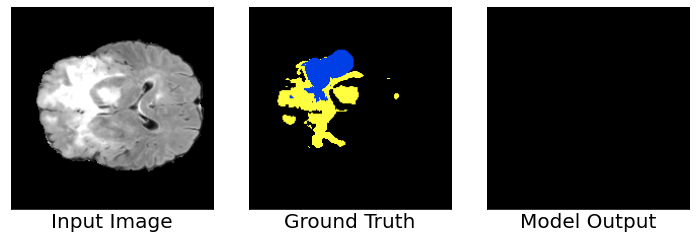

Steps: 208, L_xent:1.6401845216751099, L_dice: 0.9902756214141846
Total Loss: 2.630460262298584
Accurary: 0.903249979019165
Seq: TC, ET, WT
Dice coefficient: [0.87, 1.0, 0.7666666666666667]
Gradient min:-0.16721954941749573, max:0.07471413910388947



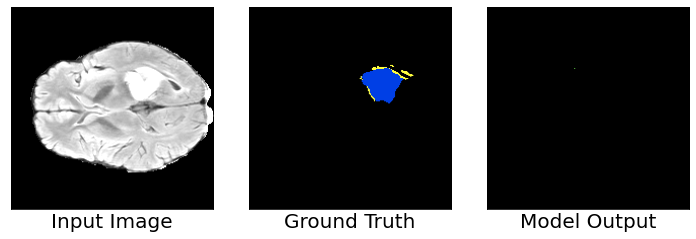

Steps: 209, L_xent:1.1197121143341064, L_dice: 1.0
Total Loss: 2.1197121143341064
Accurary: 0.9735749959945679
Seq: TC, ET, WT
Dice coefficient: [0.91, 0.995, 0.89]
Gradient min:-0.05866672843694687, max:0.053708385676145554



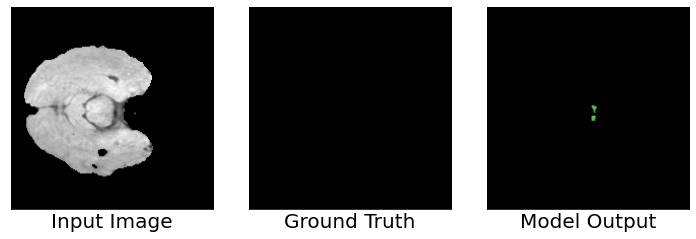

Steps: 210, L_xent:1.1025313138961792, L_dice: 1.0
Total Loss: 2.1025314331054688
Accurary: 0.9989749789237976
Seq: TC, ET, WT
Dice coefficient: [0.9625, 0.94, 0.975]
Gradient min:-0.2696037292480469, max:0.5345316529273987



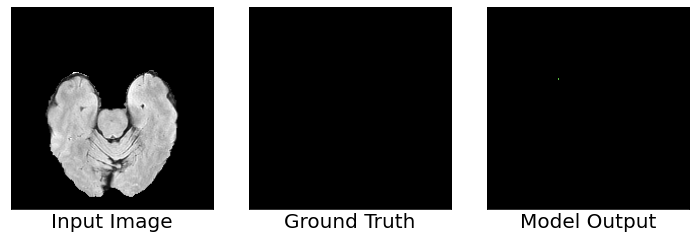

Steps: 211, L_xent:1.0351479053497314, L_dice: 1.0
Total Loss: 2.0351479053497314
Accurary: 0.9999499917030334
Seq: TC, ET, WT
Dice coefficient: [0.995, 0.99, 0.9966666666666667]
Gradient min:-0.044265016913414, max:0.05767335742712021



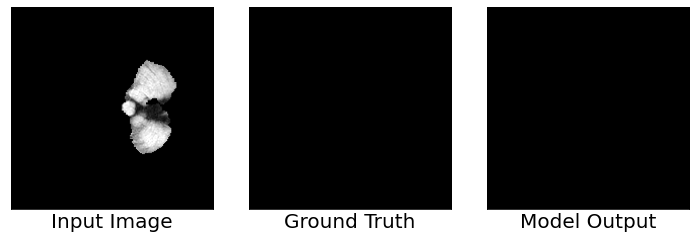

Steps: 212, L_xent:1.0790501832962036, L_dice: 1.0
Total Loss: 2.079050064086914
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.055295299738645554, max:0.05852143466472626



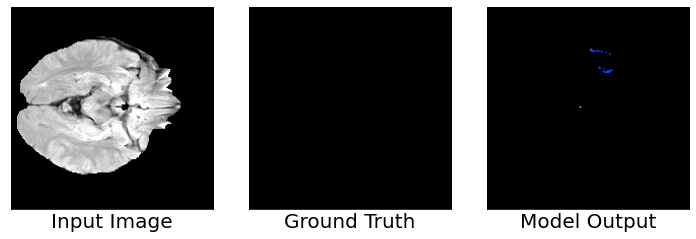

Steps: 213, L_xent:1.1046384572982788, L_dice: 1.0
Total Loss: 2.1046385765075684
Accurary: 0.9985499978065491
Seq: TC, ET, WT
Dice coefficient: [0.97, 1.0, 0.9766666666666667]
Gradient min:-0.09430870413780212, max:0.07567813247442245



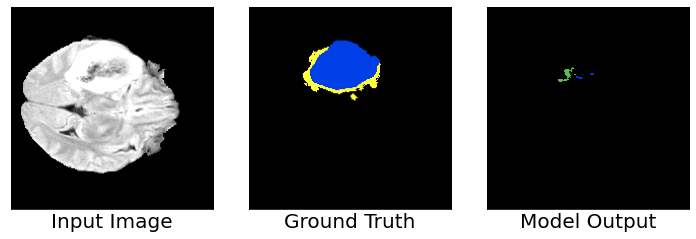

Steps: 214, L_xent:1.1795510053634644, L_dice: 1.0
Total Loss: 2.179551124572754
Accurary: 0.926675021648407
Seq: TC, ET, WT
Dice coefficient: [0.8414406698383391, 0.925, 0.8059604465588928]
Gradient min:-0.03693085163831711, max:0.03250950947403908



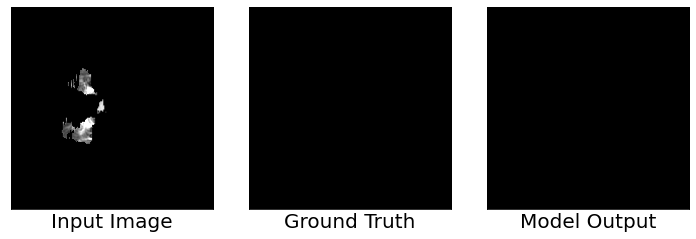

Steps: 215, L_xent:1.0143426656723022, L_dice: 1.0
Total Loss: 2.014342784881592
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.029993131756782532, max:0.04626276344060898



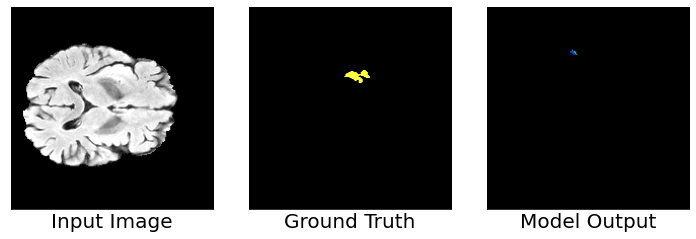

Steps: 216, L_xent:1.052534818649292, L_dice: 1.0
Total Loss: 2.052534818649292
Accurary: 0.9956250190734863
Seq: TC, ET, WT
Dice coefficient: [0.9775, 0.975, 0.9633333333333334]
Gradient min:-0.08955167233943939, max:0.08709263801574707



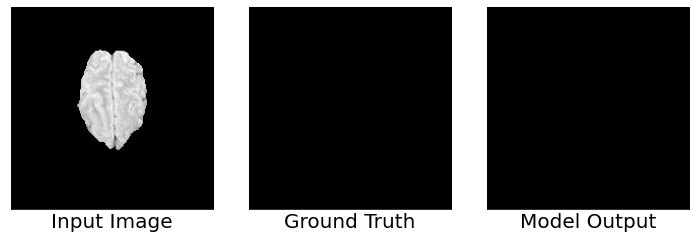

Steps: 217, L_xent:0.9958453178405762, L_dice: 1.0
Total Loss: 1.9958453178405762
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.07415352016687393, max:0.07532967627048492



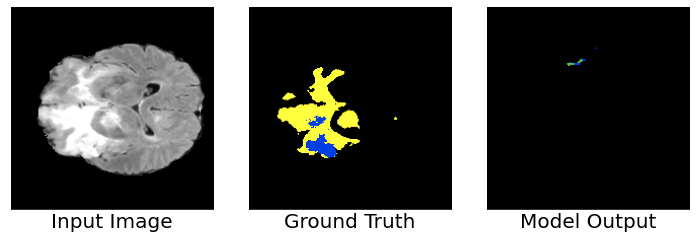

Steps: 218, L_xent:1.43935227394104, L_dice: 1.0
Total Loss: 2.43935227394104
Accurary: 0.9185749888420105
Seq: TC, ET, WT
Dice coefficient: [0.875, 0.965, 0.7666666666666667]
Gradient min:-0.12812115252017975, max:0.07958828657865524



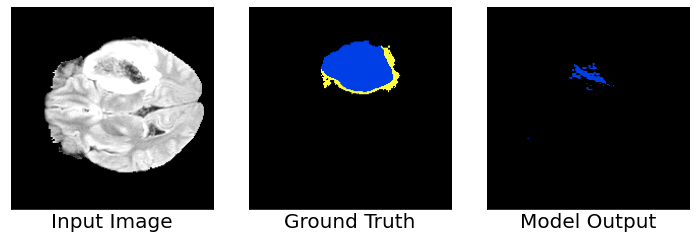

Steps: 219, L_xent:1.1741657257080078, L_dice: 1.0
Total Loss: 2.174165725708008
Accurary: 0.9311249852180481
Seq: TC, ET, WT
Dice coefficient: [0.8888531644269824, 1.0, 0.8459021096179883]
Gradient min:-0.06200697273015976, max:0.0624222569167614



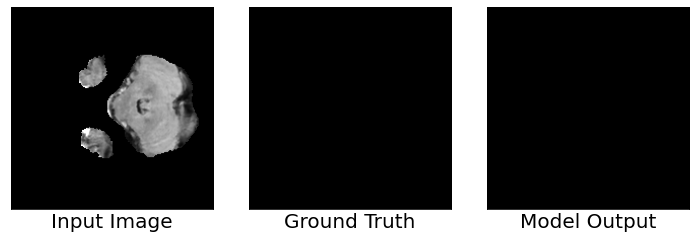

Steps: 220, L_xent:0.9940977692604065, L_dice: 1.0
Total Loss: 1.9940977096557617
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.053133390843868256, max:0.057711176574230194



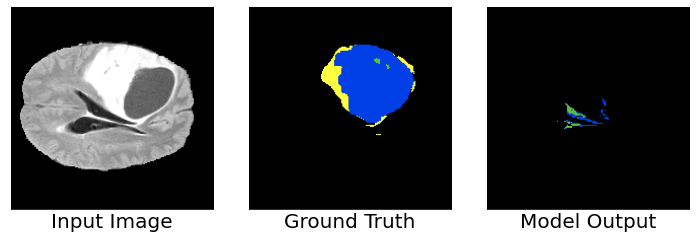

Steps: 221, L_xent:1.474492073059082, L_dice: 0.9965051412582397
Total Loss: 2.4709973335266113
Accurary: 0.8697249889373779
Seq: TC, ET, WT
Dice coefficient: [0.714575969260186, 0.83, 0.6797173128401239]
Gradient min:-0.26545655727386475, max:0.13434429466724396



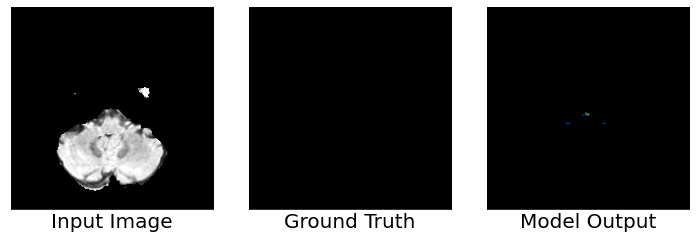

Steps: 222, L_xent:1.642543911933899, L_dice: 0.9788833260536194
Total Loss: 2.621427297592163
Accurary: 0.9995999932289124
Seq: TC, ET, WT
Dice coefficient: [0.9875, 0.985, 0.9916666666666667]
Gradient min:-0.16336022317409515, max:0.16847120225429535



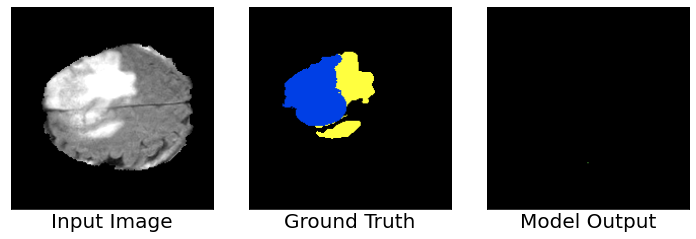

Steps: 223, L_xent:1.5555778741836548, L_dice: 1.0
Total Loss: 2.5555777549743652
Accurary: 0.8808000087738037
Seq: TC, ET, WT
Dice coefficient: [0.82, 0.995, 0.7533333333333333]
Gradient min:-0.2407245934009552, max:0.1433485597372055



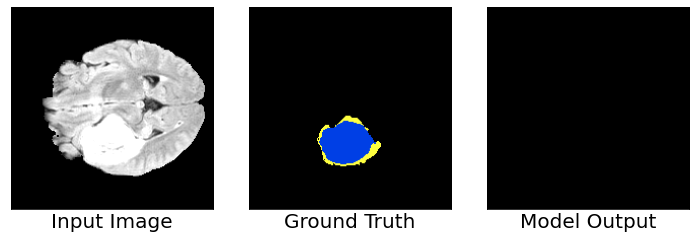

Steps: 224, L_xent:1.1967767477035522, L_dice: 1.0
Total Loss: 2.196776866912842
Accurary: 0.9472500085830688
Seq: TC, ET, WT
Dice coefficient: [0.8925, 1.0, 0.845]
Gradient min:-0.12669482827186584, max:0.1232573390007019



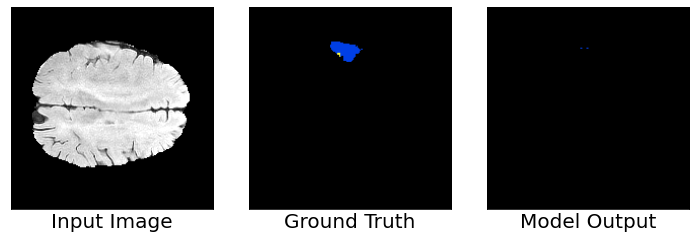

Steps: 225, L_xent:0.9781355857849121, L_dice: 1.0
Total Loss: 1.978135585784912
Accurary: 0.9909250140190125
Seq: TC, ET, WT
Dice coefficient: [0.9506451612710953, 1.0, 0.9604301075140635]
Gradient min:-0.059288229793310165, max:0.059718333184719086



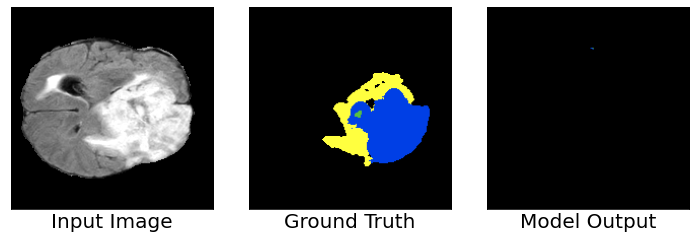

Steps: 226, L_xent:2.070143699645996, L_dice: 0.9991093277931213
Total Loss: 3.0692529678344727
Accurary: 0.852524995803833
Seq: TC, ET, WT
Dice coefficient: [0.79, 0.96, 0.705]
Gradient min:-0.4962965250015259, max:0.3559380769729614



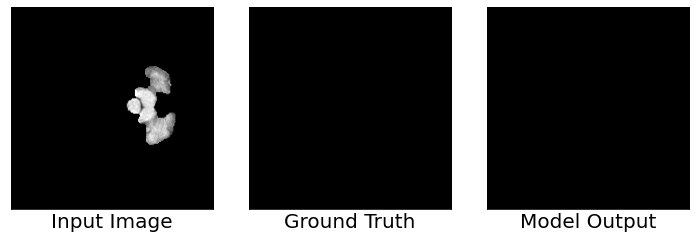

Steps: 227, L_xent:0.9783183336257935, L_dice: 1.0
Total Loss: 1.9783183336257935
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.05710101127624512, max:0.0642533004283905



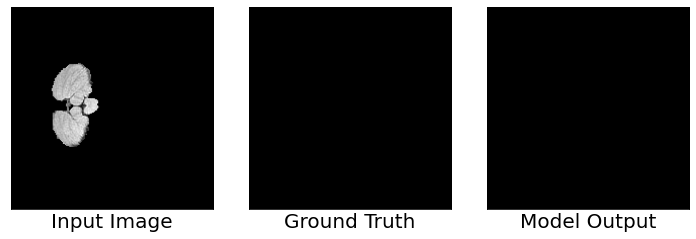

Steps: 228, L_xent:1.1527093648910522, L_dice: 1.0
Total Loss: 2.152709484100342
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.1257370114326477, max:0.07853829860687256



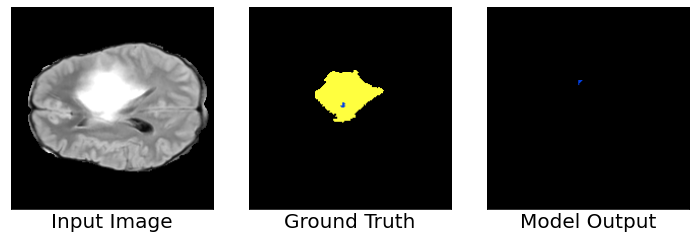

Steps: 229, L_xent:1.2853201627731323, L_dice: 1.0
Total Loss: 2.285320281982422
Accurary: 0.9505749940872192
Seq: TC, ET, WT
Dice coefficient: [0.975, 1.0, 0.8966666666666666]
Gradient min:-0.12982898950576782, max:0.09857044368982315



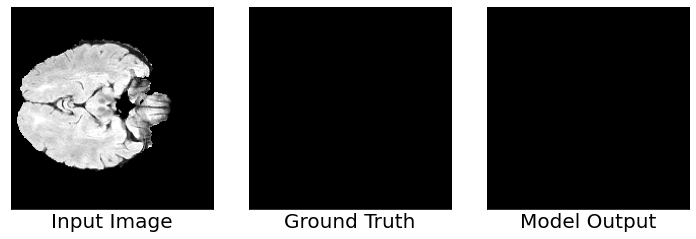

Steps: 230, L_xent:1.4239952564239502, L_dice: 0.9577571749687195
Total Loss: 2.3817524909973145
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.21031713485717773, max:0.2597121596336365



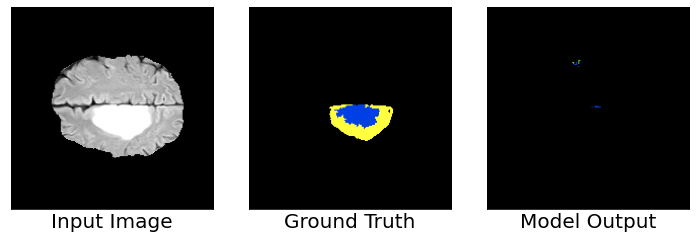

Steps: 231, L_xent:1.1478747129440308, L_dice: 1.0
Total Loss: 2.1478748321533203
Accurary: 0.9582250118255615
Seq: TC, ET, WT
Dice coefficient: [0.9216614419966936, 0.98, 0.8877742946644624]
Gradient min:-0.03297380730509758, max:0.047756750136613846



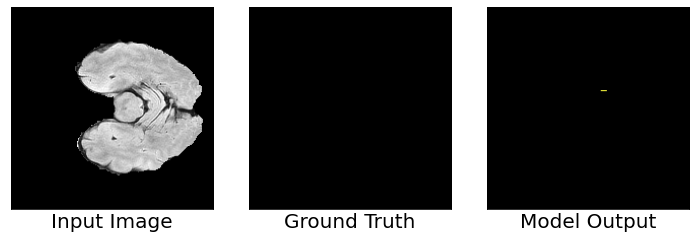

Steps: 232, L_xent:0.9585192799568176, L_dice: 1.0
Total Loss: 1.9585192203521729
Accurary: 0.9998499751091003
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 0.9983333333333333]
Gradient min:-0.07265929132699966, max:0.0818943977355957



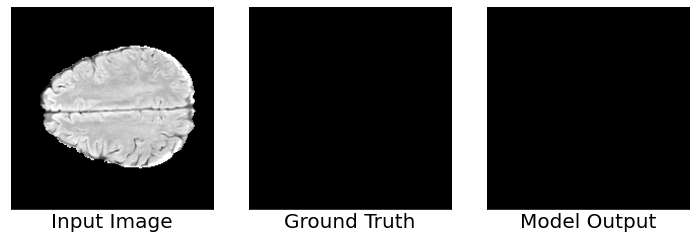

Steps: 233, L_xent:0.9691635966300964, L_dice: 1.0
Total Loss: 1.9691636562347412
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.08024052530527115, max:0.08042533695697784



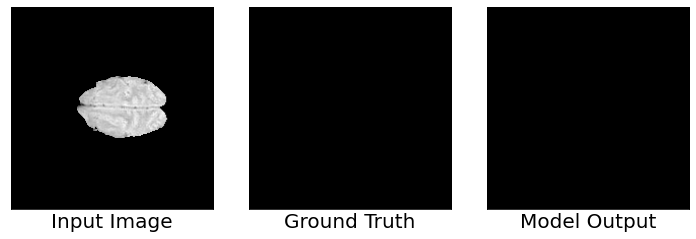

Steps: 234, L_xent:0.9494843482971191, L_dice: 1.0
Total Loss: 1.9494843482971191
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.08474379032850266, max:0.07016195356845856



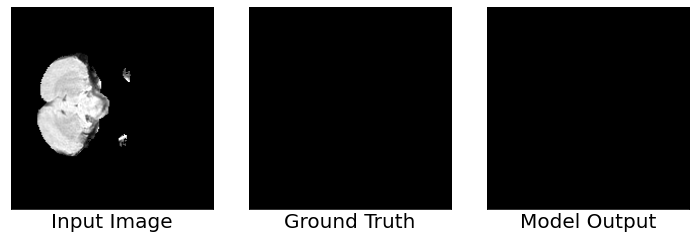

Steps: 235, L_xent:0.9472692608833313, L_dice: 1.0
Total Loss: 1.9472692012786865
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.03162702918052673, max:0.033795591443777084



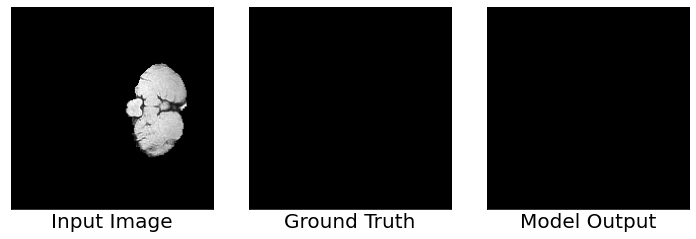

Steps: 236, L_xent:1.0815420150756836, L_dice: 1.0
Total Loss: 2.0815420150756836
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.07883862406015396, max:0.04565611854195595



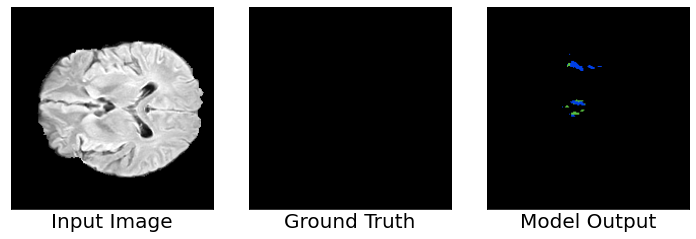

Steps: 237, L_xent:1.0288681983947754, L_dice: 1.0
Total Loss: 2.0288681983947754
Accurary: 0.9952250123023987
Seq: TC, ET, WT
Dice coefficient: [0.9125, 0.925, 0.9416666666666667]
Gradient min:-0.13626033067703247, max:0.14860296249389648



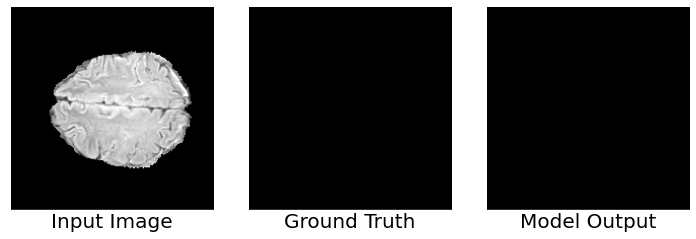

Steps: 238, L_xent:0.9544095993041992, L_dice: 1.0
Total Loss: 1.9544095993041992
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.10204414278268814, max:0.09921272844076157



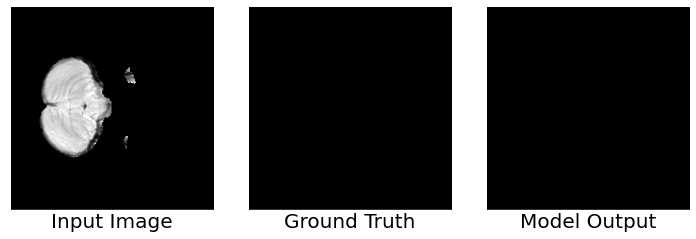

Steps: 239, L_xent:0.9318507313728333, L_dice: 1.0
Total Loss: 1.9318506717681885
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.03625050559639931, max:0.024385135620832443



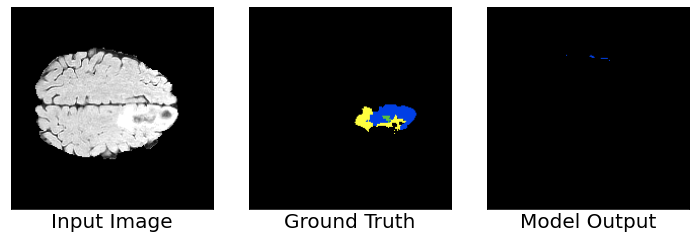

Steps: 240, L_xent:1.245587944984436, L_dice: 0.9929943680763245
Total Loss: 2.2385823726654053
Accurary: 0.9731500148773193
Seq: TC, ET, WT
Dice coefficient: [0.9075, 0.965, 0.895]
Gradient min:-0.11569060385227203, max:0.08621462434530258



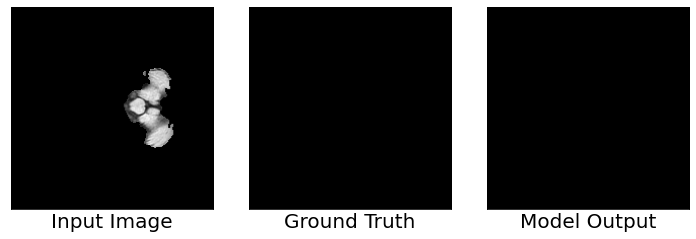

Steps: 241, L_xent:0.9270608425140381, L_dice: 1.0
Total Loss: 1.927060842514038
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.0404224619269371, max:0.04243261367082596



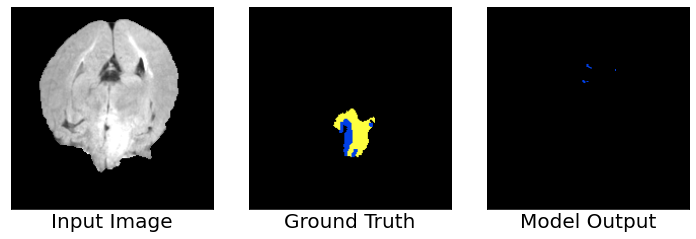

Steps: 242, L_xent:1.148026943206787, L_dice: 1.0
Total Loss: 2.148026943206787
Accurary: 0.9724000096321106
Seq: TC, ET, WT
Dice coefficient: [0.88, 1.0, 0.84]
Gradient min:-0.07139963656663895, max:0.12069866806268692



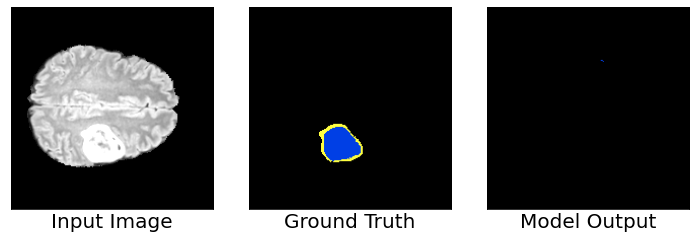

Steps: 243, L_xent:1.0592904090881348, L_dice: 1.0
Total Loss: 2.0592904090881348
Accurary: 0.9696249961853027
Seq: TC, ET, WT
Dice coefficient: [0.91, 1.0, 0.8766666666666667]
Gradient min:-0.08781137317419052, max:0.0865291953086853



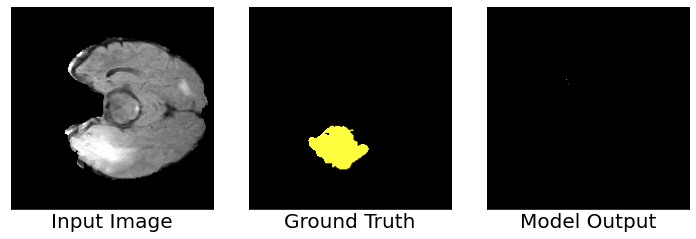

Steps: 244, L_xent:1.2031738758087158, L_dice: 1.0
Total Loss: 2.203173875808716
Accurary: 0.9613500237464905
Seq: TC, ET, WT
Dice coefficient: [0.995, 0.995, 0.925]
Gradient min:-0.1867472529411316, max:0.1721549928188324



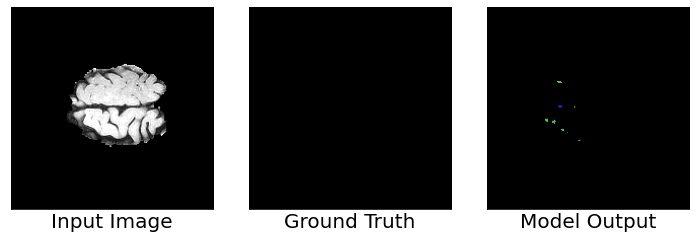

Steps: 245, L_xent:0.9534580111503601, L_dice: 1.0
Total Loss: 1.9534580707550049
Accurary: 0.9989749789237976
Seq: TC, ET, WT
Dice coefficient: [0.9675, 0.95, 0.9766666666666667]
Gradient min:-0.13235220313072205, max:0.11721939593553543



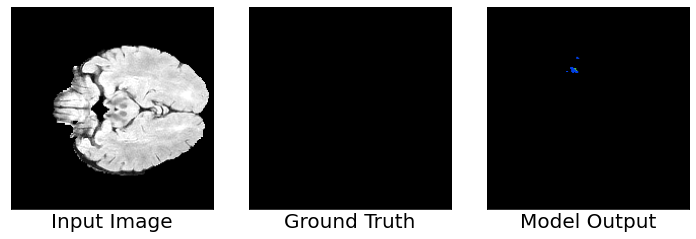

Steps: 246, L_xent:0.919169008731842, L_dice: 1.0
Total Loss: 1.9191689491271973
Accurary: 0.9990249872207642
Seq: TC, ET, WT
Dice coefficient: [0.9725, 0.985, 0.9816666666666667]
Gradient min:-0.0595560260117054, max:0.11228092014789581



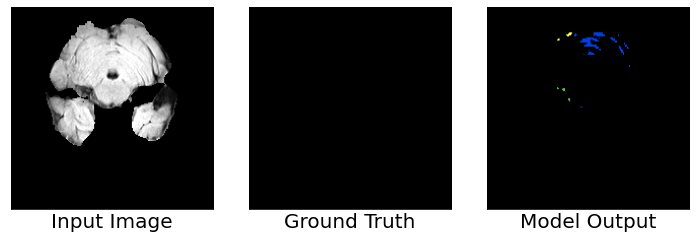

Steps: 247, L_xent:1.0473994016647339, L_dice: 1.0
Total Loss: 2.0473995208740234
Accurary: 0.9939000010490417
Seq: TC, ET, WT
Dice coefficient: [0.9125, 0.95, 0.9316666666666666]
Gradient min:-0.12304005771875381, max:0.13332058489322662



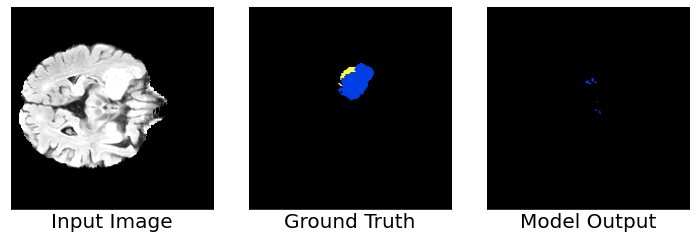

Steps: 248, L_xent:0.9888217449188232, L_dice: 1.0
Total Loss: 1.9888217449188232
Accurary: 0.9794750213623047
Seq: TC, ET, WT
Dice coefficient: [0.8983895449340343, 1.0, 0.9055930299560229]
Gradient min:-0.09021647274494171, max:0.07019743323326111



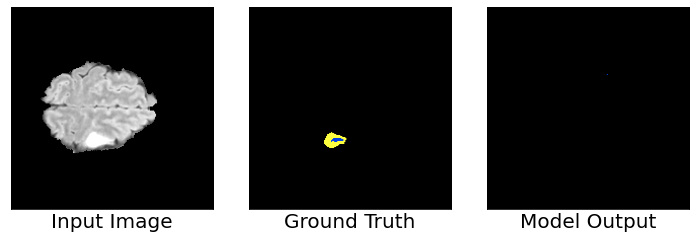

Steps: 249, L_xent:0.9409019947052002, L_dice: 1.0
Total Loss: 1.9409019947052002
Accurary: 0.9943000078201294
Seq: TC, ET, WT
Dice coefficient: [0.9875, 1.0, 0.965]
Gradient min:-0.027439000084996223, max:0.0412466786801815



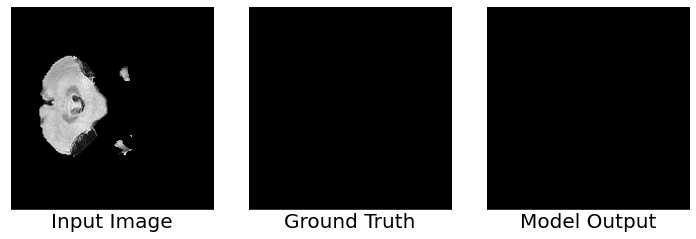

Steps: 250, L_xent:0.9019794464111328, L_dice: 1.0
Total Loss: 1.9019794464111328
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.043643247336149216, max:0.03725516051054001



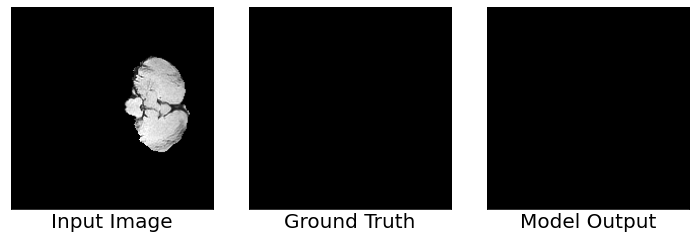

Steps: 251, L_xent:0.8939722776412964, L_dice: 1.0
Total Loss: 1.8939722776412964
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.02911290153861046, max:0.04148717224597931



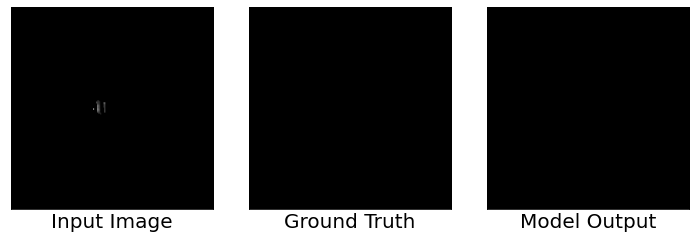

Steps: 252, L_xent:0.8788447380065918, L_dice: 1.0
Total Loss: 1.8788447380065918
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.028808075934648514, max:0.025705697014927864



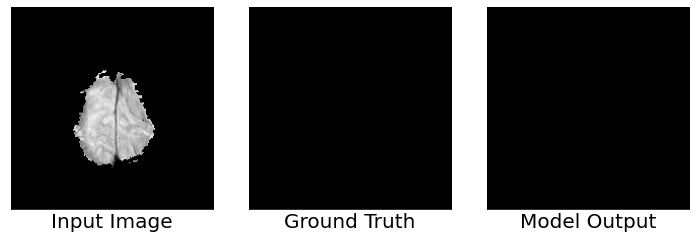

Steps: 253, L_xent:0.9942876100540161, L_dice: 1.0
Total Loss: 1.9942876100540161
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.06900974363088608, max:0.03638840094208717



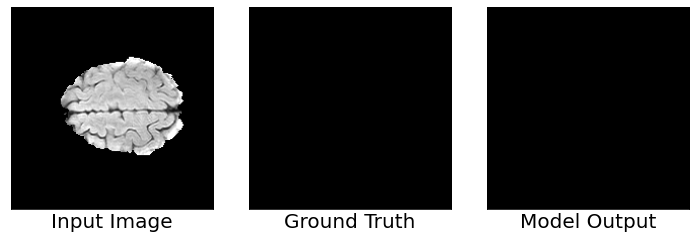

Steps: 254, L_xent:0.9198228716850281, L_dice: 1.0
Total Loss: 1.9198229312896729
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.04989171400666237, max:0.047914985567331314



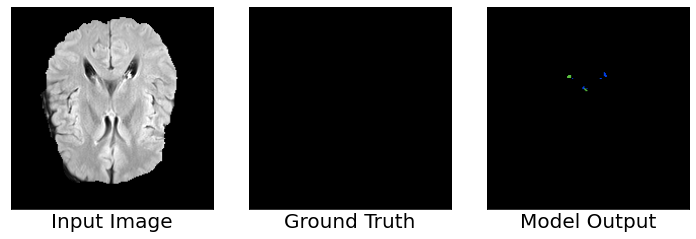

Steps: 255, L_xent:0.887364387512207, L_dice: 1.0
Total Loss: 1.887364387512207
Accurary: 0.9991250038146973
Seq: TC, ET, WT
Dice coefficient: [0.9625, 0.97, 0.975]
Gradient min:-0.06627611070871353, max:0.07863109558820724



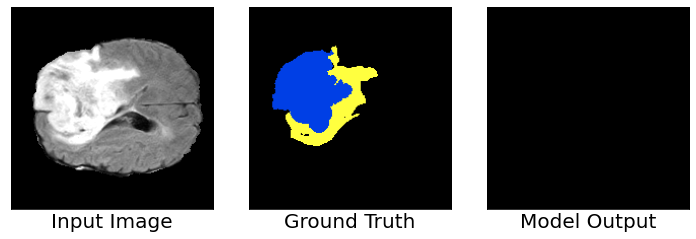

Steps: 256, L_xent:1.534968614578247, L_dice: 1.0
Total Loss: 2.534968614578247
Accurary: 0.8452749848365784
Seq: TC, ET, WT
Dice coefficient: [0.795, 1.0, 0.6983333333333334]
Gradient min:-0.31481680274009705, max:0.23149137198925018



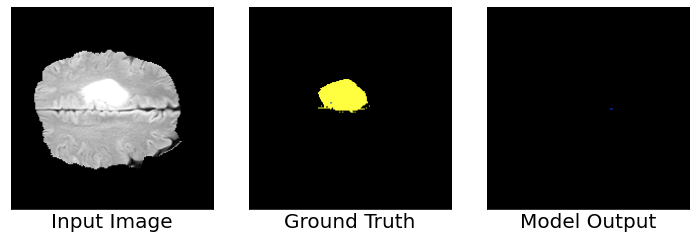

Steps: 257, L_xent:0.973688542842865, L_dice: 1.0
Total Loss: 1.9736886024475098
Accurary: 0.9713749885559082
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9416666666666667]
Gradient min:-0.07457809150218964, max:0.08221069723367691



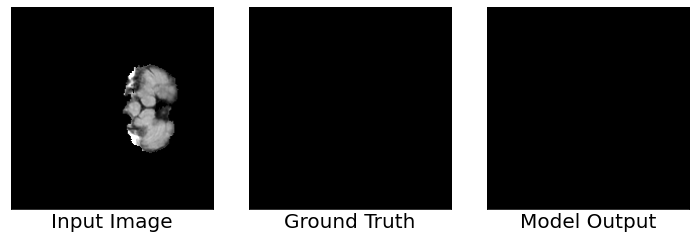

Steps: 258, L_xent:0.8627284169197083, L_dice: 1.0
Total Loss: 1.8627283573150635
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.04737924039363861, max:0.05765535309910774



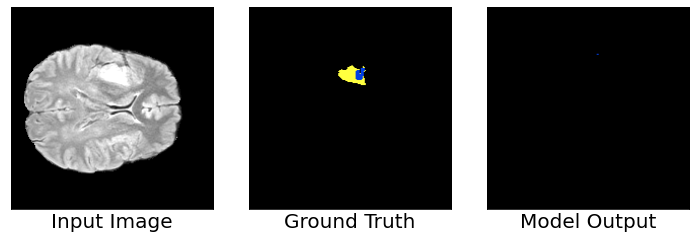

Steps: 259, L_xent:0.882270336151123, L_dice: 1.0
Total Loss: 1.882270336151123
Accurary: 0.9912750124931335
Seq: TC, ET, WT
Dice coefficient: [0.9675, 1.0, 0.945]
Gradient min:-0.0415133573114872, max:0.027912497520446777



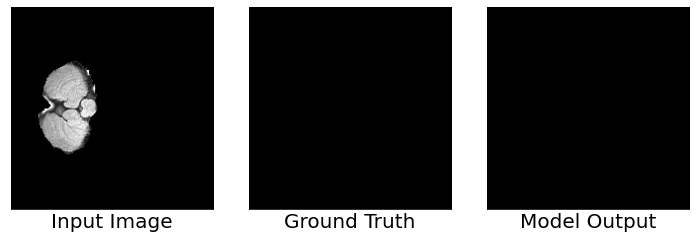

Steps: 260, L_xent:0.8564204573631287, L_dice: 1.0
Total Loss: 1.8564205169677734
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.09270671010017395, max:0.10461901873350143



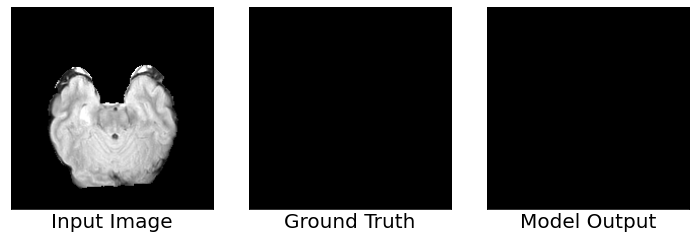

Steps: 261, L_xent:0.8730623126029968, L_dice: 1.0
Total Loss: 1.8730623722076416
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.035065826028585434, max:0.041527003049850464



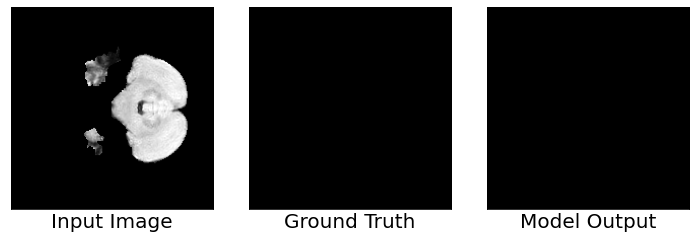

Steps: 262, L_xent:1.0998636484146118, L_dice: 1.0
Total Loss: 2.0998635292053223
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.07521846145391464, max:0.07310082018375397



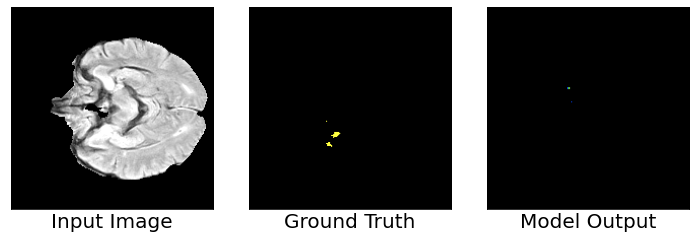

Steps: 263, L_xent:0.8924958109855652, L_dice: 1.0
Total Loss: 1.89249587059021
Accurary: 0.9986749887466431
Seq: TC, ET, WT
Dice coefficient: [0.9875, 0.99, 0.9716666666666667]
Gradient min:-0.08322104811668396, max:0.11769761145114899



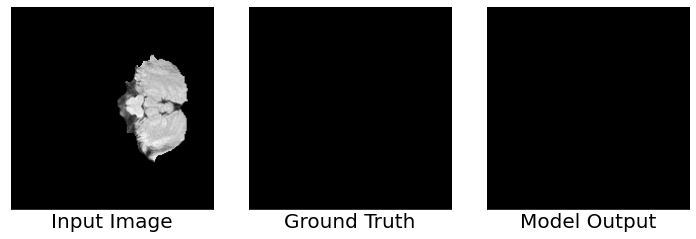

Steps: 264, L_xent:0.9514394998550415, L_dice: 1.0
Total Loss: 1.9514394998550415
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.04712505638599396, max:0.04146306961774826



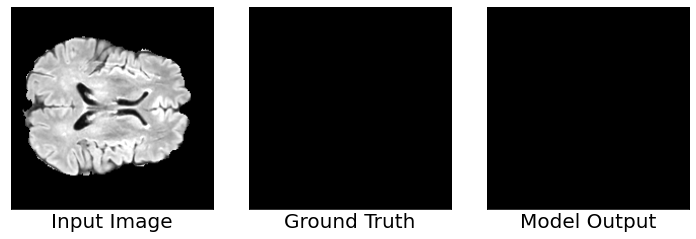

Steps: 265, L_xent:0.8875697255134583, L_dice: 1.0
Total Loss: 1.8875696659088135
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.0757775604724884, max:0.06038885936141014



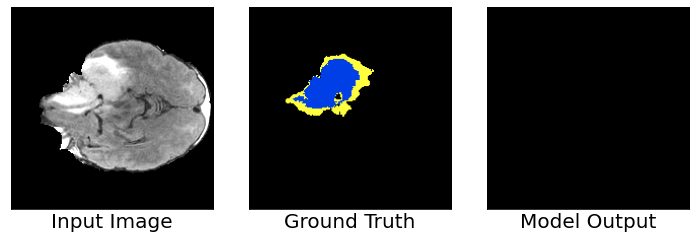

Steps: 266, L_xent:1.0696234703063965, L_dice: 1.0
Total Loss: 2.0696234703063965
Accurary: 0.9273499846458435
Seq: TC, ET, WT
Dice coefficient: [0.8775, 1.0, 0.815]
Gradient min:-0.09403370320796967, max:0.09733010083436966



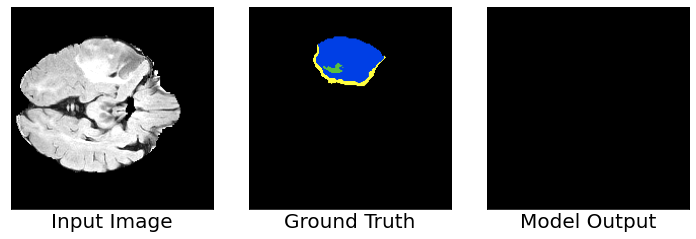

Steps: 267, L_xent:1.5440199375152588, L_dice: 0.9935423731803894
Total Loss: 2.537562370300293
Accurary: 0.9370499849319458
Seq: TC, ET, WT
Dice coefficient: [0.86, 0.95, 0.8383333333333334]
Gradient min:-0.24256157875061035, max:0.1276264786720276



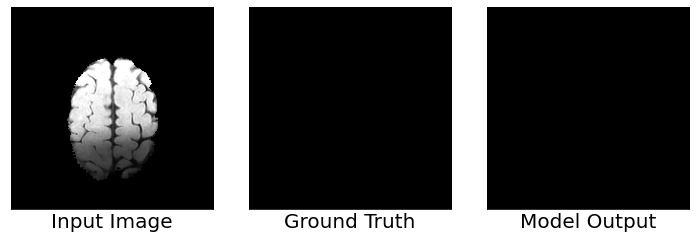

Steps: 268, L_xent:0.843246579170227, L_dice: 1.0
Total Loss: 1.843246579170227
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.051945317536592484, max:0.03727235645055771



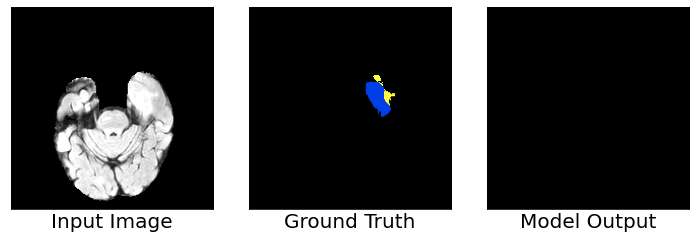

Steps: 269, L_xent:0.9017004370689392, L_dice: 1.0
Total Loss: 1.901700496673584
Accurary: 0.9845499992370605
Seq: TC, ET, WT
Dice coefficient: [0.9125, 1.0, 0.8966666666666666]
Gradient min:-0.024477336555719376, max:0.03482581675052643



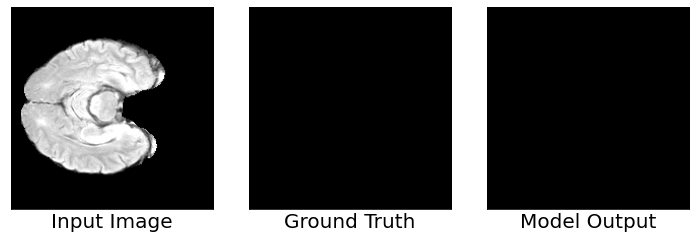

Steps: 270, L_xent:0.8194504976272583, L_dice: 1.0
Total Loss: 1.8194504976272583
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.05310194939374924, max:0.03928275406360626



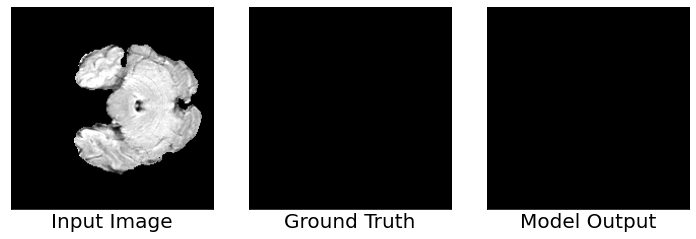

Steps: 271, L_xent:1.1795880794525146, L_dice: 1.0
Total Loss: 2.1795880794525146
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.10170570015907288, max:0.09259682148694992



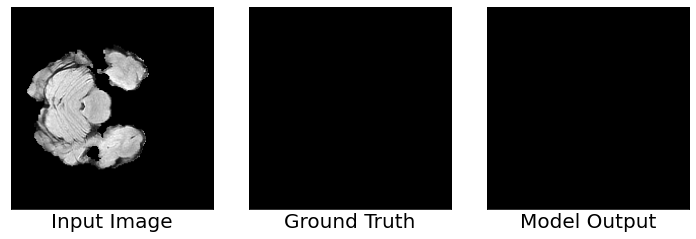

Steps: 272, L_xent:0.8098127841949463, L_dice: 1.0
Total Loss: 1.8098127841949463
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.058775756508111954, max:0.05513101443648338



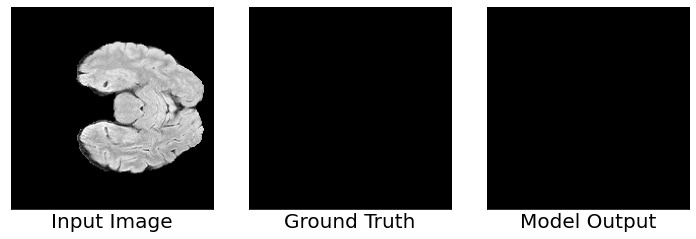

Steps: 273, L_xent:0.8116970658302307, L_dice: 1.0
Total Loss: 1.811697006225586
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.03265754133462906, max:0.029087625443935394



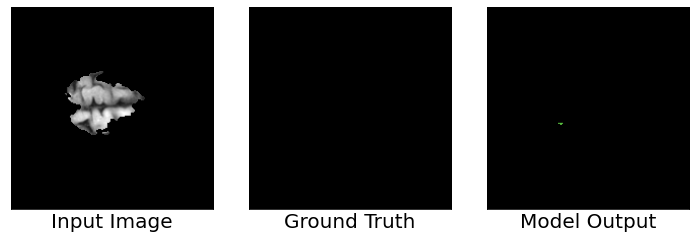

Steps: 274, L_xent:0.8473700284957886, L_dice: 1.0
Total Loss: 1.8473700284957886
Accurary: 0.9998250007629395
Seq: TC, ET, WT
Dice coefficient: [0.995, 0.99, 0.9966666666666667]
Gradient min:-0.04248112067580223, max:0.040062420070171356



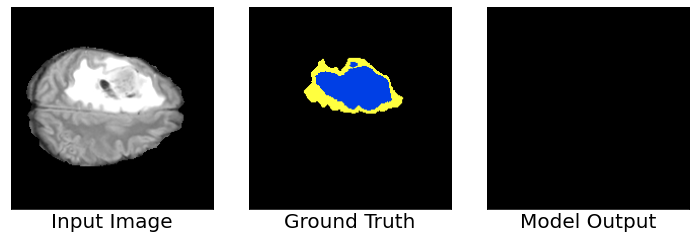

Steps: 275, L_xent:1.2106742858886719, L_dice: 1.0
Total Loss: 2.210674285888672
Accurary: 0.90829998254776
Seq: TC, ET, WT
Dice coefficient: [0.88, 1.0, 0.8283333333333334]
Gradient min:-0.20526067912578583, max:0.13298399746418



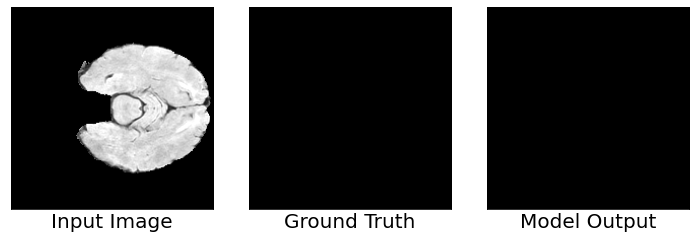

Steps: 276, L_xent:0.8069688081741333, L_dice: 1.0
Total Loss: 1.8069688081741333
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.04941859096288681, max:0.09258388727903366



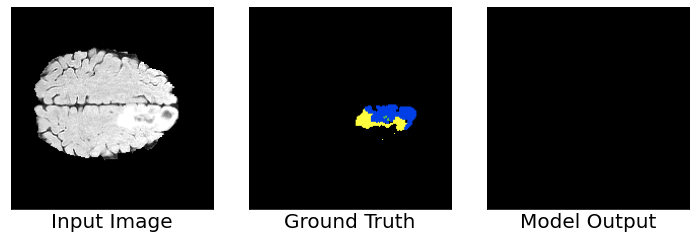

Steps: 277, L_xent:1.145498514175415, L_dice: 0.9979338645935059
Total Loss: 2.143432378768921
Accurary: 0.972599983215332
Seq: TC, ET, WT
Dice coefficient: [0.925, 0.975, 0.91]
Gradient min:-0.1401318907737732, max:0.11669818311929703



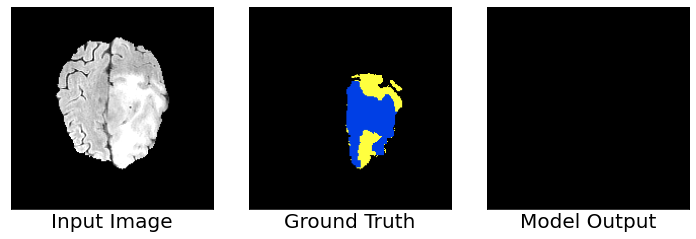

Steps: 278, L_xent:1.6831109523773193, L_dice: 0.9966635704040527
Total Loss: 2.679774522781372
Accurary: 0.9087499976158142
Seq: TC, ET, WT
Dice coefficient: [0.7875, 1.0, 0.725]
Gradient min:-0.2546788156032562, max:0.2005946785211563



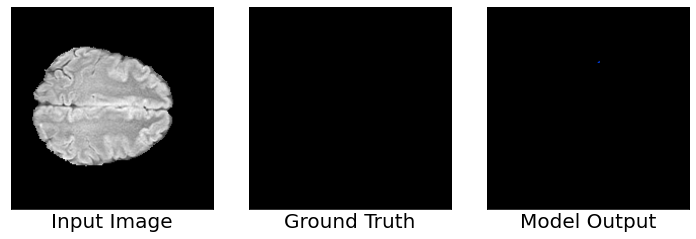

Steps: 279, L_xent:0.7757009863853455, L_dice: 1.0
Total Loss: 1.7757010459899902
Accurary: 0.9999250173568726
Seq: TC, ET, WT
Dice coefficient: [0.995, 1.0, 0.9966666666666667]
Gradient min:-0.07736325263977051, max:0.08925940841436386



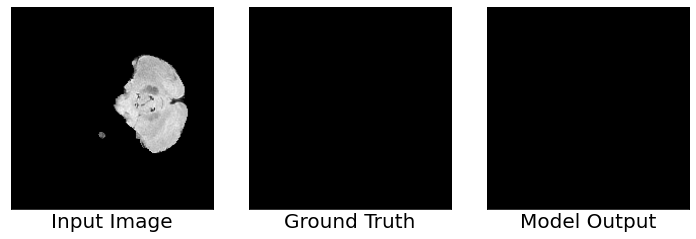

Steps: 280, L_xent:1.1157588958740234, L_dice: 0.934128999710083
Total Loss: 2.0498878955841064
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.34034159779548645, max:0.19866037368774414



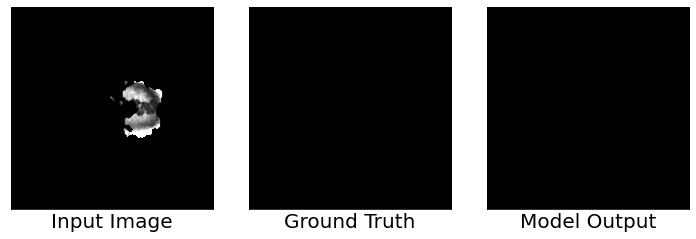

Steps: 281, L_xent:0.8244342803955078, L_dice: 1.0
Total Loss: 1.8244342803955078
Accurary: 1.0
Seq: TC, ET, WT
Dice coefficient: [1.0, 1.0, 1.0]
Gradient min:-0.030604345723986626, max:0.0366620197892189



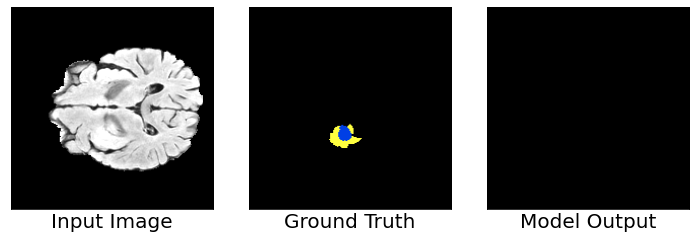

Steps: 282, L_xent:0.8763824701309204, L_dice: 1.0
Total Loss: 1.8763824701309204
Accurary: 0.9886000156402588
Seq: TC, ET, WT
Dice coefficient: [0.96, 1.0, 0.9333333333333333]
Gradient min:-0.046765074133872986, max:0.04092865809798241



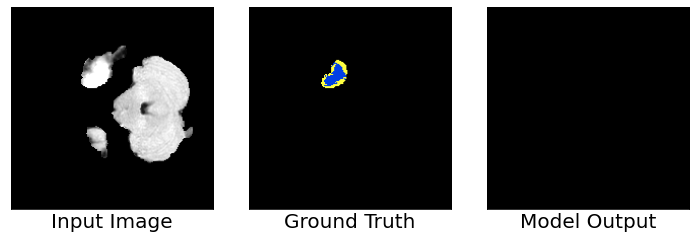

Steps: 283, L_xent:0.826147198677063, L_dice: 1.0
Total Loss: 1.826147198677063
Accurary: 0.9884999990463257
Seq: TC, ET, WT
Dice coefficient: [0.94, 1.0, 0.9133333333333333]
Gradient min:-0.0355069600045681, max:0.043254438787698746



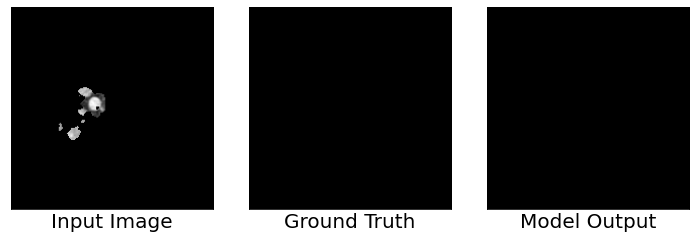

KeyboardInterrupt: 

In [8]:
pre_epochs = 0
max_epochs = 20
#remainder epochs 
re_epochs = max_epochs - pre_epochs 
if pre_epochs!=0:
    model.load_weights('/home/kevinteng/Desktop/model_weights/model_{}.h5'.format(ver))
    upp_bound = re_epochs
else:
    upp_bound = max_epochs
    
epochs = 1
#list
loss_list = []
start_runtime = time.time()
while epochs <= upp_bound:
    start = time.time()
    print()
    print("Epochs {:2d}".format(epochs))
    steps = 1
    ds = os.listdir(tfrecords_read_dir)
    #shuffle directory list of tfrecords
    shuffle = random.shuffle(ds)
    loss_inner = []
    for tf_re in ds:
        tf_dir = os.path.join(tfrecords_read_dir+tf_re)
        dataset = utils.parse_tfrecord(tf_dir).shuffle(SHUFFLE_BUFFER).batch(BATCH_SIZE)
        for imgs in dataset:
            #data augmentation
            imgs = data_aug(imgs)
            #crop images
            image = imgs[:,20:220,20:220,:4]
            #unprocessed label for plotting (cropped)
            label = imgs[:,20:220,20:220,-1]
            #for simplicity label 4 will be converted to 3 for sparse encoding
            label = tf.where(label==4,3,label)
            label = tf.keras.utils.to_categorical(label, num_classes=4)
            #--------------<training function>----------------------------
            img_seg, loss, gradients = train_fn(image, label) 
            #map from sparse to label
            img_seg = tf.math.argmax(img_seg,-1,output_type=tf.int32)
            label = tf.math.argmax(label,-1,output_type=tf.int32)
            #accuracy of the output values for that batch
            acc = tf.reduce_mean(tf.cast(tf.equal(img_seg,label), tf.float32))
            #store loss total for every steps
            loss_inner.append(loss[-1].numpy())
            #save weights for every 5 epochs 
            if epochs%5==0:
                model.save_weights('/home/kevinteng/Desktop/model_weights/model_{}.h5'.format(ver))
            #output
            if steps%1==0:
                input_img = [image[0,:,:,0], plot_labels_color(label[0]), plot_labels_color(img_seg[0])]
                caption = ['Input Image', 'Ground Truth', 'Model Output']
                plot_comparison(input_img, caption, n_col = 3, figsize=(10,10))
                acc_stp = tf.reduce_mean(tf.cast(tf.equal(img_seg[0],label[0]), tf.float32))
                dc_list_stp =compute_metric_dc(label[0],img_seg[0])
                print("Steps: {}, L_xent:{}, L_dice: {}".format(steps, loss[0].numpy(), loss[1].numpy()))
                print("Total Loss: {}".format(loss[-1].numpy()))
                print("Accurary: {}".format(acc_stp))
                print("Seq: TC, ET, WT")
                print("Dice coefficient: {}".format(dc_list_stp))
                print("Gradient min:{}, max:{}".format(np.min(gradients[0]), np.max(gradients[0])))
            steps+=1
    loss_list.append(np.mean(loss_inner))
    #end time per epochs 
    elapsed_time =(time.time()-start)/60 #unit in mins
    print("Compute time per epochs: {:.2f} mins".format(elapsed_time))
    epochs+=1
#end time for total epochs
elapsed_time_runtime = (time.time()-start_runtime)/60
print()
print('----------------------------------<END>---------------------------------')
print("Total run time for {} epochs: {:.2f} mins".format(epochs-1, elapsed_time_runtime))

---

# Save Weights

In [ ]:
model.save_weights('/home/kevinteng/Desktop/model_weights/model_{}.h5'.format(ver))

In [ ]:
def plot_loss(loss_list, xlabel, ylabel, title):
    '''
    :param loss_list: List containing total loss values
    :param recon_list: List containing reconstruction loss
    :param xlabel: string for xlabel
    :param ylabel: string for ylabel
    :param title: string for title
    :return: loss value plot
    '''
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(linestyle='dotted')
    plt.plot(loss_list)

xlabel = 'epochs'
ylabel = 'Total Loss'
title = 'Loss per epoch'
plot_loss(loss_list, xlabel, ylabel, title)

---

# Validation 

In [ ]:
model.load_weights('/home/kevinteng/Desktop/model_weights/model_{}.h5'.format(ver))
def output_fn(image):
    b,w,h,c = image.shape
    model.trainable = False
    _, model_output,_,_ = model(image)
    # we need [240,240,155] to input into cloud validation
    if w!=240:
        #padding constant
        p = int(240-w)//2
        padding = tf.constant([[0,0],[p,p],[p,p],[0,0]]) #p=20
        model_output = tf.pad(model_output, padding, "CONSTANT")
    return model_output

In [ ]:
ds = '/home/kevinteng/Desktop/ssd02/BraTS2020_preprocessed05/'
save_path = '/home/kevinteng/Desktop/ssd02/submission/'
actual_label = '/home/kevinteng/Desktop/ssd02/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_seg.nii.gz'
#all brain affine are the same just pick one 
brain_affine = nib.load(actual_label).affine
for train_or_val in sorted(os.listdir(ds)):
    save_dir = save_path + train_or_val+'_'+ver
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    merge01 = os.path.join(ds+train_or_val)
    for patient in sorted(os.listdir(merge01)):
        patient_id = patient.split('.')[0]
        merge02 = os.path.join(merge01,patient)
        imgs = np.load(merge02)
        image = imgs[:,20:220,20:220,:4]
        seg_output = 0 #flush RAM
        seg_output = np.zeros((240,240,155))
        for i in range(image.shape[0]):
            inp = tf.expand_dims(image[i],0)
            img_seg = output_fn(inp) #validation function 
            #map from sparse to label
            seg_output[:,:,i] = np.argmax(img_seg,-1) 
        #convert label from 4 to 3 and np array and cast as int
        seg_output= np.where(seg_output==3,4,seg_output).astype(np.uint8)
        prediction_ni = nib.Nifti1Image(seg_output, brain_affine)
        prediction_ni.to_filename(save_dir+'/{}.nii.gz'.format(patient_id))

---

# Model Summary

In [ ]:
model.summary()